# Homework 1
In this homework, we will have you train some convolutional neural networks! We will start with a small dataset (CIFAR), and then work our way up to TinyImageNet! This homework originally written by Daniel Gordon with very minor modifications.

# Initial Setup

This will authenticate Colab to connect to your google drive account. This way you have space to store the datasets and won't have to redownload them every time. You'll also have stable storage to save your best performing networks.

In [ ]:
from google.colab import drive
drive.mount('/gdrive/')
!ls /gdrive

Drive already mounted at /gdrive/; to attempt to forcibly remount, call drive.mount("/gdrive/", force_remount=True).
'My Drive'  'Shared drives'


Run this code to navigate to the BASE_PATH directory and upload the homework2.tar file inside the BASE_PATH, then extract it.

Have a look at [pt_util](https://gist.github.com/pjreddie/e531394d779af2da9201096af0dba78a). We moved some of the useful functions out of the python notebook to make it less cluttered, and added a few more useful functions.

I made the BASE_PATH and DATA_PATH variables so you don't have to copy the same strings all over the place if you want to move the locations of the files around.

In [ ]:
import os

BASE_PATH = '/gdrive/My Drive/colab_files/hw1/'
if not os.path.exists(BASE_PATH):
    os.makedirs(BASE_PATH)
DATA_PATH = BASE_PATH + 'tiny_imagenet/'

!pwd
!ls
os.chdir(BASE_PATH)
if not os.path.exists(DATA_PATH + 'train.h5'):
    !wget https://courses.cs.washington.edu/courses/cse599g1/19au/files/homework2.tar
    !tar -xvf homework2.tar
    !rm homework2.tar
!pwd
!ls
os.chdir('/content')

/content
sample_data
/gdrive/My Drive/colab_files/hw1
cifar  pt_util.py  __pycache__	tiny_imagenet


# CIFAR

## Part 1: Getting the Dataset
Normally, we'd want to download our dataset first. Since PyTorch hosts the CIFAR dataset, we can load it using their helper function later.

But, we'll change DATA_PATH to an empty directory to download the dataset to.

In [ ]:
DATA_PATH = BASE_PATH + 'cifar/'

## Part 2: Defining the Network
Just like with MNIST last homework we need to define our network architecture. This time we will be using convolutional layers and maxpooling to extract features from our images before we feed those features into our final classifier.

Check out the documentation for [nn.Conv2d](https://pytorch.org/docs/stable/generated/torch.nn.Conv2d.html):

    nn.Conv2d(in_channels, out_channels, kernel_size, stride = 1, padding = 0,...)

So the first parameter is the number of channels in the input. Second is the number of filters we'll use (AKA number of channels in the output). Third is kernel size. Next is stride and padding which are optional and have default values.

In [ ]:
import torch
import torch.nn as nn
from torchvision import datasets
from torchvision import transforms
import numpy as np
import os
import torch.nn.functional as F
import torch.optim as optim
import h5py
import sys
sys.path.append(BASE_PATH)
import pt_util

In [ ]:
class CifarNet(nn.Module):
    def __init__(self):
        super(CifarNet, self).__init__()
        self.conv1 = nn.Conv2d(3, 16, 3, stride=2, padding=1)
        self.conv2 = nn.Conv2d(16, 32, 3, stride=2, padding=1)
        self.conv3 = nn.Conv2d(32, 64, 3, stride=2, padding=1)
        self.fc1 = nn.Linear(1024, 10)
        self.accuracy = None

    def forward(self, x):
        x = self.conv1(x)
        x = F.relu(x)
        x = self.conv2(x)
        x = F.relu(x)
        x = self.conv3(x)
        x = F.relu(x)
        x = torch.flatten(x, 1)
        x = self.fc1(x)
        return x

    def loss(self, prediction, label, reduction='mean'):
        loss_val = F.cross_entropy(prediction, label.squeeze(), reduction=reduction)
        return loss_val

    def save_model(self, file_path, num_to_keep=1):
        pt_util.save(self, file_path, num_to_keep)
        
    def save_best_model(self, accuracy, file_path, num_to_keep=1):
        if self.accuracy == None or accuracy > self.accuracy:
            self.accuracy = accuracy
            self.save_model(file_path, num_to_keep)

    def load_model(self, file_path):
        pt_util.restore(self, file_path)

    def load_last_model(self, dir_path):
        return pt_util.restore_latest(self, dir_path)


This time we are giving you the train and test functions, but feel free to modify them if you want. 

You may need to return some additional information for the logging portion of this assignment.


In [ ]:
import time
def train(model, device, train_loader, optimizer, epoch, log_interval):
    #print("In train function")
    model.train()
    #print("VTHOMA debug 0")
    losses = []
    correct = 0
    
    for batch_idx, (data, label) in enumerate(train_loader):
        #print("VTHOMA debug 1")
        data, label = data.to(device), label.to(device)
        #print("VTHOMA debug 2")
        optimizer.zero_grad()
        #print("VTHOMA debug 3")
        output = model(data)
        loss = model.loss(output, label)
        pred = output.max(1)[1]
        correct_mask = pred.eq(label.view_as(pred))
        num_correct = correct_mask.sum().item()
        correct += num_correct
        losses.append(loss.item())
        loss.backward()
        optimizer.step()
        if batch_idx % log_interval == 0:
            print('{} Train Epoch: {} [{}/{} ({:.0f}%)]\tLoss: {:.6f}'.format(
                time.ctime(time.time()),
                epoch, batch_idx * len(data), len(train_loader.dataset),
                100. * batch_idx / len(train_loader), loss.item()))

    train_accuracy = 100 * correct /len(train_loader.dataset)
    #print("Training accuracy:", train_accuracy)
    print('\nTrain set: Average loss: {:.4f}, Accuracy: {}/{} ({:.0f}%)\n'.format(
        np.mean(losses), correct, len(train_loader.dataset), train_accuracy))
    
    #return np.mean(losses)  
    return np.mean(losses), train_accuracy


def test(model, device, test_loader, log_interval=None):
    model.eval()
    test_loss = 0
    correct = 0

    with torch.no_grad():
        for batch_idx, (data, label) in enumerate(test_loader):
            data, label = data.to(device), label.to(device)
            output = model(data)
            test_loss_on = model.loss(output, label, reduction='sum').item()
            test_loss += test_loss_on
            pred = output.max(1)[1]
            correct_mask = pred.eq(label.view_as(pred))
            num_correct = correct_mask.sum().item()
            correct += num_correct
            if log_interval is not None and batch_idx % log_interval == 0:
                print('{} Test: [{}/{} ({:.0f}%)]\tLoss: {:.6f}'.format(
                    time.ctime(time.time()),
                    batch_idx * len(data), len(test_loader.dataset),
                    100. * batch_idx / len(test_loader), test_loss_on))

    test_loss /= len(test_loader.dataset)
    test_accuracy = 100. * correct / len(test_loader.dataset)

    print('\nTest set: Average loss: {:.4f}, Accuracy: {}/{} ({:.0f}%)\n'.format(
        test_loss, correct, len(test_loader.dataset), test_accuracy))
    return test_loss, test_accuracy


## Part 3 and 4: Loading Data and Dataset Augmentation

In the MNIST assignment, we didn't do any data augmentation because MNIST is kind of easy.

In this assignment, you may find that data augmentation helps you a lot (or possibly hurts your performance).

You can find a bunch preimplemented here https://pytorch.org/docs/stable/torchvision/transforms.html and you can also do your own as seen in the tutorial from part 3.

Play around with various data augmentations we will suggest some.

- ToPILImage - This one is useful for a lot of the built in transforms which expect PIL images. 
- RandomHorizontalFlip
- RandomResizedCrop
- ColorJitter
- RandomRotation
- Normalize
- Adding various types of noise
- ToTensor - PyTorch expects the output from the dataset to be a tensor in CxHxW format.


Note: You should be careful about which of these you apply to the test data. You usually don't want to apply noise to the test data, but you do want to normalize it in the same way for example.

In [ ]:
transform_train = transforms.Compose([
    transforms.RandomCrop(32, padding=4),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
  
    ####### Adding other transforms ############
    #COMMENTED BY VTHOMA
    #transforms.CenterCrop(10),
    #transforms.RandomGrayscale(p=0.4),
    #transforms.Scale(), 
    #transforms.RandomRotation(90),
     
])

transform_test = transforms.Compose([
    transforms.ToTensor(),
])

data_train = datasets.CIFAR10(root=DATA_PATH, train=True, download=True, transform=transform_train)
data_test = datasets.CIFAR10(root=DATA_PATH, train=False, download=True, transform=transform_test)

Files already downloaded and verified
Files already downloaded and verified


## Part 5: Training the network
Generally, it is useful to see how your training is going. Often people print their loss to make sure it goes down and their accuracy to make sure it goes up. But pictures are better than words. So for this part, you should record and plot the training loss, test loss, and test accuracy (and whatever else you want). 

We have created a very simple logging interface which essentially just saves and restores files via pickle in pt_util. Saving and restoring log data is important if you end your run early and want to continue where you left off rather than starting over.

We have also provided a plot function which can plot a single line graph. You can use it and plot each value independently, or change it to plot them all in one graph. 

Try different network architectures and experiment with hyperparameters. You'll answer the questions at the bottom of the file based on these experiments.


__Important note: Do not forget to title your graphs and label your axes. Plots are meaningless without a way to read them.__

Second Note: It will be helpful for you when deciding what network structure, data augmentation, and such work to title the graphs accordingly so you remember.

Third Note: The default setup right now saves and restores the network weights from a single folder. When you modify network architectures, you may want to increment your experiment version number so you start over with your training and log files.

Using device cuda
num cpus: 2

Test set: Average loss: 2.3020, Accuracy: 878/10000 (9%)

Just before the try loop
start_epoch= 0
EPOCHS= 20
epoch= 0
Thu Oct 29 07:24:35 2020 Train Epoch: 0 [0/50000 (0%)]	Loss: 2.306263
Thu Oct 29 07:24:40 2020 Train Epoch: 0 [25600/50000 (51%)]	Loss: 2.229336

Train set: Average loss: 2.2150, Accuracy: 8472/50000 (17%)


Test set: Average loss: 2.0210, Accuracy: 2922/10000 (29%)

Saved /gdrive/My Drive/colab_files/hw1/cifar/logs/0.1/000.pt

epoch= 1
Thu Oct 29 07:24:47 2020 Train Epoch: 1 [0/50000 (0%)]	Loss: 2.125268
Thu Oct 29 07:24:51 2020 Train Epoch: 1 [25600/50000 (51%)]	Loss: 1.973959

Train set: Average loss: 1.9756, Accuracy: 14268/50000 (29%)


Test set: Average loss: 1.8535, Accuracy: 3498/10000 (35%)

Saved /gdrive/My Drive/colab_files/hw1/cifar/logs/0.1/001.pt

epoch= 2
Thu Oct 29 07:24:58 2020 Train Epoch: 2 [0/50000 (0%)]	Loss: 1.908828
Thu Oct 29 07:25:02 2020 Train Epoch: 2 [25600/50000 (51%)]	Loss: 1.796921

Train set: Average loss: 1

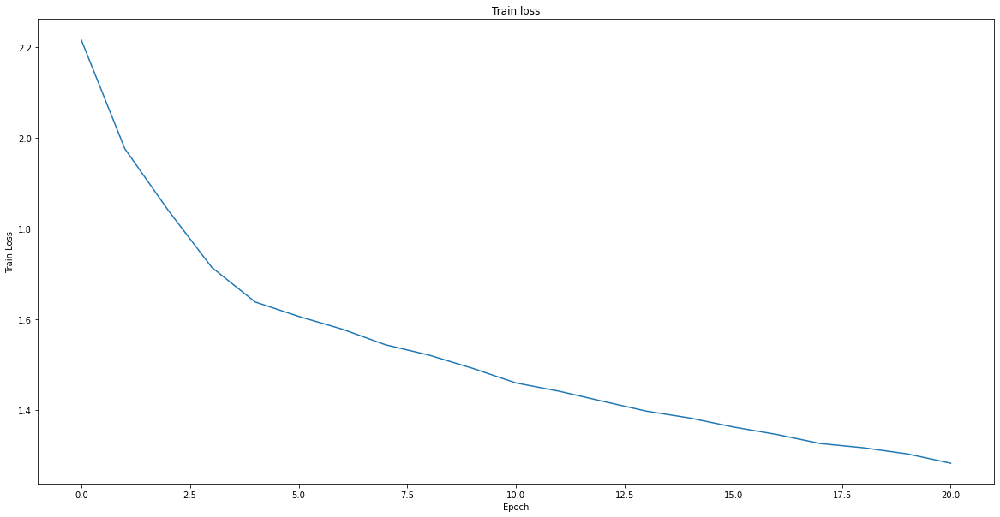

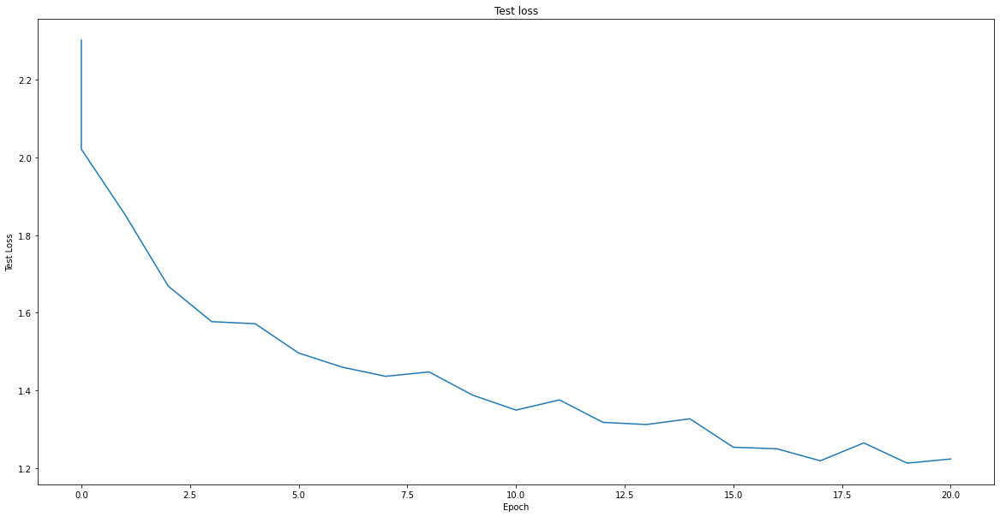

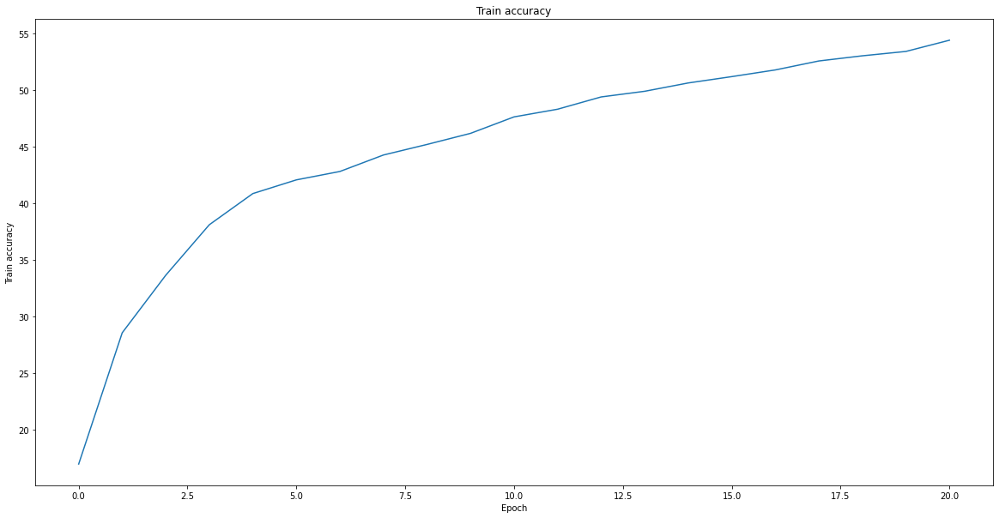

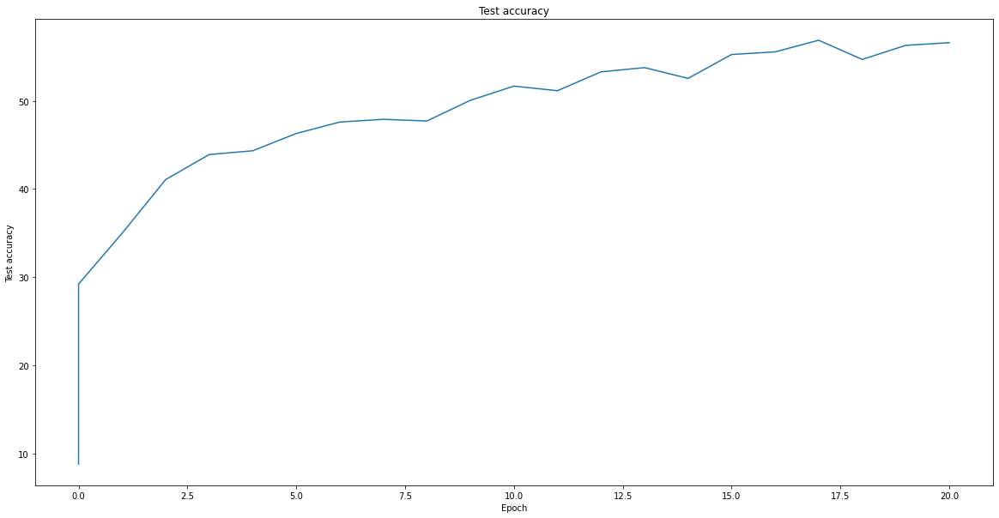

In [ ]:
# Play around with these constants, you may find a better setting. 
# Test accuracy => 57%
# Train accuracy => 54%
BATCH_SIZE = 256
TEST_BATCH_SIZE = 10
EPOCHS = 20
LEARNING_RATE = 0.01
MOMENTUM = 0.9
USE_CUDA = True
SEED = 0
PRINT_INTERVAL = 100
WEIGHT_DECAY = 0.0005

EXPERIMENT_VERSION = "0.1" # increment this to start a new experiment
LOG_PATH = DATA_PATH + 'logs/' + EXPERIMENT_VERSION + '/'

# Now the actual training code
use_cuda = USE_CUDA and torch.cuda.is_available()

torch.manual_seed(SEED) #Uncommented by VTHOMA

device = torch.device("cuda" if use_cuda else "cpu")
print('Using device', device)
import multiprocessing
print('num cpus:', multiprocessing.cpu_count())

kwargs = {'num_workers': multiprocessing.cpu_count(),
          'pin_memory': True} if use_cuda else {}

class_names = ['plane', 'car', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']

train_loader = torch.utils.data.DataLoader(data_train, batch_size=BATCH_SIZE,
                                           shuffle=True, **kwargs)
test_loader = torch.utils.data.DataLoader(data_test, batch_size=TEST_BATCH_SIZE,
                                          shuffle=False, **kwargs)

model = CifarNet().to(device)
optimizer = optim.SGD(model.parameters(), lr=LEARNING_RATE, momentum=MOMENTUM, weight_decay=WEIGHT_DECAY)
start_epoch = model.load_last_model(LOG_PATH)

train_losses, test_losses, train_accuracies, test_accuracies = pt_util.read_log(LOG_PATH + 'log.pkl', ([], [], [], []))
test_loss, test_accuracy = test(model, device, test_loader)

test_losses.append((start_epoch, test_loss))
test_accuracies.append((start_epoch, test_accuracy))

print("Just before the try loop")

try:
    print("start_epoch=", start_epoch)
    print("EPOCHS=", EPOCHS)
    for epoch in range(start_epoch, EPOCHS + 1):
        print("epoch=", epoch)
        train_loss, train_accuracy = train(model, device, train_loader, optimizer, epoch, PRINT_INTERVAL)
        test_loss, test_accuracy = test(model, device, test_loader)
        train_losses.append((epoch, train_loss))
        train_accuracies.append((epoch, train_accuracy))
        test_losses.append((epoch, test_loss))
        test_accuracies.append((epoch, test_accuracy))
        pt_util.write_log(LOG_PATH + 'log.pkl', (train_losses, test_losses, train_accuracies, test_accuracies))
        model.save_best_model(test_accuracy, LOG_PATH + '%03d.pt' % epoch)


except KeyboardInterrupt as ke:
    print('Interrupted')
except:
    import traceback
    traceback.print_exc()
finally:
    model.save_model(LOG_PATH + '%03d.pt' % epoch, 0)
    ep, val = zip(*train_losses)
    pt_util.plot(ep, val, 'Train loss', 'Epoch', 'Train Loss')
    ep, val = zip(*test_losses)
    pt_util.plot(ep, val, 'Test loss', 'Epoch', 'Test Loss')
    ep, val = zip(*train_accuracies)
    pt_util.plot(ep, val, 'Train accuracy', 'Epoch', 'Train accuracy')
    ep, val = zip(*test_accuracies)
    pt_util.plot(ep, val, 'Test accuracy', 'Epoch', 'Test accuracy')


Using device cuda
num cpus: 2

Test set: Average loss: 2.3020, Accuracy: 878/10000 (9%)

Just before the try loop
start_epoch= 0
EPOCHS= 30
epoch= 0
Thu Oct 29 07:35:10 2020 Train Epoch: 0 [0/50000 (0%)]	Loss: 2.306263
Thu Oct 29 07:35:14 2020 Train Epoch: 0 [25600/50000 (51%)]	Loss: 1.809294

Train set: Average loss: 1.9829, Accuracy: 13691/50000 (27%)


Test set: Average loss: 1.6946, Accuracy: 3995/10000 (40%)

Saved /gdrive/My Drive/colab_files/hw1/cifar/logs/0.2/000.pt

epoch= 1
Thu Oct 29 07:35:21 2020 Train Epoch: 1 [0/50000 (0%)]	Loss: 1.917716
Thu Oct 29 07:35:26 2020 Train Epoch: 1 [25600/50000 (51%)]	Loss: 1.701384

Train set: Average loss: 1.6313, Accuracy: 20400/50000 (41%)


Test set: Average loss: 1.4867, Accuracy: 4666/10000 (47%)

Saved /gdrive/My Drive/colab_files/hw1/cifar/logs/0.2/001.pt

epoch= 2
Thu Oct 29 07:35:33 2020 Train Epoch: 2 [0/50000 (0%)]	Loss: 1.654795
Thu Oct 29 07:35:37 2020 Train Epoch: 2 [25600/50000 (51%)]	Loss: 1.456260

Train set: Average loss: 

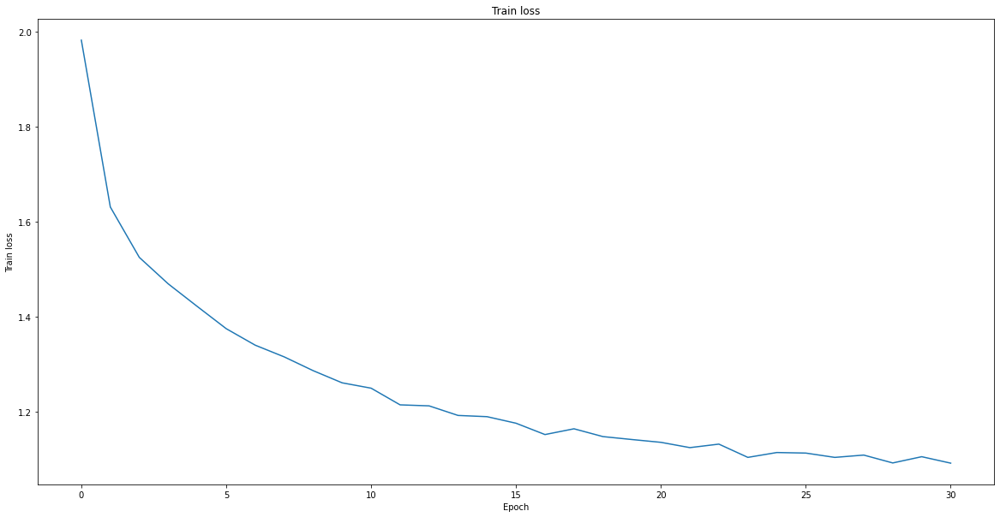

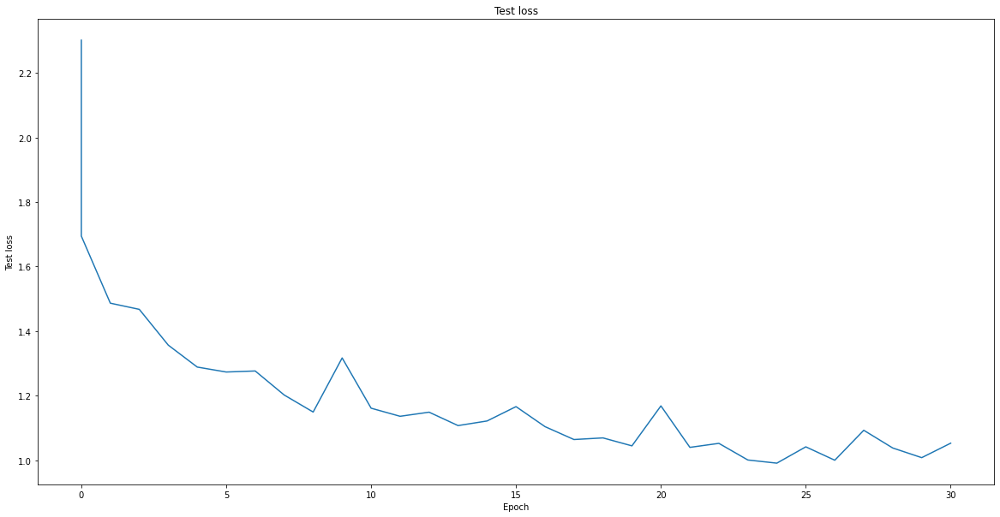

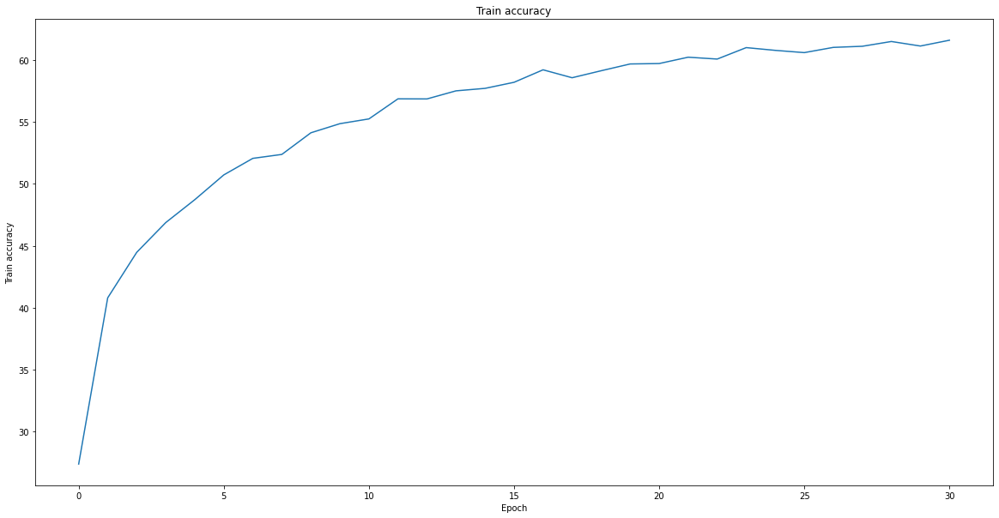

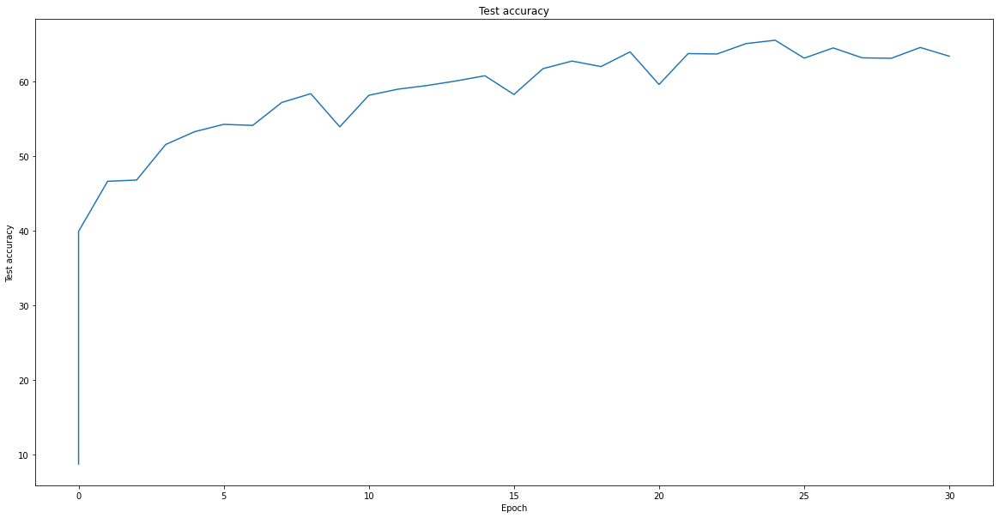

In [ ]:
# Experiment 0.2 ADDED BY VTHOMA 
# LR=0.1, EPOCHS=30, all other parameters same as default
# Test accuracy => 63%
# train accuracy => 62%
BATCH_SIZE = 256
TEST_BATCH_SIZE = 10
EPOCHS = 30
LEARNING_RATE = 0.1 #0.01
MOMENTUM = 0.9
USE_CUDA = True
SEED = 0
PRINT_INTERVAL = 100
WEIGHT_DECAY = 0.0005

EXPERIMENT_VERSION = "0.2" # increment this to start a new experiment
LOG_PATH = DATA_PATH + 'logs/' + EXPERIMENT_VERSION + '/'

# Now the actual training code
use_cuda = USE_CUDA and torch.cuda.is_available()

torch.manual_seed(SEED) #Uncommented by VTHOMA

device = torch.device("cuda" if use_cuda else "cpu")
print('Using device', device)
import multiprocessing
print('num cpus:', multiprocessing.cpu_count())

kwargs = {'num_workers': multiprocessing.cpu_count(),
          'pin_memory': True} if use_cuda else {}

class_names = ['plane', 'car', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']

train_loader = torch.utils.data.DataLoader(data_train, batch_size=BATCH_SIZE,
                                           shuffle=True, **kwargs)
test_loader = torch.utils.data.DataLoader(data_test, batch_size=TEST_BATCH_SIZE,
                                          shuffle=False, **kwargs)

model = CifarNet().to(device)
optimizer = optim.SGD(model.parameters(), lr=LEARNING_RATE, momentum=MOMENTUM, weight_decay=WEIGHT_DECAY)
start_epoch = model.load_last_model(LOG_PATH)

train_losses, test_losses, train_accuracies,test_accuracies = pt_util.read_log(LOG_PATH + 'log.pkl', ([], [], [], []))
test_loss, test_accuracy = test(model, device, test_loader)

test_losses.append((start_epoch, test_loss))
test_accuracies.append((start_epoch, test_accuracy))

print("Just before the try loop")

try:
    print("start_epoch=", start_epoch)
    print("EPOCHS=", EPOCHS)
    for epoch in range(start_epoch, EPOCHS + 1):
        print("epoch=", epoch)
        train_loss, train_accuracy = train(model, device, train_loader, optimizer, epoch, PRINT_INTERVAL)
        test_loss, test_accuracy = test(model, device, test_loader)
        train_losses.append((epoch, train_loss))
        train_accuracies.append((epoch,train_accuracy))
        test_losses.append((epoch, test_loss))
        test_accuracies.append((epoch, test_accuracy))
        pt_util.write_log(LOG_PATH + 'log.pkl', (train_losses, test_losses, train_accuracies,test_accuracies))
        model.save_best_model(test_accuracy, LOG_PATH + '%03d.pt' % epoch)


except KeyboardInterrupt as ke:
    print('Interrupted')
except:
    import traceback
    traceback.print_exc()
finally:
    model.save_model(LOG_PATH + '%03d.pt' % epoch, 0)
    ep, val = zip(*train_losses)
    pt_util.plot(ep, val, 'Train loss', 'Epoch', 'Train loss')
    ep, val = zip(*test_losses)
    pt_util.plot(ep, val, 'Test loss', 'Epoch', 'Test loss')
    ep, val = zip(*train_accuracies)
    pt_util.plot(ep, val, 'Train accuracy', 'Epoch', 'Train accuracy')
    ep, val = zip(*test_accuracies)
    pt_util.plot(ep, val, 'Test accuracy', 'Epoch', 'Test accuracy')


Files already downloaded and verified
Files already downloaded and verified
Experiment Version =  0.3
Using device cuda
num cpus: 2

Test set: Average loss: 2.3021, Accuracy: 955/10000 (10%)

epoch= 0
Thu Oct 29 10:28:25 2020 Train Epoch: 0 [0/50000 (0%)]	Loss: 2.433084
Thu Oct 29 10:28:30 2020 Train Epoch: 0 [25600/50000 (51%)]	Loss: 1.982880

Train set: Average loss: 2.2703, Accuracy: 12081/50000 (24%)


Test set: Average loss: 1.8616, Accuracy: 3019/10000 (30%)

Saved /gdrive/My Drive/colab_files/hw1/cifar/logs/0.3/000.pt

epoch= 1
Thu Oct 29 10:28:37 2020 Train Epoch: 1 [0/50000 (0%)]	Loss: 1.949506
Thu Oct 29 10:28:42 2020 Train Epoch: 1 [25600/50000 (51%)]	Loss: 1.642183

Train set: Average loss: 1.6900, Accuracy: 18653/50000 (37%)


Test set: Average loss: 1.8063, Accuracy: 3481/10000 (35%)

Saved /gdrive/My Drive/colab_files/hw1/cifar/logs/0.3/001.pt

epoch= 2
Thu Oct 29 10:28:49 2020 Train Epoch: 2 [0/50000 (0%)]	Loss: 1.650336
Thu Oct 29 10:28:54 2020 Train Epoch: 2 [25600/50

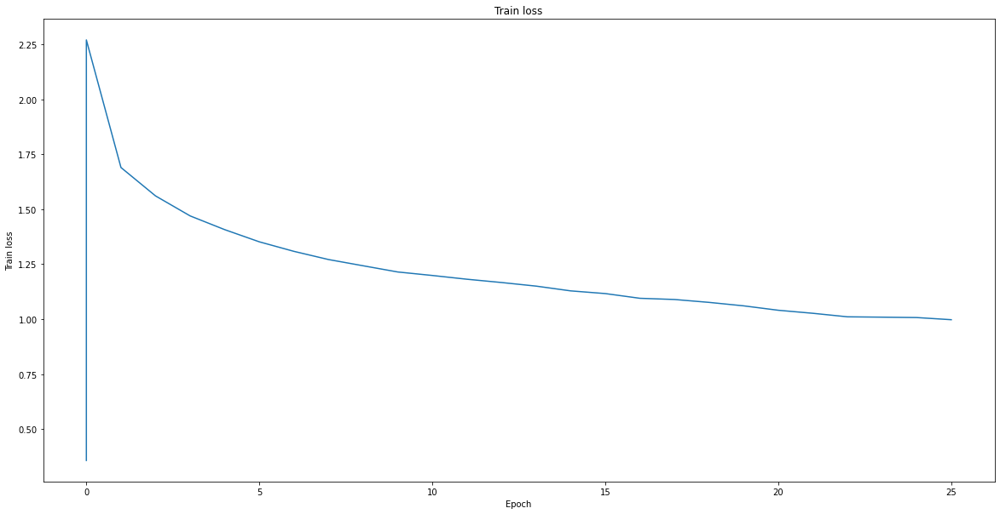

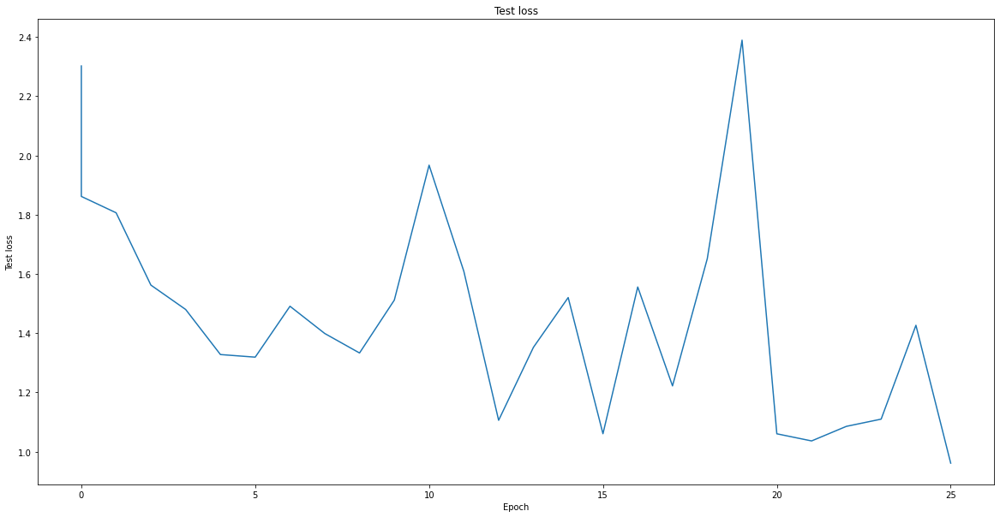

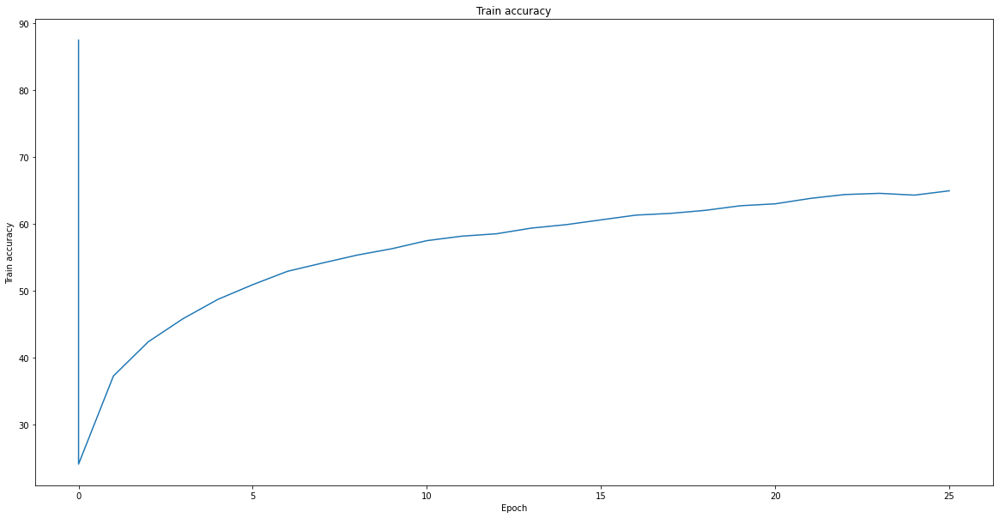

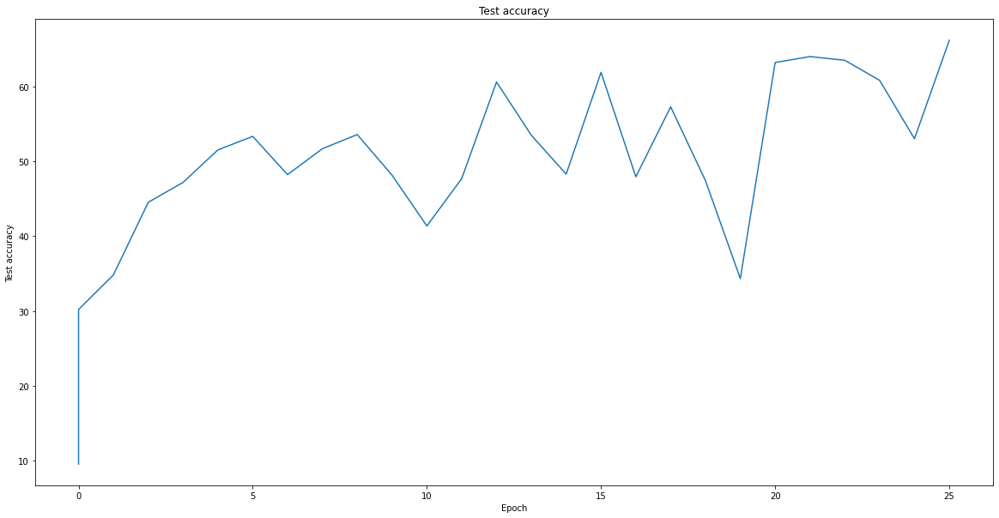

In [ ]:
#Experiment 0.3 => 63% accuracy
#Updated network - stride=1, add maxpooling,add batchnorm
#LR=0.1, epoch=25

class CifarNet_0_3(nn.Module):
    def __init__(self):
        super(CifarNet_0_3, self).__init__()
        self.conv1 = nn.Conv2d(3, 16, 3, stride=1, padding=1) 
        self.conv2 = nn.Conv2d(16, 32, 3, stride=1, padding=1) 
        self.conv3 = nn.Conv2d(32, 64, 3, stride=1, padding=1)
        
        self.maxpool = nn.MaxPool2d(2, stride=2)

        self.conv1_bn = nn.BatchNorm2d(16)
        self.conv2_bn = nn.BatchNorm2d(32)
        self.conv3_bn = nn.BatchNorm2d(64)

        self.fc1 = nn.Linear(1024, 10)
        self.accuracy = None

    def forward(self, x):
        x = self.conv1_bn(self.conv1(x)) #output 16 32x32
        x = F.relu(x)
        x = self.maxpool(x) #output 16 16x16
        
        x = self.conv2_bn(self.conv2(x)) #output 32 16x16
        x = F.relu(x)
        x = self.maxpool(x) #output 32 8x8

        x = self.conv3_bn(self.conv3(x)) #output 64 8x8
        x = F.relu(x)
        x = self.maxpool(x) #output 64 4x4
        
        x = torch.flatten(x, 1)
        x = self.fc1(x)
        return x

    def loss(self, prediction, label, reduction='mean'):
        loss_val = F.cross_entropy(prediction, label.squeeze(), reduction=reduction)
        return loss_val

    def save_model(self, file_path, num_to_keep=1):
        pt_util.save(self, file_path, num_to_keep)
        
    def save_best_model(self, accuracy, file_path, num_to_keep=1):
        if self.accuracy == None or accuracy > self.accuracy:
            self.accuracy = accuracy
            self.save_model(file_path, num_to_keep)

    def load_model(self, file_path):
        pt_util.restore(self, file_path)

    def load_last_model(self, dir_path):
        return pt_util.restore_latest(self, dir_path)



transform_train = transforms.Compose([
    transforms.RandomCrop(32, padding=4),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
  
    ####### Adding other transforms ############
    #COMMENTED BY VTHOMA
    #transforms.CenterCrop(10),
    #transforms.RandomGrayscale(p=0.4),
    #transforms.Scale(), 
    #transforms.RandomRotation(90),
     
])

transform_test = transforms.Compose([
    transforms.ToTensor(),
])

data_train = datasets.CIFAR10(root=DATA_PATH, train=True, download=True, transform=transform_train)
data_test = datasets.CIFAR10(root=DATA_PATH, train=False, download=True, transform=transform_test)



BATCH_SIZE = 256
TEST_BATCH_SIZE = 10
EPOCHS = 25
LEARNING_RATE = 0.1 #0.01
MOMENTUM = 0.9
USE_CUDA = True
SEED = 0
PRINT_INTERVAL = 100
WEIGHT_DECAY = 0.0005


EXPERIMENT_VERSION = "0.3" # increment this to start a new experiment
print("Experiment Version = ", EXPERIMENT_VERSION)
LOG_PATH = DATA_PATH + 'logs/' + EXPERIMENT_VERSION + '/'

# Now the actual training code
use_cuda = USE_CUDA and torch.cuda.is_available()

torch.manual_seed(SEED) #Uncommented by VTHOMA

device = torch.device("cuda" if use_cuda else "cpu")
print('Using device', device)
import multiprocessing
print('num cpus:', multiprocessing.cpu_count())

kwargs = {'num_workers': multiprocessing.cpu_count(),
          'pin_memory': True} if use_cuda else {}

class_names = ['plane', 'car', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']

train_loader = torch.utils.data.DataLoader(data_train, batch_size=BATCH_SIZE,
                                           shuffle=True, **kwargs)
test_loader = torch.utils.data.DataLoader(data_test, batch_size=TEST_BATCH_SIZE,
                                          shuffle=False, **kwargs)

model = CifarNet_0_3().to(device)
optimizer = optim.SGD(model.parameters(), lr=LEARNING_RATE, momentum=MOMENTUM, weight_decay=WEIGHT_DECAY)
start_epoch = model.load_last_model(LOG_PATH)

train_losses, test_losses, train_accuracies, test_accuracies = pt_util.read_log(LOG_PATH + 'log.pkl', ([], [], [], []))
test_loss, test_accuracy = test(model, device, test_loader)

train_losses.append((start_epoch, train_loss))
train_accuracies.append((start_epoch, train_accuracy))
test_losses.append((start_epoch, test_loss))
test_accuracies.append((start_epoch, test_accuracy))

try:
    for epoch in range(start_epoch, EPOCHS + 1):
        print("epoch=", epoch)
        train_loss, train_accuracy = train(model, device, train_loader, optimizer, epoch, PRINT_INTERVAL)
        test_loss, test_accuracy = test(model, device, test_loader)
        train_losses.append((epoch, train_loss))
        train_accuracies.append((epoch, train_accuracy))
        test_losses.append((epoch, test_loss))
        test_accuracies.append((epoch, test_accuracy))
        pt_util.write_log(LOG_PATH + 'log.pkl', (train_losses, test_losses, train_accuracies, test_accuracies))
        model.save_best_model(test_accuracy, LOG_PATH + '%03d.pt' % epoch)


except KeyboardInterrupt as ke:
    print('Interrupted')
except:
    import traceback
    traceback.print_exc()
finally:
    model.save_model(LOG_PATH + '%03d.pt' % epoch, 0)
    ep, val = zip(*train_losses)
    pt_util.plot(ep, val, 'Train loss', 'Epoch', 'Train loss')
    ep, val = zip(*test_losses)
    pt_util.plot(ep, val, 'Test loss', 'Epoch', 'Test loss')
    ep, val = zip(*train_accuracies)
    pt_util.plot(ep, val, 'Train accuracy', 'Epoch', 'Train accuracy')
    ep, val = zip(*test_accuracies)
    pt_util.plot(ep, val, 'Test accuracy', 'Epoch', 'Test accuracy')

Files already downloaded and verified
Files already downloaded and verified
Experiment Version =  0.4
Using device cuda
num cpus: 2

Test set: Average loss: 2.3021, Accuracy: 955/10000 (10%)

epoch= 0
Thu Oct 29 07:52:10 2020 Train Epoch: 0 [0/50000 (0%)]	Loss: 2.433084
Thu Oct 29 07:52:15 2020 Train Epoch: 0 [25600/50000 (51%)]	Loss: 1.565676

Train set: Average loss: 1.9202, Accuracy: 18034/50000 (36%)


Test set: Average loss: 1.5717, Accuracy: 4527/10000 (45%)

Saved /gdrive/My Drive/colab_files/hw1/cifar/logs/0.4/000.pt

epoch= 1
Thu Oct 29 07:52:23 2020 Train Epoch: 1 [0/50000 (0%)]	Loss: 1.585847
Thu Oct 29 07:52:27 2020 Train Epoch: 1 [25600/50000 (51%)]	Loss: 1.310978

Train set: Average loss: 1.3752, Accuracy: 25179/50000 (50%)


Test set: Average loss: 1.3595, Accuracy: 5123/10000 (51%)

Saved /gdrive/My Drive/colab_files/hw1/cifar/logs/0.4/001.pt

epoch= 2
Thu Oct 29 07:52:36 2020 Train Epoch: 2 [0/50000 (0%)]	Loss: 1.334233
Thu Oct 29 07:52:40 2020 Train Epoch: 2 [25600/50

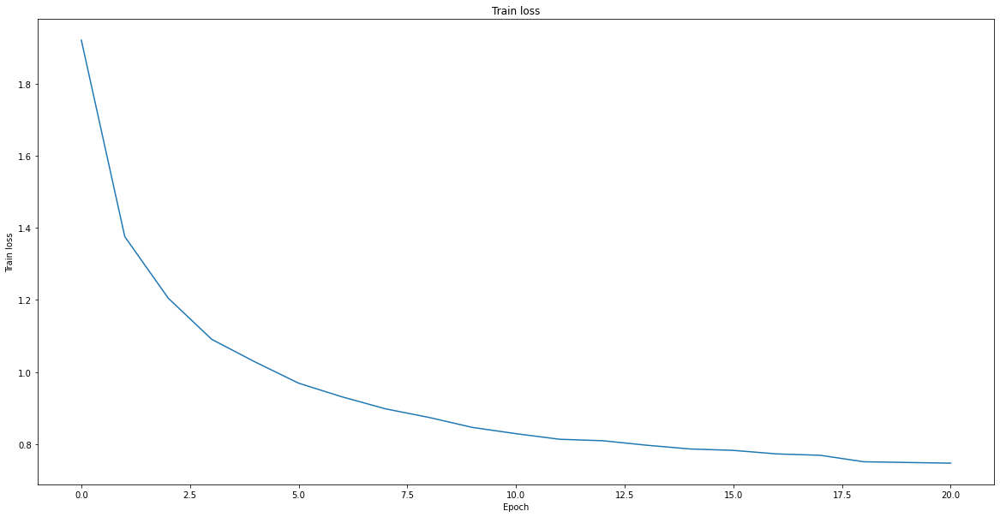

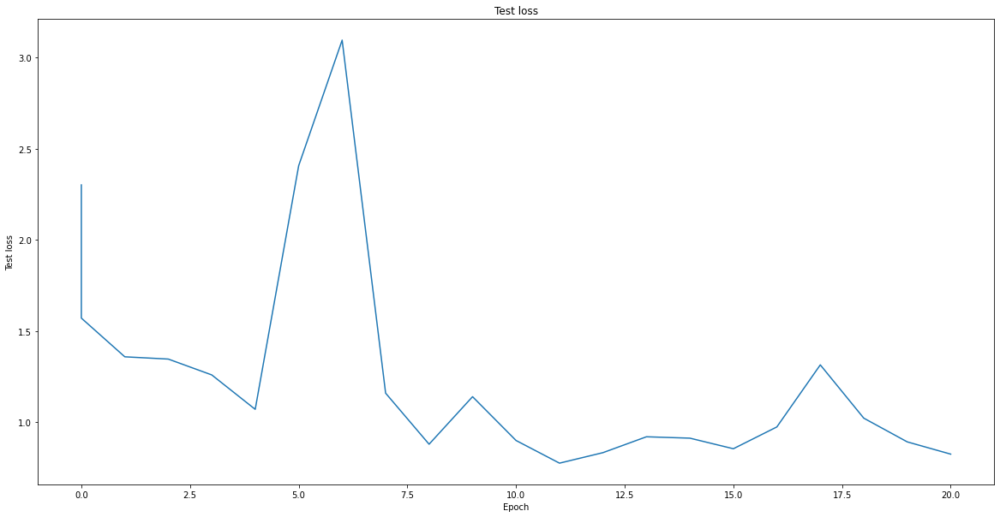

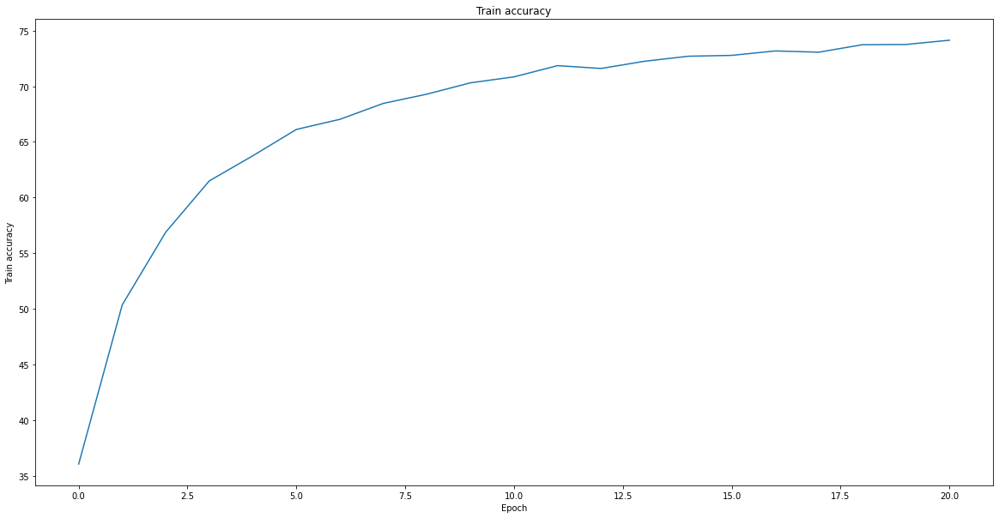

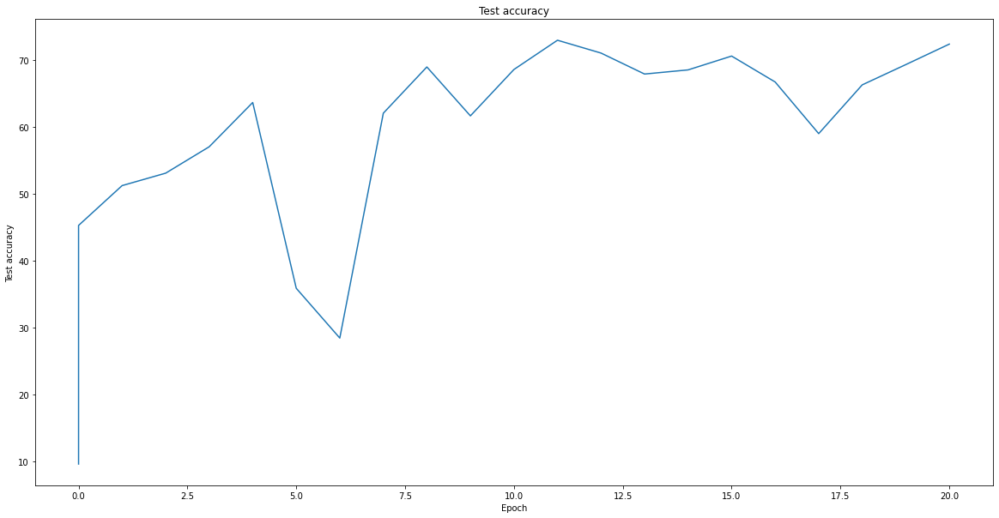

In [ ]:
#Experiment 0.4
#Updated network - stride=1, add maxpooling,add batchnorm

#LR=0.05, epoch=20 => Train 74% accuracy, but the test loss was oscillating a little too much
#                     Test 72% accuracy

class CifarNet_0_3(nn.Module):
    def __init__(self):
        super(CifarNet_0_3, self).__init__()
        self.conv1 = nn.Conv2d(3, 16, 3, stride=1, padding=1) 
        self.conv2 = nn.Conv2d(16, 32, 3, stride=1, padding=1) 
        self.conv3 = nn.Conv2d(32, 64, 3, stride=1, padding=1)
        
        self.maxpool = nn.MaxPool2d(2, stride=2)

        self.conv1_bn = nn.BatchNorm2d(16)
        self.conv2_bn = nn.BatchNorm2d(32)
        self.conv3_bn = nn.BatchNorm2d(64)

        self.fc1 = nn.Linear(1024, 10)
        self.accuracy = None

    def forward(self, x):
        x = self.conv1_bn(self.conv1(x)) #output 16 32x32
        x = F.relu(x)
        x = self.maxpool(x) #output 16 16x16
        #x = F.dropout(x, p=0.5, training=self.training)
        
        x = self.conv2_bn(self.conv2(x)) #output 32 16x16
        x = F.relu(x)
        x = self.maxpool(x) #output 32 8x8
        #x = F.dropout(x, p=0.5, training=self.training)

        x = self.conv3_bn(self.conv3(x)) #output 64 8x8
        x = F.relu(x)
        x = self.maxpool(x) #output 64 4x4
        #x = F.dropout(x, p=0.5, training=self.training)
       
        x = torch.flatten(x, 1)
        x = self.fc1(x)
        return x

    def loss(self, prediction, label, reduction='mean'):
        loss_val = F.cross_entropy(prediction, label.squeeze(), reduction=reduction)
        return loss_val

    def save_model(self, file_path, num_to_keep=1):
        pt_util.save(self, file_path, num_to_keep)
        
    def save_best_model(self, accuracy, file_path, num_to_keep=1):
        if self.accuracy == None or accuracy > self.accuracy:
            self.accuracy = accuracy
            self.save_model(file_path, num_to_keep)

    def load_model(self, file_path):
        pt_util.restore(self, file_path)

    def load_last_model(self, dir_path):
        return pt_util.restore_latest(self, dir_path)



transform_train = transforms.Compose([
    transforms.RandomCrop(32, padding=4),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
  
    ####### Adding other transforms ############
    #COMMENTED BY VTHOMA
    #transforms.CenterCrop(10),
    #transforms.RandomGrayscale(p=0.4),
    #transforms.Scale(), 
    #transforms.RandomRotation(90),
     
])

transform_test = transforms.Compose([
    transforms.ToTensor(),
])

data_train = datasets.CIFAR10(root=DATA_PATH, train=True, download=True, transform=transform_train)
data_test = datasets.CIFAR10(root=DATA_PATH, train=False, download=True, transform=transform_test)



BATCH_SIZE = 256
TEST_BATCH_SIZE = 10
EPOCHS = 20
LEARNING_RATE = 0.05 #0.01
MOMENTUM = 0.9
USE_CUDA = True
SEED = 0
PRINT_INTERVAL = 100
WEIGHT_DECAY = 0.0005


EXPERIMENT_VERSION = "0.4" # increment this to start a new experiment
print("Experiment Version = ", EXPERIMENT_VERSION)
LOG_PATH = DATA_PATH + 'logs/' + EXPERIMENT_VERSION + '/'

# Now the actual training code
use_cuda = USE_CUDA and torch.cuda.is_available()

torch.manual_seed(SEED) #Uncommented by VTHOMA

device = torch.device("cuda" if use_cuda else "cpu")
print('Using device', device)
import multiprocessing
print('num cpus:', multiprocessing.cpu_count())

kwargs = {'num_workers': multiprocessing.cpu_count(),
          'pin_memory': True} if use_cuda else {}

class_names = ['plane', 'car', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']

train_loader = torch.utils.data.DataLoader(data_train, batch_size=BATCH_SIZE,
                                           shuffle=True, **kwargs)
test_loader = torch.utils.data.DataLoader(data_test, batch_size=TEST_BATCH_SIZE,
                                          shuffle=False, **kwargs)

model = CifarNet_0_3().to(device)
optimizer = optim.SGD(model.parameters(), lr=LEARNING_RATE, momentum=MOMENTUM, weight_decay=WEIGHT_DECAY)
start_epoch = model.load_last_model(LOG_PATH)

train_losses, test_losses, train_accuracies, test_accuracies = pt_util.read_log(LOG_PATH + 'log.pkl', ([], [], [], []))
test_loss, test_accuracy = test(model, device, test_loader)

test_losses.append((start_epoch, test_loss))
test_accuracies.append((start_epoch, test_accuracy))

try:
    for epoch in range(start_epoch, EPOCHS + 1):
        print("epoch=", epoch)
        train_loss, train_accuracy = train(model, device, train_loader, optimizer, epoch, PRINT_INTERVAL)
        test_loss, test_accuracy = test(model, device, test_loader)
        train_losses.append((epoch, train_loss))
        train_accuracies.append((epoch, train_accuracy))
        test_losses.append((epoch, test_loss))
        test_accuracies.append((epoch, test_accuracy))
        pt_util.write_log(LOG_PATH + 'log.pkl', (train_losses, test_losses, train_accuracies, test_accuracies))
        model.save_best_model(test_accuracy, LOG_PATH + '%03d.pt' % epoch)


except KeyboardInterrupt as ke:
    print('Interrupted')
except:
    import traceback
    traceback.print_exc()
finally:
    model.save_model(LOG_PATH + '%03d.pt' % epoch, 0)
    ep, val = zip(*train_losses)
    pt_util.plot(ep, val, 'Train loss', 'Epoch', 'Train loss')
    ep, val = zip(*test_losses)
    pt_util.plot(ep, val, 'Test loss', 'Epoch', 'Test loss')
    ep, val = zip(*train_accuracies)
    pt_util.plot(ep, val, 'Train accuracy', 'Epoch', 'Train accuracy')
    ep, val = zip(*test_accuracies)
    pt_util.plot(ep, val, 'Test accuracy', 'Epoch', 'Test accuracy')

Files already downloaded and verified
Files already downloaded and verified
Experiment Version =  0.5
Using device cuda
num cpus: 2

Test set: Average loss: 2.3034, Accuracy: 999/10000 (10%)

epoch= 0
Thu Oct 29 07:58:44 2020 Train Epoch: 0 [0/50000 (0%)]	Loss: 2.332977
Thu Oct 29 07:58:49 2020 Train Epoch: 0 [25600/50000 (51%)]	Loss: 1.504804

Train set: Average loss: 1.5141, Accuracy: 22477/50000 (45%)


Test set: Average loss: 1.3064, Accuracy: 5398/10000 (54%)

Saved /gdrive/My Drive/colab_files/hw1/cifar/logs/0.5/000.pt

epoch= 1
Thu Oct 29 07:58:57 2020 Train Epoch: 1 [0/50000 (0%)]	Loss: 1.270813
Thu Oct 29 07:59:02 2020 Train Epoch: 1 [25600/50000 (51%)]	Loss: 1.060071

Train set: Average loss: 1.1357, Accuracy: 29726/50000 (59%)


Test set: Average loss: 1.0515, Accuracy: 6164/10000 (62%)

Saved /gdrive/My Drive/colab_files/hw1/cifar/logs/0.5/001.pt

epoch= 2
Thu Oct 29 07:59:10 2020 Train Epoch: 2 [0/50000 (0%)]	Loss: 0.958969
Thu Oct 29 07:59:14 2020 Train Epoch: 2 [25600/50

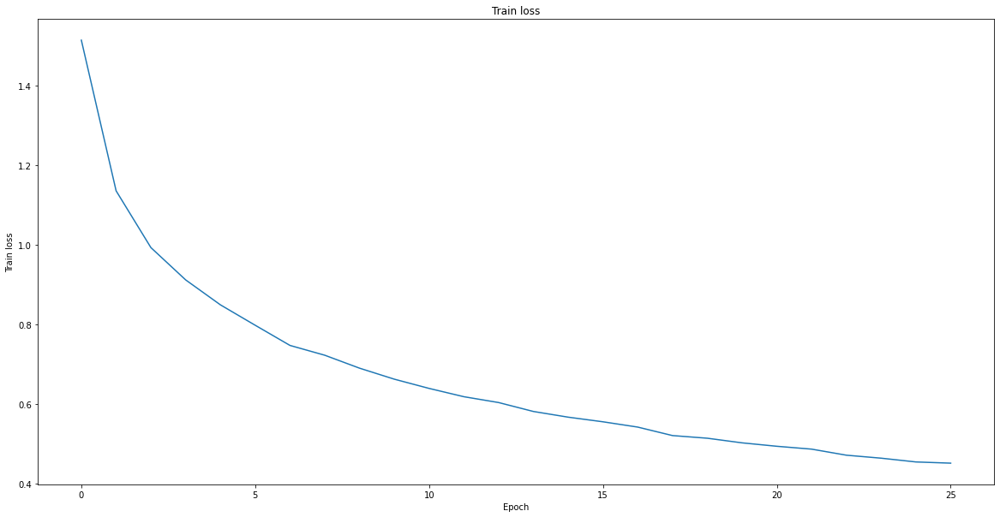

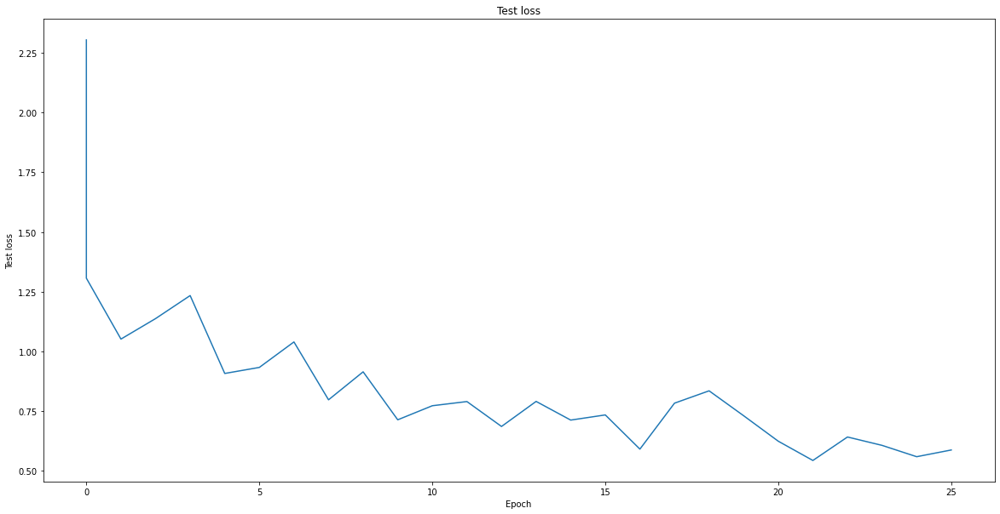

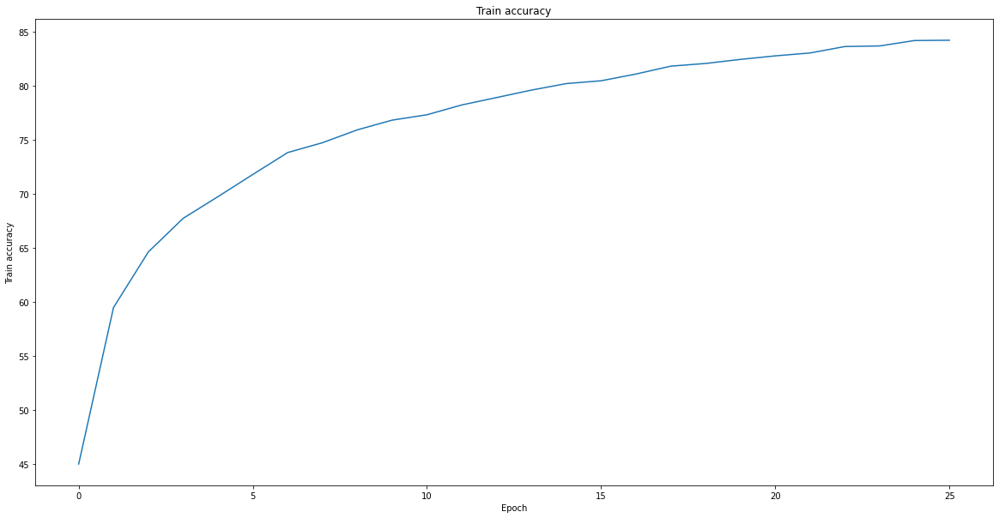

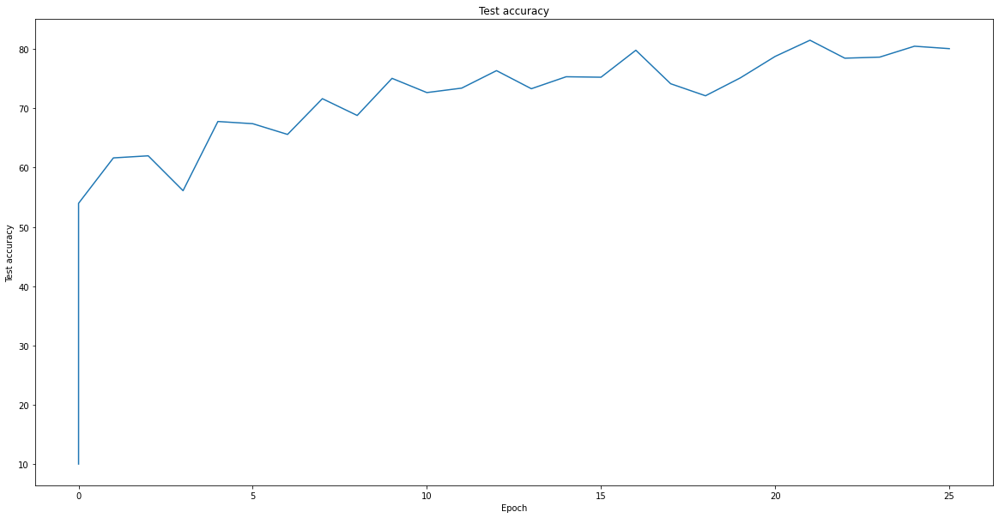

In [ ]:
#Experiment 0.5
#Updated network - stride=1, add maxpooling,add batchnorm; added more filter banks in each conv layer.
#LR=0.01, epoch=25  =>  Test:80% accuracy, Train:84%

class CifarNet_0_3(nn.Module):
    def __init__(self):
        super(CifarNet_0_3, self).__init__()
        self.conv1 = nn.Conv2d(3, 32, 3, stride=1, padding=1) 
        self.conv2 = nn.Conv2d(32, 64, 3, stride=1, padding=1) 
        self.conv3 = nn.Conv2d(64, 128, 3, stride=1, padding=1)
        
        self.maxpool = nn.MaxPool2d(2, stride=2)

        self.conv1_bn = nn.BatchNorm2d(32)
        self.conv2_bn = nn.BatchNorm2d(64)
        self.conv3_bn = nn.BatchNorm2d(128)

        self.fc1 = nn.Linear(2048, 256)
        self.fc2 = nn.Linear(256, 10)
        self.accuracy = None

    def forward(self, x):
        x = self.conv1_bn(self.conv1(x)) #output 32 32x32
        x = F.relu(x)
        x = self.maxpool(x) #output 32 16x16
        #x = F.dropout(x, p=0.5, training=self.training)
        
        x = self.conv2_bn(self.conv2(x)) #output 64 16x16
        x = F.relu(x)
        x = self.maxpool(x) #output 64 8x8
        #x = F.dropout(x, p=0.5, training=self.training)

        x = self.conv3_bn(self.conv3(x)) #output 128 8x8
        x = F.relu(x)
        x = self.maxpool(x) #output 128 4x4
        #x = F.dropout(x, p=0.5, training=self.training)
       
        x = torch.flatten(x, 1)
        x = self.fc1(x)
        x = F.relu(x)
        x = self.fc2(x)
        return x

    def loss(self, prediction, label, reduction='mean'):
        loss_val = F.cross_entropy(prediction, label.squeeze(), reduction=reduction)
        return loss_val

    def save_model(self, file_path, num_to_keep=1):
        pt_util.save(self, file_path, num_to_keep)
        
    def save_best_model(self, accuracy, file_path, num_to_keep=1):
        if self.accuracy == None or accuracy > self.accuracy:
            self.accuracy = accuracy
            self.save_model(file_path, num_to_keep)

    def load_model(self, file_path):
        pt_util.restore(self, file_path)

    def load_last_model(self, dir_path):
        return pt_util.restore_latest(self, dir_path)



transform_train = transforms.Compose([
    transforms.RandomCrop(32, padding=4),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
  
    ####### Adding other transforms ############
    #COMMENTED BY VTHOMA
    #transforms.CenterCrop(10),
    #transforms.RandomGrayscale(p=0.4),
    #transforms.Scale(), 
    #transforms.RandomRotation(90),
     
])

transform_test = transforms.Compose([
    transforms.ToTensor(),
])

data_train = datasets.CIFAR10(root=DATA_PATH, train=True, download=True, transform=transform_train)
data_test = datasets.CIFAR10(root=DATA_PATH, train=False, download=True, transform=transform_test)



BATCH_SIZE = 256
TEST_BATCH_SIZE = 10
EPOCHS = 25
LEARNING_RATE = 0.01
MOMENTUM = 0.9
USE_CUDA = True
SEED = 0
PRINT_INTERVAL = 100
WEIGHT_DECAY = 0.0005


EXPERIMENT_VERSION = "0.5" # increment this to start a new experiment
print("Experiment Version = ", EXPERIMENT_VERSION)
LOG_PATH = DATA_PATH + 'logs/' + EXPERIMENT_VERSION + '/'

# Now the actual training code
use_cuda = USE_CUDA and torch.cuda.is_available()

torch.manual_seed(SEED) #Uncommented by VTHOMA

device = torch.device("cuda" if use_cuda else "cpu")
print('Using device', device)
import multiprocessing
print('num cpus:', multiprocessing.cpu_count())

kwargs = {'num_workers': multiprocessing.cpu_count(),
          'pin_memory': True} if use_cuda else {}

class_names = ['plane', 'car', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']

train_loader = torch.utils.data.DataLoader(data_train, batch_size=BATCH_SIZE,
                                           shuffle=True, **kwargs)
test_loader = torch.utils.data.DataLoader(data_test, batch_size=TEST_BATCH_SIZE,
                                          shuffle=False, **kwargs)

model = CifarNet_0_3().to(device)
optimizer = optim.SGD(model.parameters(), lr=LEARNING_RATE, momentum=MOMENTUM, weight_decay=WEIGHT_DECAY)
start_epoch = model.load_last_model(LOG_PATH)

train_losses, test_losses, train_accuracies, test_accuracies = pt_util.read_log(LOG_PATH + 'log.pkl', ([], [], [], []))
test_loss, test_accuracy = test(model, device, test_loader)

test_losses.append((start_epoch, test_loss))
test_accuracies.append((start_epoch, test_accuracy))

try:
    for epoch in range(start_epoch, EPOCHS + 1):
        print("epoch=", epoch)
        train_loss, train_accuracy = train(model, device, train_loader, optimizer, epoch, PRINT_INTERVAL)
        test_loss, test_accuracy = test(model, device, test_loader)
        train_losses.append((epoch, train_loss))
        train_accuracies.append((epoch, train_accuracy))
        test_losses.append((epoch, test_loss))
        test_accuracies.append((epoch, test_accuracy))
        pt_util.write_log(LOG_PATH + 'log.pkl', (train_losses, test_losses, train_accuracies, test_accuracies))
        model.save_best_model(test_accuracy, LOG_PATH + '%03d.pt' % epoch)


except KeyboardInterrupt as ke:
    print('Interrupted')
except:
    import traceback
    traceback.print_exc()
finally:
    model.save_model(LOG_PATH + '%03d.pt' % epoch, 0)
    ep, val = zip(*train_losses)
    pt_util.plot(ep, val, 'Train loss', 'Epoch', 'Train loss')
    ep, val = zip(*test_losses)
    pt_util.plot(ep, val, 'Test loss', 'Epoch', 'Test loss')
    ep, val = zip(*train_accuracies)
    pt_util.plot(ep, val, 'Train accuracy', 'Epoch', 'Train accuracy')
    ep, val = zip(*test_accuracies)
    pt_util.plot(ep, val, 'Test accuracy', 'Epoch', 'Test accuracy')

Files already downloaded and verified
Files already downloaded and verified
Experiment Version =  0.6
Using device cuda
num cpus: 2
Restoring:
conv1.weight -> 	torch.Size([32, 3, 5, 5]) = 0MB
conv1.bias -> 	torch.Size([32]) = 0MB
conv2.weight -> 	torch.Size([64, 32, 5, 5]) = 0MB
conv2.bias -> 	torch.Size([64]) = 0MB
conv3.weight -> 	torch.Size([128, 64, 5, 5]) = 0MB
conv3.bias -> 	torch.Size([128]) = 0MB
conv1_bn.weight -> 	torch.Size([32]) = 0MB
conv1_bn.bias -> 	torch.Size([32]) = 0MB
conv1_bn.running_mean -> 	torch.Size([32]) = 0MB
conv1_bn.running_var -> 	torch.Size([32]) = 0MB
conv1_bn.num_batches_tracked -> 	torch.Size([]) = 0MB
conv2_bn.weight -> 	torch.Size([64]) = 0MB
conv2_bn.bias -> 	torch.Size([64]) = 0MB
conv2_bn.running_mean -> 	torch.Size([64]) = 0MB
conv2_bn.running_var -> 	torch.Size([64]) = 0MB
conv2_bn.num_batches_tracked -> 	torch.Size([]) = 0MB
conv3_bn.weight -> 	torch.Size([128]) = 0MB
conv3_bn.bias -> 	torch.Size([128]) = 0MB
conv3_bn.running_mean -> 	torch.Size

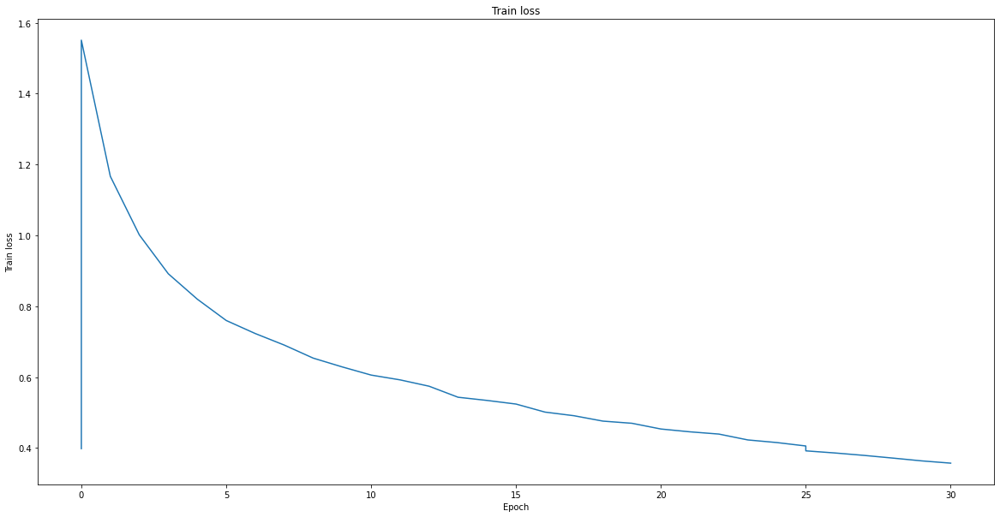

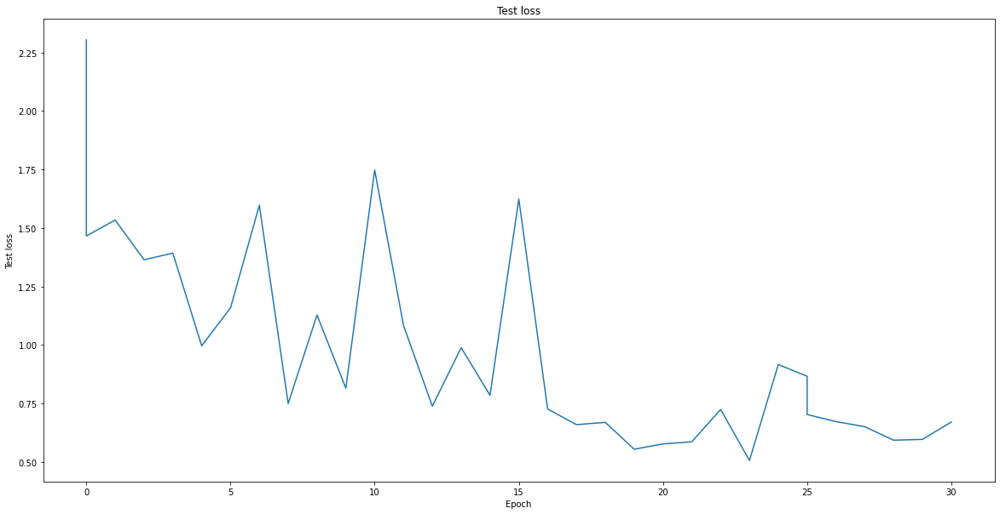

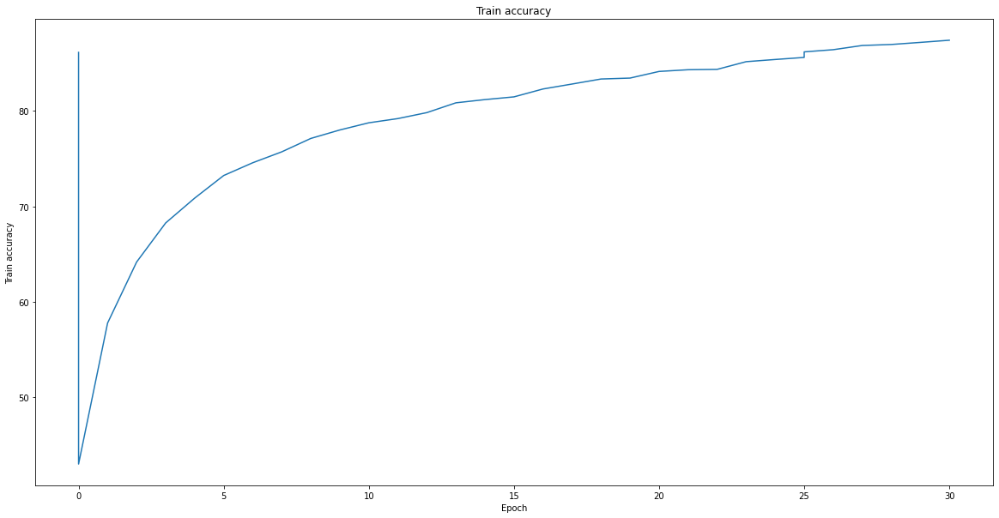

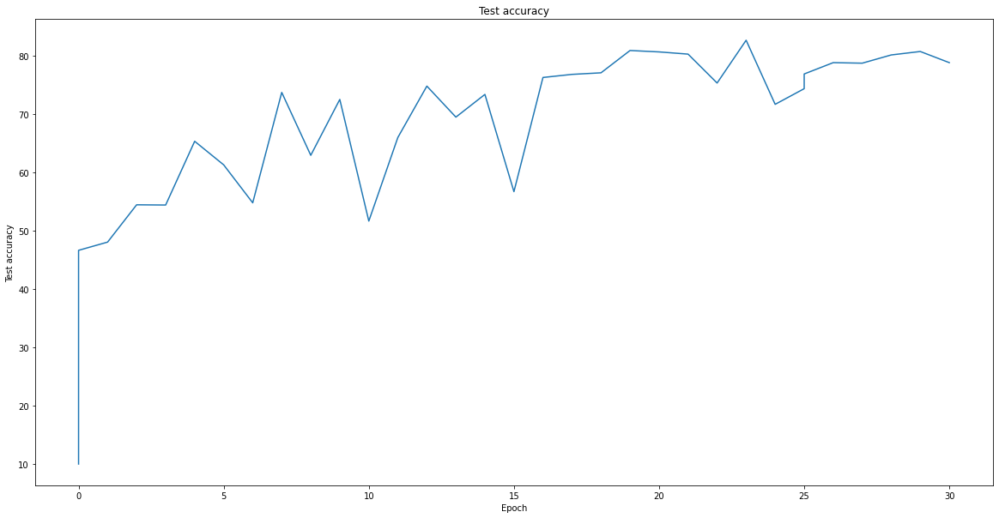

In [ ]:
#Experiment 0.6
#Updated network - 5x5 filters, stride=1, add maxpooling,add batchnorm; added more filter banks in each conv layer.
#LR=0.01, epoch=25  =>  test: 74% accuracy, train:86%

class CifarNet_0_3(nn.Module):
    def __init__(self):
        super(CifarNet_0_3, self).__init__()
        self.conv1 = nn.Conv2d(3, 32, 5, stride=1, padding=2) 
        self.conv2 = nn.Conv2d(32, 64, 5, stride=1, padding=2) 
        self.conv3 = nn.Conv2d(64, 128, 5, stride=1, padding=2)
        
        self.maxpool = nn.MaxPool2d(2, stride=2)

        self.conv1_bn = nn.BatchNorm2d(32)
        self.conv2_bn = nn.BatchNorm2d(64)
        self.conv3_bn = nn.BatchNorm2d(128)

        self.fc1 = nn.Linear(2048, 256)
        self.fc2 = nn.Linear(256, 10)
        self.accuracy = None

    def forward(self, x):
        x = self.conv1_bn(self.conv1(x)) #output 32 32x32
        x = F.relu(x)
        x = self.maxpool(x) #output 32 16x16
        #x = F.dropout(x, p=0.5, training=self.training)
        
        x = self.conv2_bn(self.conv2(x)) #output 64 16x16
        x = F.relu(x)
        x = self.maxpool(x) #output 64 8x8
        #x = F.dropout(x, p=0.5, training=self.training)

        x = self.conv3_bn(self.conv3(x)) #output 128 8x8
        x = F.relu(x)
        x = self.maxpool(x) #output 128 4x4
        #x = F.dropout(x, p=0.5, training=self.training)
       
        x = torch.flatten(x, 1)
        x = self.fc1(x)
        x = F.relu(x)
        x = self.fc2(x)
        return x

    def loss(self, prediction, label, reduction='mean'):
        loss_val = F.cross_entropy(prediction, label.squeeze(), reduction=reduction)
        return loss_val

    def save_model(self, file_path, num_to_keep=1):
        pt_util.save(self, file_path, num_to_keep)
        
    def save_best_model(self, accuracy, file_path, num_to_keep=1):
        if self.accuracy == None or accuracy > self.accuracy:
            self.accuracy = accuracy
            self.save_model(file_path, num_to_keep)

    def load_model(self, file_path):
        pt_util.restore(self, file_path)

    def load_last_model(self, dir_path):
        return pt_util.restore_latest(self, dir_path)



transform_train = transforms.Compose([
    transforms.RandomCrop(32, padding=4),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
  
    ####### Adding other transforms ############
    #COMMENTED BY VTHOMA
    #transforms.CenterCrop(10),
    #transforms.RandomGrayscale(p=0.4),
    #transforms.Scale(), 
    #transforms.RandomRotation(90),
     
])

transform_test = transforms.Compose([
    transforms.ToTensor(),
])

data_train = datasets.CIFAR10(root=DATA_PATH, train=True, download=True, transform=transform_train)
data_test = datasets.CIFAR10(root=DATA_PATH, train=False, download=True, transform=transform_test)



BATCH_SIZE = 256
TEST_BATCH_SIZE = 10
EPOCHS = 30
LEARNING_RATE = 0.01
MOMENTUM = 0.9
USE_CUDA = True
SEED = 0
PRINT_INTERVAL = 100
WEIGHT_DECAY = 0.0005


EXPERIMENT_VERSION = "0.6" # increment this to start a new experiment
print("Experiment Version = ", EXPERIMENT_VERSION)
LOG_PATH = DATA_PATH + 'logs/' + EXPERIMENT_VERSION + '/'

# Now the actual training code
use_cuda = USE_CUDA and torch.cuda.is_available()

torch.manual_seed(SEED) #Uncommented by VTHOMA

device = torch.device("cuda" if use_cuda else "cpu")
print('Using device', device)
import multiprocessing
print('num cpus:', multiprocessing.cpu_count())

kwargs = {'num_workers': multiprocessing.cpu_count(),
          'pin_memory': True} if use_cuda else {}

class_names = ['plane', 'car', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']

train_loader = torch.utils.data.DataLoader(data_train, batch_size=BATCH_SIZE,
                                           shuffle=True, **kwargs)
test_loader = torch.utils.data.DataLoader(data_test, batch_size=TEST_BATCH_SIZE,
                                          shuffle=False, **kwargs)

model = CifarNet_0_3().to(device)
optimizer = optim.SGD(model.parameters(), lr=LEARNING_RATE, momentum=MOMENTUM, weight_decay=WEIGHT_DECAY)
start_epoch = model.load_last_model(LOG_PATH)

train_losses, test_losses, train_accuracies, test_accuracies = pt_util.read_log(LOG_PATH + 'log.pkl', ([], [], [], []))
test_loss, test_accuracy = test(model, device, test_loader)

train_losses.append((start_epoch, train_loss))
train_accuracies.append((start_epoch, train_accuracy))

test_losses.append((start_epoch, test_loss))
test_accuracies.append((start_epoch, test_accuracy))

try:
    for epoch in range(start_epoch, EPOCHS + 1):
        print("epoch=", epoch)
        train_loss, train_accuracy = train(model, device, train_loader, optimizer, epoch, PRINT_INTERVAL)
        test_loss, test_accuracy = test(model, device, test_loader)
        train_losses.append((epoch, train_loss))
        train_accuracies.append((epoch, train_accuracy))
        test_losses.append((epoch, test_loss))
        test_accuracies.append((epoch, test_accuracy))
        pt_util.write_log(LOG_PATH + 'log.pkl', (train_losses, test_losses, train_accuracies, test_accuracies))
        model.save_best_model(test_accuracy, LOG_PATH + '%03d.pt' % epoch)


except KeyboardInterrupt as ke:
    print('Interrupted')
except:
    import traceback
    traceback.print_exc()
finally:
    model.save_model(LOG_PATH + '%03d.pt' % epoch, 0)
    ep, val = zip(*train_losses)
    pt_util.plot(ep, val, 'Train loss', 'Epoch', 'Train loss')
    ep, val = zip(*test_losses)
    pt_util.plot(ep, val, 'Test loss', 'Epoch', 'Test loss')
    ep, val = zip(*train_accuracies)
    pt_util.plot(ep, val, 'Train accuracy', 'Epoch', 'Train accuracy')
    ep, val = zip(*test_accuracies)
    pt_util.plot(ep, val, 'Test accuracy', 'Epoch', 'Test accuracy')

Files already downloaded and verified
Files already downloaded and verified
Experiment Version =  0.7
Using device cuda
num cpus: 2

Test set: Average loss: 2.3034, Accuracy: 999/10000 (10%)

epoch= 0
Thu Oct 29 11:01:54 2020 Train Epoch: 0 [0/50000 (0%)]	Loss: 2.341180

Train set: Average loss: 1.6474, Accuracy: 20038/50000 (40%)


Test set: Average loss: 1.4516, Accuracy: 4748/10000 (47%)

Saved /gdrive/My Drive/colab_files/hw1/cifar/logs/0.7/000.pt

epoch= 1
Thu Oct 29 11:02:06 2020 Train Epoch: 1 [0/50000 (0%)]	Loss: 1.334569

Train set: Average loss: 1.2438, Accuracy: 27643/50000 (55%)


Test set: Average loss: 1.8290, Accuracy: 4362/10000 (44%)

epoch= 2
Thu Oct 29 11:02:19 2020 Train Epoch: 2 [0/50000 (0%)]	Loss: 1.166314

Train set: Average loss: 1.0946, Accuracy: 30570/50000 (61%)


Test set: Average loss: 1.1654, Accuracy: 5882/10000 (59%)

Saved /gdrive/My Drive/colab_files/hw1/cifar/logs/0.7/002.pt

epoch= 3
Thu Oct 29 11:02:31 2020 Train Epoch: 3 [0/50000 (0%)]	Loss: 1.106

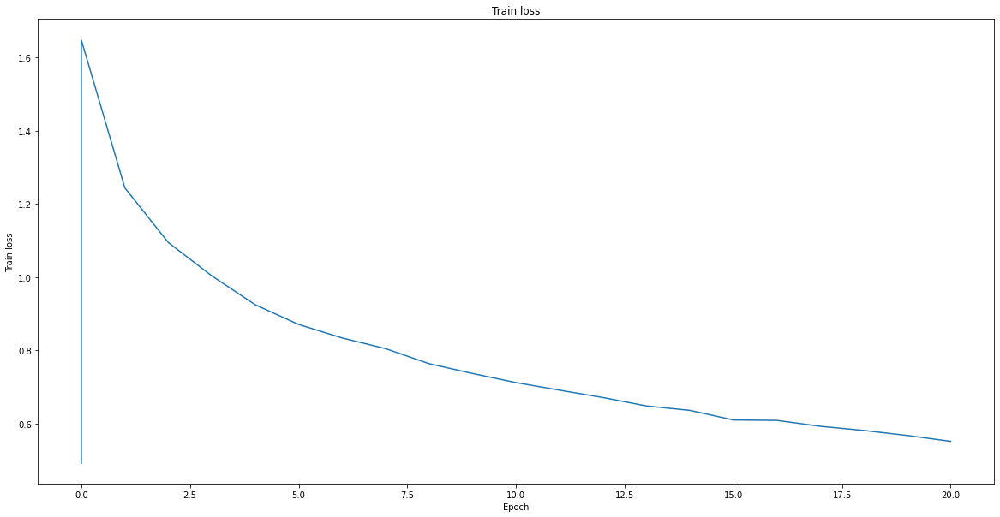

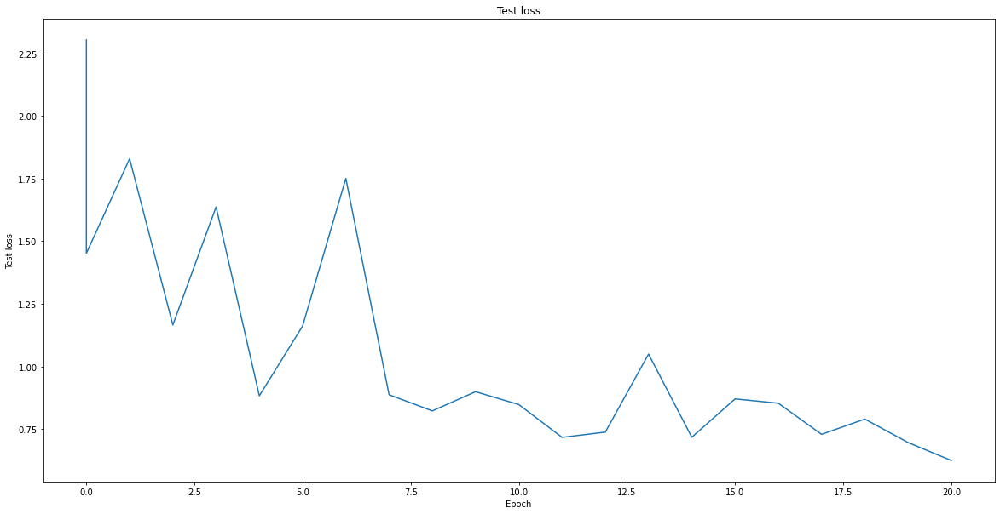

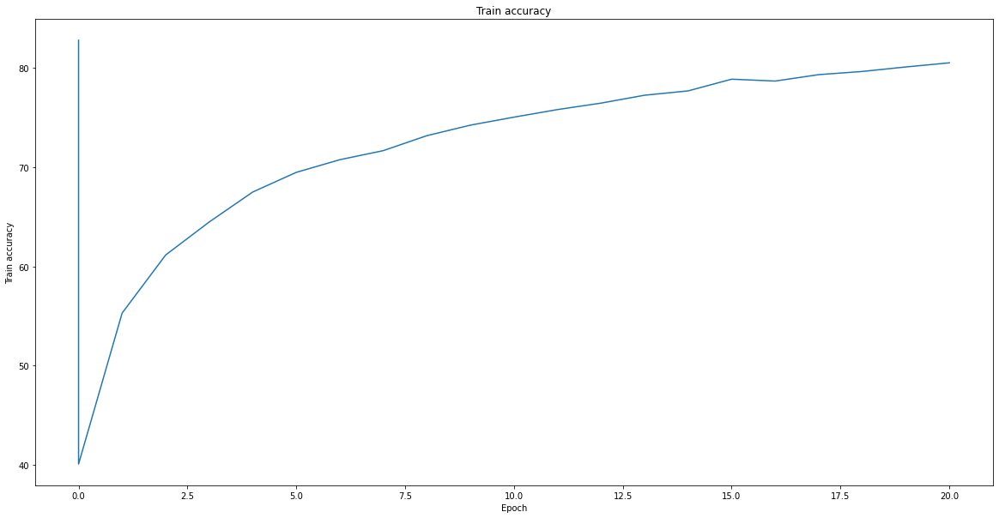

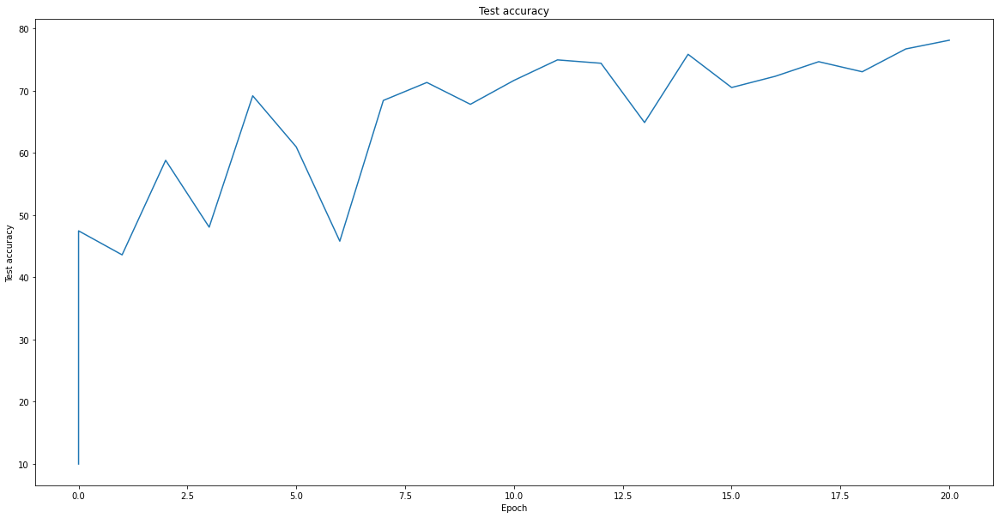

In [ ]:
#Experiment 0.7
#Updated network - stride=1, add maxpooling,add batchnorm; added more filter banks in each conv layer.
#LR=0.01,Batch Size =512, epochs=20
# Test accuracy => 78%
# Train accuracy => 81%

class CifarNet_0_3(nn.Module):
    def __init__(self):
        super(CifarNet_0_3, self).__init__()
        self.conv1 = nn.Conv2d(3, 32, 3, stride=1, padding=1) 
        self.conv2 = nn.Conv2d(32, 64, 3, stride=1, padding=1) 
        self.conv3 = nn.Conv2d(64, 128, 3, stride=1, padding=1)
        
        self.maxpool = nn.MaxPool2d(2, stride=2)

        self.conv1_bn = nn.BatchNorm2d(32)
        self.conv2_bn = nn.BatchNorm2d(64)
        self.conv3_bn = nn.BatchNorm2d(128)

        self.fc1 = nn.Linear(2048, 256)
        self.fc2 = nn.Linear(256, 10)
        self.accuracy = None

    def forward(self, x):
        x = self.conv1_bn(self.conv1(x)) #output 32 32x32
        x = F.relu(x)
        x = self.maxpool(x) #output 32 16x16
        #x = F.dropout(x, p=0.5, training=self.training)
        
        x = self.conv2_bn(self.conv2(x)) #output 64 16x16
        x = F.relu(x)
        x = self.maxpool(x) #output 64 8x8
        #x = F.dropout(x, p=0.5, training=self.training)

        x = self.conv3_bn(self.conv3(x)) #output 128 8x8
        x = F.relu(x)
        x = self.maxpool(x) #output 128 4x4
        #x = F.dropout(x, p=0.5, training=self.training)
       
        x = torch.flatten(x, 1)
        x = self.fc1(x)
        x = F.relu(x)
        x = self.fc2(x)
        return x

    def loss(self, prediction, label, reduction='mean'):
        loss_val = F.cross_entropy(prediction, label.squeeze(), reduction=reduction)
        return loss_val

    def save_model(self, file_path, num_to_keep=1):
        pt_util.save(self, file_path, num_to_keep)
        
    def save_best_model(self, accuracy, file_path, num_to_keep=1):
        if self.accuracy == None or accuracy > self.accuracy:
            self.accuracy = accuracy
            self.save_model(file_path, num_to_keep)

    def load_model(self, file_path):
        pt_util.restore(self, file_path)

    def load_last_model(self, dir_path):
        return pt_util.restore_latest(self, dir_path)



transform_train = transforms.Compose([
    transforms.RandomCrop(32, padding=4),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
  
    ####### Adding other transforms ############
    #COMMENTED BY VTHOMA
    #transforms.CenterCrop(10),
    #transforms.RandomGrayscale(p=0.4),
    #transforms.Scale(), 
    #transforms.RandomRotation(90),
     
])

transform_test = transforms.Compose([
    transforms.ToTensor(),
])

data_train = datasets.CIFAR10(root=DATA_PATH, train=True, download=True, transform=transform_train)
data_test = datasets.CIFAR10(root=DATA_PATH, train=False, download=True, transform=transform_test)



BATCH_SIZE = 512#256
TEST_BATCH_SIZE = 10
EPOCHS = 20
LEARNING_RATE = 0.01
MOMENTUM = 0.9
USE_CUDA = True
SEED = 0
PRINT_INTERVAL = 100
WEIGHT_DECAY = 0.0005


EXPERIMENT_VERSION = "0.7" # increment this to start a new experiment
print("Experiment Version = ", EXPERIMENT_VERSION)
LOG_PATH = DATA_PATH + 'logs/' + EXPERIMENT_VERSION + '/'

# Now the actual training code
use_cuda = USE_CUDA and torch.cuda.is_available()

torch.manual_seed(SEED) #Uncommented by VTHOMA

device = torch.device("cuda" if use_cuda else "cpu")
print('Using device', device)
import multiprocessing
print('num cpus:', multiprocessing.cpu_count())

kwargs = {'num_workers': multiprocessing.cpu_count(),
          'pin_memory': True} if use_cuda else {}

class_names = ['plane', 'car', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']

train_loader = torch.utils.data.DataLoader(data_train, batch_size=BATCH_SIZE,
                                           shuffle=True, **kwargs)
test_loader = torch.utils.data.DataLoader(data_test, batch_size=TEST_BATCH_SIZE,
                                          shuffle=False, **kwargs)

model = CifarNet_0_3().to(device)
optimizer = optim.SGD(model.parameters(), lr=LEARNING_RATE, momentum=MOMENTUM, weight_decay=WEIGHT_DECAY)
start_epoch = model.load_last_model(LOG_PATH)

train_losses, test_losses, train_accuracies, test_accuracies = pt_util.read_log(LOG_PATH + 'log.pkl', ([], [], [], []))
test_loss, test_accuracy = test(model, device, test_loader)

train_losses.append((start_epoch, train_loss))
train_accuracies.append((start_epoch, train_accuracy))

test_losses.append((start_epoch, test_loss))
test_accuracies.append((start_epoch, test_accuracy))

try:
    for epoch in range(start_epoch, EPOCHS + 1):
        print("epoch=", epoch)
        train_loss, train_accuracy = train(model, device, train_loader, optimizer, epoch, PRINT_INTERVAL)
        test_loss, test_accuracy = test(model, device, test_loader)
        train_losses.append((epoch, train_loss))
        test_losses.append((epoch, test_loss))
        train_accuracies.append((epoch, train_accuracy))
        test_accuracies.append((epoch, test_accuracy))
        pt_util.write_log(LOG_PATH + 'log.pkl', (train_losses, test_losses, train_accuracies, test_accuracies))
        model.save_best_model(test_accuracy, LOG_PATH + '%03d.pt' % epoch)


except KeyboardInterrupt as ke:
    print('Interrupted')
except:
    import traceback
    traceback.print_exc()
finally:
    model.save_model(LOG_PATH + '%03d.pt' % epoch, 0)
    ep, val = zip(*train_losses)
    pt_util.plot(ep, val, 'Train loss', 'Epoch', 'Train loss')
    ep, val = zip(*test_losses)
    pt_util.plot(ep, val, 'Test loss', 'Epoch', 'Test loss')
    ep, val = zip(*train_accuracies)
    pt_util.plot(ep, val, 'Train accuracy', 'Epoch', 'Train accuracy')
    ep, val = zip(*test_accuracies)
    pt_util.plot(ep, val, 'Test accuracy', 'Epoch', 'Test accuracy')

Files already downloaded and verified
Files already downloaded and verified
Experiment Version =  0.8
Using device cuda
num cpus: 2
Restoring:
conv1.weight -> 	torch.Size([32, 3, 3, 3]) = 0MB
conv1.bias -> 	torch.Size([32]) = 0MB
conv2.weight -> 	torch.Size([64, 32, 3, 3]) = 0MB
conv2.bias -> 	torch.Size([64]) = 0MB
conv3.weight -> 	torch.Size([128, 64, 3, 3]) = 0MB
conv3.bias -> 	torch.Size([128]) = 0MB
conv1_bn.weight -> 	torch.Size([32]) = 0MB
conv1_bn.bias -> 	torch.Size([32]) = 0MB
conv1_bn.running_mean -> 	torch.Size([32]) = 0MB
conv1_bn.running_var -> 	torch.Size([32]) = 0MB
conv1_bn.num_batches_tracked -> 	torch.Size([]) = 0MB
conv2_bn.weight -> 	torch.Size([64]) = 0MB
conv2_bn.bias -> 	torch.Size([64]) = 0MB
conv2_bn.running_mean -> 	torch.Size([64]) = 0MB
conv2_bn.running_var -> 	torch.Size([64]) = 0MB
conv2_bn.num_batches_tracked -> 	torch.Size([]) = 0MB
conv3_bn.weight -> 	torch.Size([128]) = 0MB
conv3_bn.bias -> 	torch.Size([128]) = 0MB
conv3_bn.running_mean -> 	torch.Size

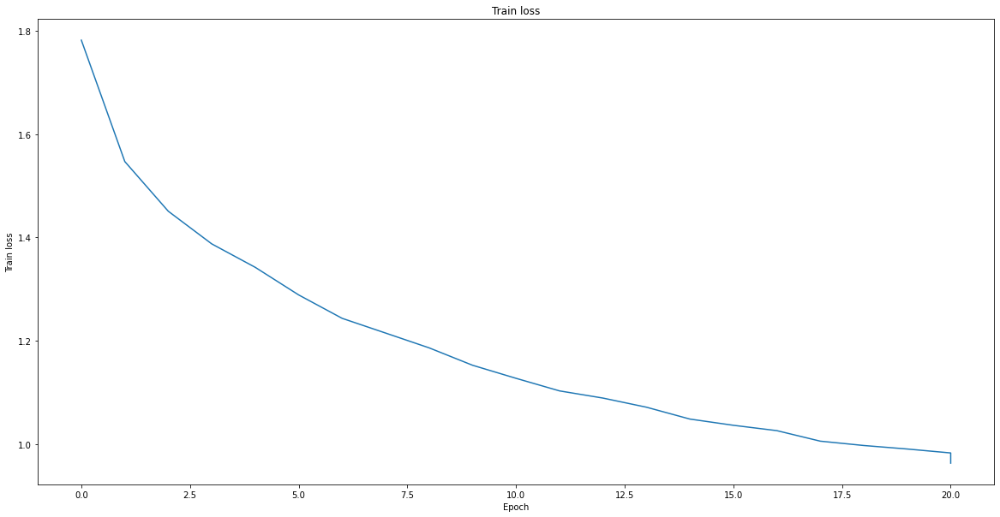

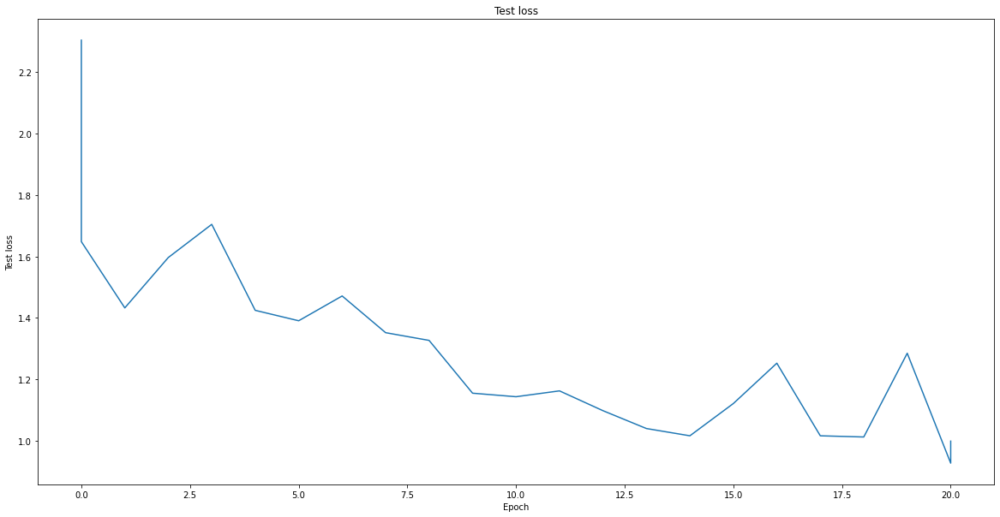

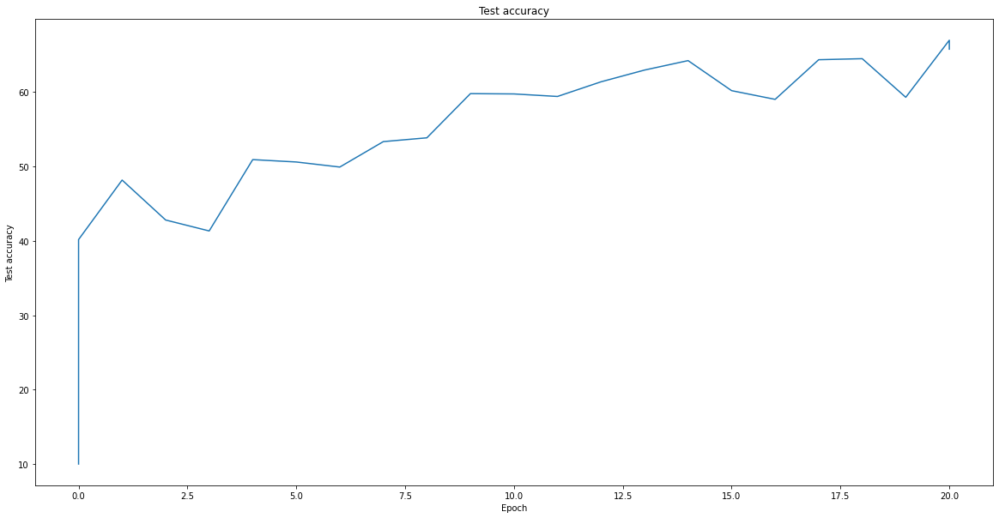

In [ ]:
#Experiment 0.8
# Adding transforms # Data augmentation KMARATHE

class CifarNet_0_3(nn.Module):
    def __init__(self):
        super(CifarNet_0_3, self).__init__()
        self.conv1 = nn.Conv2d(3, 32, 3, stride=1, padding=1) 
        self.conv2 = nn.Conv2d(32, 64, 3, stride=1, padding=1) 
        self.conv3 = nn.Conv2d(64, 128, 3, stride=1, padding=1)
        
        self.maxpool = nn.MaxPool2d(2, stride=2)

        self.conv1_bn = nn.BatchNorm2d(32)
        self.conv2_bn = nn.BatchNorm2d(64)
        self.conv3_bn = nn.BatchNorm2d(128)

        self.fc1 = nn.Linear(2048, 256)
        self.fc2 = nn.Linear(256, 10)
        self.accuracy = None

    def forward(self, x):
        x = self.conv1_bn(self.conv1(x)) #output 32 32x32
        x = F.relu(x)
        x = self.maxpool(x) #output 32 16x16
        #x = F.dropout(x, p=0.5, training=self.training)
        
        x = self.conv2_bn(self.conv2(x)) #output 64 16x16
        x = F.relu(x)
        x = self.maxpool(x) #output 64 8x8
        #x = F.dropout(x, p=0.5, training=self.training)

        x = self.conv3_bn(self.conv3(x)) #output 128 8x8
        x = F.relu(x)
        x = self.maxpool(x) #output 128 4x4
        #x = F.dropout(x, p=0.5, training=self.training)
       
        x = torch.flatten(x, 1)
        x = self.fc1(x)
        x = F.relu(x)
        x = self.fc2(x)
        return x

    def loss(self, prediction, label, reduction='mean'):
        loss_val = F.cross_entropy(prediction, label.squeeze(), reduction=reduction)
        return loss_val

    def save_model(self, file_path, num_to_keep=1):
        pt_util.save(self, file_path, num_to_keep)
        
    def save_best_model(self, accuracy, file_path, num_to_keep=1):
        if self.accuracy == None or accuracy > self.accuracy:
            self.accuracy = accuracy
            self.save_model(file_path, num_to_keep)

    def load_model(self, file_path):
        pt_util.restore(self, file_path)

    def load_last_model(self, dir_path):
        return pt_util.restore_latest(self, dir_path)



transform_train = transforms.Compose([
    transforms.RandomCrop(32, padding=4),
    transforms.RandomHorizontalFlip(),
    
    transforms.RandomRotation(90),
    #transforms.CenterCrop(10),
    transforms.ToTensor(),

    #transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)) #ADDED BY VTHOMA
  
   
     
])

transform_test = transforms.Compose([
    transforms.ToTensor(),
])

data_train = datasets.CIFAR10(root=DATA_PATH, train=True, download=True, transform=transform_train)
data_test = datasets.CIFAR10(root=DATA_PATH, train=False, download=True, transform=transform_test)



BATCH_SIZE = 256
TEST_BATCH_SIZE = 10
EPOCHS = 20
LEARNING_RATE = 0.01
MOMENTUM = 0.9
USE_CUDA = True
SEED = 0
PRINT_INTERVAL = 100
WEIGHT_DECAY = 0.0005


EXPERIMENT_VERSION = "0.8" # increment this to start a new experiment
print("Experiment Version = ", EXPERIMENT_VERSION)
LOG_PATH = DATA_PATH + 'logs/' + EXPERIMENT_VERSION + '/'

# Now the actual training code
use_cuda = USE_CUDA and torch.cuda.is_available()

torch.manual_seed(SEED) #Uncommented by VTHOMA

device = torch.device("cuda" if use_cuda else "cpu")
print('Using device', device)
import multiprocessing
print('num cpus:', multiprocessing.cpu_count())

kwargs = {'num_workers': multiprocessing.cpu_count(),
          'pin_memory': True} if use_cuda else {}

class_names = ['plane', 'car', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']

train_loader = torch.utils.data.DataLoader(data_train, batch_size=BATCH_SIZE,
                                           shuffle=True, **kwargs)
test_loader = torch.utils.data.DataLoader(data_test, batch_size=TEST_BATCH_SIZE,
                                          shuffle=False, **kwargs)

model = CifarNet_0_3().to(device)
optimizer = optim.SGD(model.parameters(), lr=LEARNING_RATE, momentum=MOMENTUM, weight_decay=WEIGHT_DECAY)
start_epoch = model.load_last_model(LOG_PATH)

train_losses, test_losses, test_accuracies, test_accuracies = pt_util.read_log(LOG_PATH + 'log.pkl', ([], [], [], []))
test_loss, test_accuracy = test(model, device, test_loader)

test_losses.append((start_epoch, test_loss))
test_accuracies.append((start_epoch, test_accuracy))

try:
    for epoch in range(start_epoch, EPOCHS + 1):
        print("epoch=", epoch)
        train_loss, train_accuracy = train(model, device, train_loader, optimizer, epoch, PRINT_INTERVAL)
        test_loss, test_accuracy = test(model, device, test_loader)
        train_losses.append((epoch, train_loss))
        train_accuracies.append((epoch, train_accuracy))
        test_losses.append((epoch, test_loss))
        test_accuracies.append((epoch, test_accuracy))
        pt_util.write_log(LOG_PATH + 'log.pkl', (train_losses, test_losses, train_accuracies, test_accuracies))
        model.save_best_model(test_accuracy, LOG_PATH + '%03d.pt' % epoch)


except KeyboardInterrupt as ke:
    print('Interrupted')
except:
    import traceback
    traceback.print_exc()
finally:
    model.save_model(LOG_PATH + '%03d.pt' % epoch, 0)
    ep, val = zip(*train_losses)
    pt_util.plot(ep, val, 'Train loss', 'Epoch', 'Train loss')
    ep, val = zip(*test_losses)
    pt_util.plot(ep, val, 'Test loss', 'Epoch', 'Test loss')
    #ep, val = zip(*train_accuracies)
    #pt_util.plot(ep, val, 'Train accuracy', 'Epoch', 'Train accuracy') 
    ep, val = zip(*test_accuracies)
    pt_util.plot(ep, val, 'Test accuracy', 'Epoch', 'Test accuracy')

Files already downloaded and verified
Files already downloaded and verified
Experiment Version =  0.9
Using device cuda
num cpus: 2

Test set: Average loss: 2.3034, Accuracy: 999/10000 (10%)

epoch= 0
Thu Oct 29 12:29:16 2020 Train Epoch: 0 [0/50000 (0%)]	Loss: 2.342045
Thu Oct 29 12:29:22 2020 Train Epoch: 0 [25600/50000 (51%)]	Loss: 1.606668

Train set: Average loss: 1.6363, Accuracy: 20000/50000 (40%)


Test set: Average loss: 1.5379, Accuracy: 4527/10000 (45%)

Saved /gdrive/My Drive/colab_files/hw1/cifar/logs/0.9/000.pt

epoch= 1
Thu Oct 29 12:29:31 2020 Train Epoch: 1 [0/50000 (0%)]	Loss: 1.450976
Thu Oct 29 12:29:36 2020 Train Epoch: 1 [25600/50000 (51%)]	Loss: 1.265520

Train set: Average loss: 1.3381, Accuracy: 25699/50000 (51%)


Test set: Average loss: 1.1098, Accuracy: 6036/10000 (60%)

Saved /gdrive/My Drive/colab_files/hw1/cifar/logs/0.9/001.pt

epoch= 2
Thu Oct 29 12:29:45 2020 Train Epoch: 2 [0/50000 (0%)]	Loss: 1.159503
Thu Oct 29 12:29:51 2020 Train Epoch: 2 [25600/50

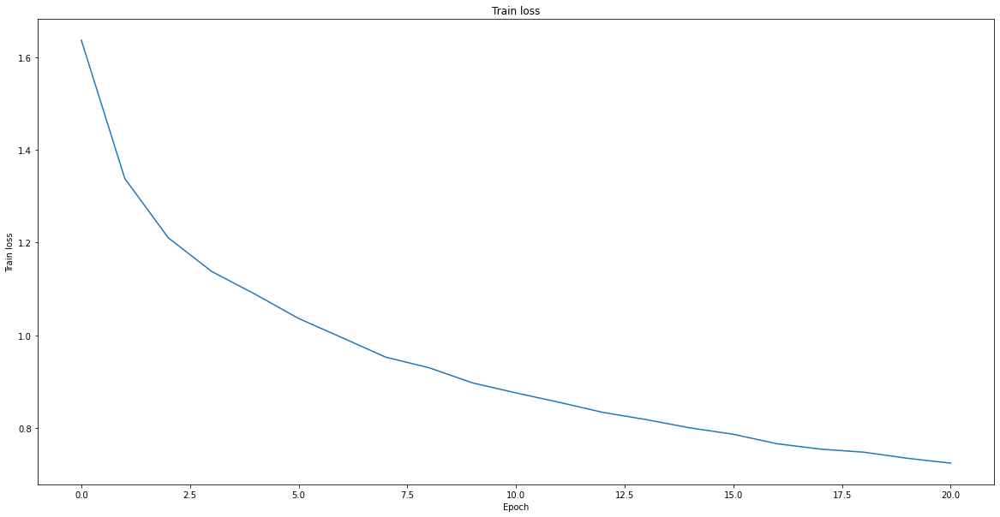

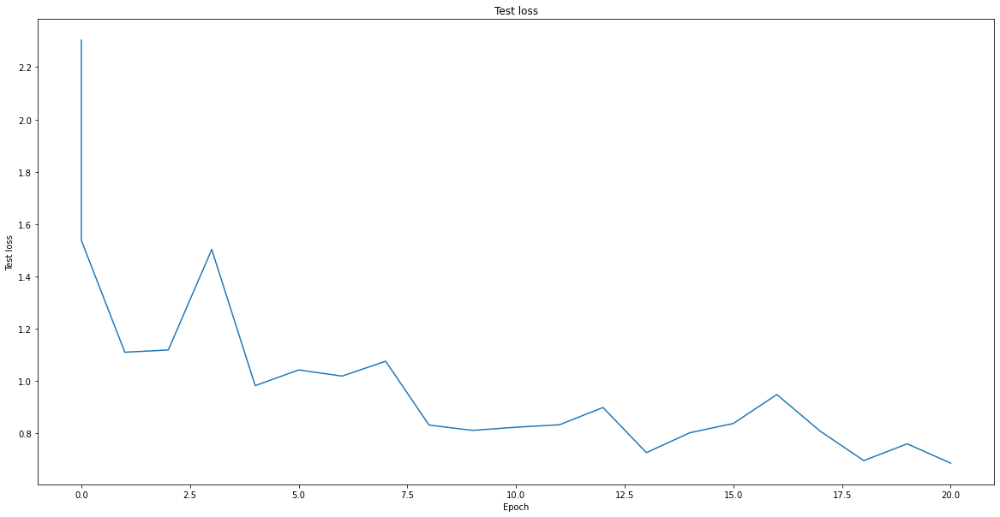

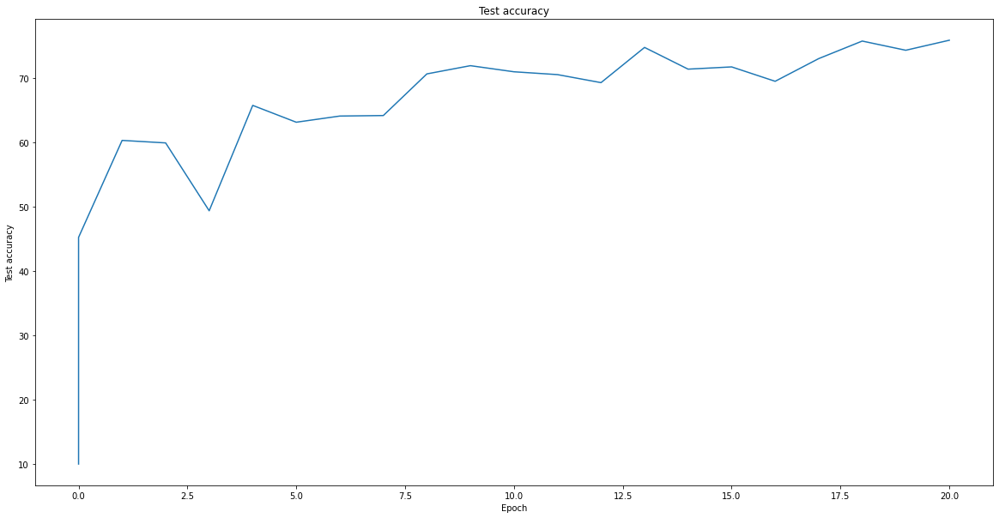

In [ ]:
#Experiment 0.9
# Adding transforms # Data augmentation KMARATHE

class CifarNet_0_3(nn.Module):
    def __init__(self):
        super(CifarNet_0_3, self).__init__()
        self.conv1 = nn.Conv2d(3, 32, 3, stride=1, padding=1) 
        self.conv2 = nn.Conv2d(32, 64, 3, stride=1, padding=1) 
        self.conv3 = nn.Conv2d(64, 128, 3, stride=1, padding=1)
        
        self.maxpool = nn.MaxPool2d(2, stride=2)

        self.conv1_bn = nn.BatchNorm2d(32)
        self.conv2_bn = nn.BatchNorm2d(64)
        self.conv3_bn = nn.BatchNorm2d(128)

        self.fc1 = nn.Linear(2048, 256)
        self.fc2 = nn.Linear(256, 10)
        self.accuracy = None

    def forward(self, x):
        x = self.conv1_bn(self.conv1(x)) #output 32 32x32
        x = F.relu(x)
        x = self.maxpool(x) #output 32 16x16
        #x = F.dropout(x, p=0.5, training=self.training)
        
        x = self.conv2_bn(self.conv2(x)) #output 64 16x16
        x = F.relu(x)
        x = self.maxpool(x) #output 64 8x8
        #x = F.dropout(x, p=0.5, training=self.training)

        x = self.conv3_bn(self.conv3(x)) #output 128 8x8
        x = F.relu(x)
        x = self.maxpool(x) #output 128 4x4
        #x = F.dropout(x, p=0.5, training=self.training)
       
        x = torch.flatten(x, 1)
        x = self.fc1(x)
        x = F.relu(x)
        x = self.fc2(x)
        return x

    def loss(self, prediction, label, reduction='mean'):
        loss_val = F.cross_entropy(prediction, label.squeeze(), reduction=reduction)
        return loss_val

    def save_model(self, file_path, num_to_keep=1):
        pt_util.save(self, file_path, num_to_keep)
        
    def save_best_model(self, accuracy, file_path, num_to_keep=1):
        if self.accuracy == None or accuracy > self.accuracy:
            self.accuracy = accuracy
            self.save_model(file_path, num_to_keep)

    def load_model(self, file_path):
        pt_util.restore(self, file_path)

    def load_last_model(self, dir_path):
        return pt_util.restore_latest(self, dir_path)



transform_train = transforms.Compose([
    transforms.RandomCrop(32, padding=4),
    transforms.RandomHorizontalFlip(),
    
    transforms.RandomRotation(30),
    #transforms.CenterCrop(10),
    transforms.ToTensor(),

    #transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)) #ADDED BY VTHOMA
  
   
     
])

transform_test = transforms.Compose([
    transforms.ToTensor(),
])

data_train = datasets.CIFAR10(root=DATA_PATH, train=True, download=True, transform=transform_train)
data_test = datasets.CIFAR10(root=DATA_PATH, train=False, download=True, transform=transform_test)



BATCH_SIZE = 256
TEST_BATCH_SIZE = 10
EPOCHS = 20
LEARNING_RATE = 0.01
MOMENTUM = 0.9
USE_CUDA = True
SEED = 0
PRINT_INTERVAL = 100
WEIGHT_DECAY = 0.0005


EXPERIMENT_VERSION = "0.9" # increment this to start a new experiment
print("Experiment Version = ", EXPERIMENT_VERSION)
LOG_PATH = DATA_PATH + 'logs/' + EXPERIMENT_VERSION + '/'

# Now the actual training code
use_cuda = USE_CUDA and torch.cuda.is_available()

torch.manual_seed(SEED) #Uncommented by VTHOMA

device = torch.device("cuda" if use_cuda else "cpu")
print('Using device', device)
import multiprocessing
print('num cpus:', multiprocessing.cpu_count())

kwargs = {'num_workers': multiprocessing.cpu_count(),
          'pin_memory': True} if use_cuda else {}

class_names = ['plane', 'car', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']

train_loader = torch.utils.data.DataLoader(data_train, batch_size=BATCH_SIZE,
                                           shuffle=True, **kwargs)
test_loader = torch.utils.data.DataLoader(data_test, batch_size=TEST_BATCH_SIZE,
                                          shuffle=False, **kwargs)

model = CifarNet_0_3().to(device)
optimizer = optim.SGD(model.parameters(), lr=LEARNING_RATE, momentum=MOMENTUM, weight_decay=WEIGHT_DECAY)
start_epoch = model.load_last_model(LOG_PATH)

train_losses, test_losses, test_accuracies, test_accuracies = pt_util.read_log(LOG_PATH + 'log.pkl', ([], [], [], []))
test_loss, test_accuracy = test(model, device, test_loader)

test_losses.append((start_epoch, test_loss))
test_accuracies.append((start_epoch, test_accuracy))

try:
    for epoch in range(start_epoch, EPOCHS + 1):
        print("epoch=", epoch)
        train_loss, train_accuracy = train(model, device, train_loader, optimizer, epoch, PRINT_INTERVAL)
        test_loss, test_accuracy = test(model, device, test_loader)
        train_losses.append((epoch, train_loss))
        train_accuracies.append((epoch, train_accuracy))
        test_losses.append((epoch, test_loss))
        test_accuracies.append((epoch, test_accuracy))
        pt_util.write_log(LOG_PATH + 'log.pkl', (train_losses, test_losses, train_accuracies, test_accuracies))
        model.save_best_model(test_accuracy, LOG_PATH + '%03d.pt' % epoch)


except KeyboardInterrupt as ke:
    print('Interrupted')
except:
    import traceback
    traceback.print_exc()
finally:
    model.save_model(LOG_PATH + '%03d.pt' % epoch, 0)
    ep, val = zip(*train_losses)
    pt_util.plot(ep, val, 'Train loss', 'Epoch', 'Train loss')
    ep, val = zip(*test_losses)
    pt_util.plot(ep, val, 'Test loss', 'Epoch', 'Test loss')
    #ep, val = zip(*train_accuracies)
    #pt_util.plot(ep, val, 'Train accuracy', 'Epoch', 'Train accuracy') 
    ep, val = zip(*test_accuracies)
    pt_util.plot(ep, val, 'Test accuracy', 'Epoch', 'Test accuracy')

##CIFAR Questions

**1. What design that you tried worked the best? This includes things like network design, learning rate, batch size, number of epochs, and other optimization parameters, data augmentation etc. What was the final train loss? Test loss? Test Accuracy? Provide the plots for train loss, test loss, and test accuracy.**


**Experiments**
1.   Experiment 0.1 (The original network provided)
     - 16 3x3 conv layer
     - 32 3x3 conv layer
     - 64 3x3 conv layer
     - Each conv layer had stride=2 and padding=1
     - BS=256, LR=0.01 (all other parameters same as default given)

     - Test accuracy=57% and Train accuracy=54%

2.   Experiment 0.2 (Higher LR)
     - Kept all parameters same as above, but chnageed LR=0.1 and EPOCH=30
     - Test accuracy = 63%, Train accuracy=62%

3. Experiment 0.3
     - 16 3x3 conv layer
     - 32 3x3 conv layer
     - 64 3x3 conv layer
     - Each conv layer has stride=1 and padding=1
     - Added maxpool layer(2x2) after each conv layer
     - Added batch normalization after each layer
     - LR=0.1, EPOCHS=25
     - Train accuracy = , Test accuracy = 

4. Experiment 0.4
     - Kept the network parameters same as above, LR=0.05, EPOCH=20
     - Train accuracy = 74%, Test accuracy = 72%

5. **Experiment 0.5**
    - Updated the network to use larger filter bank size
    - 32 3x3 conv layer
    - 64 3x3 conv layer
    - 128 3x3 conv layer
    - 2048x256 linear layer
    - 256x10 linear layer
    - Maxpool after each conv layer
    - Batch normalization after each layer
    - LR=0.01, EPOCHS=25, BS=256
    - data augmentation: RandomCrop,RandomHorizontalFlip
    - **Train accuracy - 84%, Test accuracy = 80%**

6. Experiment 0.6
    - Updated the network to use larger filter size
    - 32 5x5 conv layer
    - 64 5x5 conv layer
    - 128 5x5 conv layer
    - 2048x256 linear layer
    - 256x10 linear layer
    - Maxpool after each conv layer
    - Batch normalization after each layer
    - LR=0.01, EPOCHS=25, BS=256
    - Train accuracy - 86%, Test accuracy = 74%

7. Experiment 0.7
    - Took the model in experiment 0.5 and used a higher batch size
    - BS = 512
    - train accuracy = 81%, Test accuracy=78%

8. Experiment 0.8 
    - Added more data augmentation, specifically added RandomRotation(90), in addition to those mentioned in 0.5.
    - With this, the accuracy actually dropped, Train accuracy = 66%, Test accuracy = 66%
    - The conclusion is that, with a random roataion by 90 degrees, the 90 degree rotation is probably too much to improve the accuracy. So as a next experiment, we tried rotation by a smaller angle, say 30.

9. Experiment 0.9
   - Same as the experiment 0.8, but now we used a rotation of 30 degrees.
   - With this accuracy improved back to 76%.

Based on the above experiments, the best model we obtained was in Experiment 0.5

Model Details
  - 32 3x3 conv layer
  - 64 3x3 conv layer
  - 128 3x3 conv layer
  - 2048x256 linear layer
  - 256x10 linear layer
  - Maxpool after each conv layer
  - Batch normalization after each layer
Hyperparameters:
  - BATCH_SIZE = 256
  - TEST_BATCH_SIZE = 10
  - EPOCHS = 25
  - LEARNING_RATE = 0.01
  - MOMENTUM = 0.9
  - WEIGHT_DECAY = 0.0005

Train set: Average loss: 0.4518, Accuracy: 84%

Test set: Average loss: 0.5875, Accuracy: 80%

Plots:

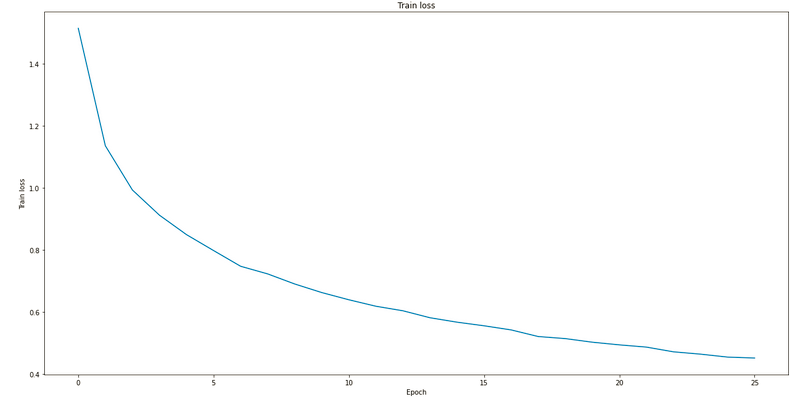

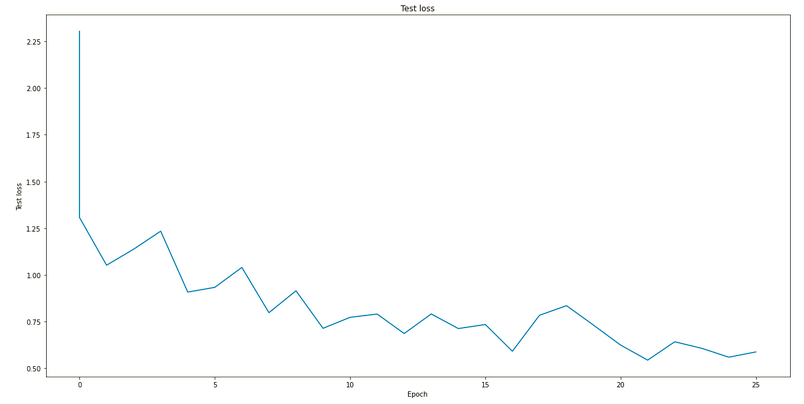

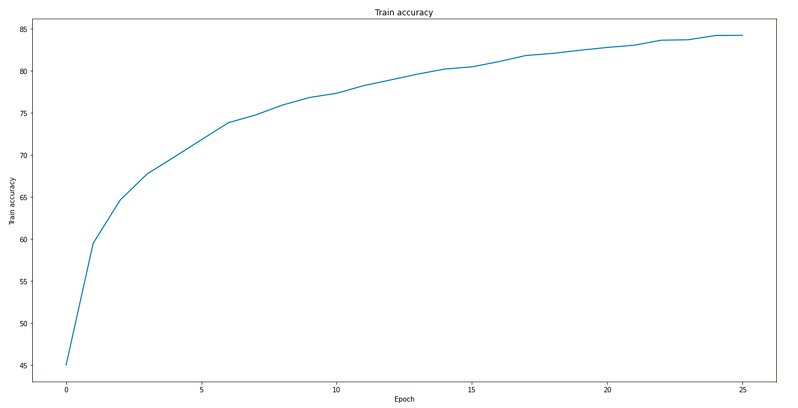

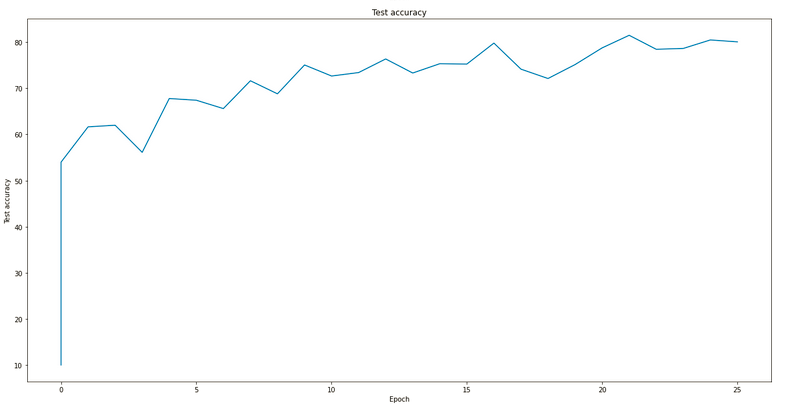

So the main takeaways from the experiments are:
  - Larger kernel sizes can improve accuracy, but slow down overall, so as a rule of thumb pick 3x3 kernel.
  - Having larger number of output channels in the conv layers and having more deeper network helps with accuracy.
  - Maxpooling helps improve performance.
  - However, on increasing the parameters(like filter size and number of filters) further, the model tends to overfit.
  - Batch normalization helps with faster convergence.
  - Batch norm and dropout helps with overfitting.

2. What design worked the worst (but still performed better than random chance)? Provide all the same information as question 1.

The experiment 0.8 performed poorly compared to the others. This experiment had the same parameters and network architecture as the above, but added a new data augmentation 
option - RandomRotation by 90degrees. With this, both test and train accuracy dropped to 66%. 
Our conclusion is that, this is because after 90 dergee rotation, the images probably become very different from the original and not good samples to actually train the network. This could be the reason why this option performed poorly.

The plots for this one can be seen above, under the heading Experiment 0.8.

Train set: Average loss: 0.9631, Accuracy: 66%

Test set: Average loss: 0.9993, Accuracy: 66%


3. Why do you think the best one worked well and the worst one worked poorly.

The best one(Experiment 0.5) worked well because it had more number of layers and filter sizes to model the training data. In addition, the batch normalization helped with faster convergence as it ensured the input to each layer is normalized. Data augmentation techniques helped with preventing overfitting.

The poor performing network had all the same parameters as the best one, the only addition was a  data augmenttaion option of Randomrotation by 90 degrees. This made the network perform poorly because 90 degree rotation chnaged the distribution of pixels significantly. Adding images with 90 degress rotation means the network can recognize for example a bird rotated by 90 degress. But we don't have such images in the test data as this type of data augmentation was not added in the test data. Which implies that adding this data augmentation transform in the training data was not useful.

This is clear because when we tried RandomRotation with 30 degrees, the accuracy improved back to 76%.

---
# TinyImageNet

## Part 1: Upload the Dataset
Change the DATA_PATH to the path of the TinyImageNet dataset we downloaded earlier.

In [ ]:
DATA_PATH = BASE_PATH + 'tiny_imagenet/'

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Part 2: Defining the Network
We're giving you no instructions on this part. Welcome to deep learning research! See if you can get above 40% accuracy. You probably want to use the Cross Entropy error again, but who knows, maybe you can find a better loss function. We will give you a few hints of things to try:

- Maxpooling
- Activation functions other than ReLU
- Batch Norm
- Dropout
- Residual connections

To define your network you'll have to figure out more about the Tiny ImageNet dataset. Specifically, what size are the images you'll be processing? How big is your label space? You can find this out by examining samples of your data.

In [ ]:
import torch
import torch.nn as nn
from torchvision import datasets
from torchvision import transforms
import numpy as np
import os
import torch.nn.functional as F
import torch.optim as optim
import h5py
import sys
sys.path.append(BASE_PATH)
import pt_util

In [ ]:
class TinyImagenetNet(nn.Module):
    def __init__(self):
        super(TinyImagenetNet, self).__init__()
        # TODO define the layers
        self.conv1 = nn.Conv2d(in_channels = 3, out_channels = 32, kernel_size = 3, stride=1, padding=1) 
        self.conv2 = nn.Conv2d(in_channels = 32, out_channels = 64, kernel_size = 3, stride=1, padding=1) 
        self.conv3 = nn.Conv2d(in_channels = 64, out_channels = 128, kernel_size = 3, stride=1, padding=1)
        
        self.maxpool = nn.MaxPool2d(2, stride=2)

        self.conv1_bn = nn.BatchNorm2d(num_features = 32)
        self.conv2_bn = nn.BatchNorm2d(num_features  = 64)
        self.conv3_bn = nn.BatchNorm2d(num_features  = 128)

        self.fc1 = nn.Linear(in_features = 8192, out_features = 2048)
        self.fc2 = nn.Linear(in_features = 2048, out_features  = 200)
        self.accuracy = None
        
        #raise NotImplementedError('Need to define the layers for your network')

    def forward(self, x):
        # TODO define the forward pass
        #raise NotImplementedError('Need to define the forward pass')
        x = self.conv1_bn(self.conv1(x)) #output 32 64x64
        x = F.relu(x)
        x = self.maxpool(x) #output 32 32x32
        #x = F.dropout(x, p=0.5, training=self.training)
        
        x = self.conv2_bn(self.conv2(x)) #output 64 32x32
        x = F.relu(x)
        x = self.maxpool(x) #output 64 16x16
        #x = F.dropout(x, p=0.5, training=self.training)

        x = self.conv3_bn(self.conv3(x)) #output 128 16x16
        x = F.relu(x)
        x = self.maxpool(x) #output 128 8x8
        #x = F.dropout(x, p=0.5, training=self.training)
       
        x = torch.flatten(x, 1)
        x = self.fc1(x)
        x = F.relu(x)
        x = self.fc2(x)
        return x
  

    def loss(self, prediction, label, reduction='mean'):
        loss_val = F.cross_entropy(prediction, label.squeeze(), reduction=reduction)
        return loss_val

    def save_model(self, file_path, num_to_keep=1):
        pt_util.save(self, file_path, num_to_keep)
        
    def save_best_model(self, accuracy, file_path, num_to_keep=1):
        if self.accuracy == None or accuracy > self.accuracy:
            self.accuracy = accuracy
            self.save_model(file_path, num_to_keep)

    def load_model(self, file_path):
        pt_util.restore(self, file_path)

    def load_last_model(self, dir_path):
        return pt_util.restore_latest(self, dir_path)


This time we are giving you the train and test functions, but feel free to modify them if you want. 

You may need to return some additional information for the logging portion of this assignment.


In [ ]:
import time
def train(model, device, train_loader, optimizer, epoch, log_interval):
    model.train()
    losses = []
    correct = 0 # KMARATHE
    for batch_idx, (data, label) in enumerate(train_loader):
        data, label = data.to(device), label.to(device)
        optimizer.zero_grad()
        output = model(data)

        #KMARATHE
        pred = output.max(1)[1]
        correct_mask = pred.eq(label.view_as(pred))
        num_correct = correct_mask.sum().item()
        correct += num_correct



        loss = model.loss(output, label)
        losses.append(loss.item())
        loss.backward()
        optimizer.step()
        if batch_idx % log_interval == 0:
            print('{} Train Epoch: {} [{}/{} ({:.0f}%)]\tLoss: {:.6f}'.format(
                time.ctime(time.time()),
                epoch, batch_idx * len(data), len(train_loader.dataset),
                100. * batch_idx / len(train_loader), loss.item()))
    
    # KMARATHE
    train_accuracy = 100 * correct /len(train_loader.dataset)
    
    #print("Training accuracy:", train_accuracy)
    print('\nTrain set: Average loss: {:.4f}, Accuracy: {}/{} ({:.0f}%)\n'.format(
        np.mean(losses), correct, len(train_loader.dataset), train_accuracy))
    return np.mean(losses), train_accuracy

def test(model, device, test_loader, return_images=False, log_interval=None):
    model.eval()
    test_loss = 0
    correct = 0

    correct_images = []
    correct_values = []

    error_images = []
    predicted_values = []
    gt_values = []
    with torch.no_grad():
        for batch_idx, (data, label) in enumerate(test_loader):
            data, label = data.to(device), label.to(device)
            output = model(data)
            test_loss_on = model.loss(output, label, reduction='sum').item()
            test_loss += test_loss_on
            pred = output.max(1)[1]
            correct_mask = pred.eq(label.view_as(pred))
            num_correct = correct_mask.sum().item()
            correct += num_correct
            if return_images:
                if num_correct > 0:
                    correct_images.append(data[correct_mask, ...].data.cpu().numpy())
                    correct_value_data = label[correct_mask].data.cpu().numpy()[:, 0]
                    correct_values.append(correct_value_data)
                if num_correct < len(label):
                    error_data = data[~correct_mask, ...].data.cpu().numpy()
                    error_images.append(error_data)
                    predicted_value_data = pred[~correct_mask].data.cpu().numpy()
                    predicted_values.append(predicted_value_data)
                    gt_value_data = label[~correct_mask].data.cpu().numpy()[:, 0]
                    gt_values.append(gt_value_data)
            if log_interval is not None and batch_idx % log_interval == 0:
                print('{} Test: [{}/{} ({:.0f}%)]\tLoss: {:.6f}'.format(
                    time.ctime(time.time()),
                    batch_idx * len(data), len(test_loader.dataset),
                    100. * batch_idx / len(test_loader), test_loss_on))
    if return_images:
        correct_images = np.concatenate(correct_images, axis=0)
        error_images = np.concatenate(error_images, axis=0)
        predicted_values = np.concatenate(predicted_values, axis=0)
        correct_values = np.concatenate(correct_values, axis=0)
        gt_values = np.concatenate(gt_values, axis=0)

    test_loss /= len(test_loader.dataset)
    test_accuracy = 100. * correct / len(test_loader.dataset)

    print('\nTest set: Average loss: {:.4f}, Accuracy: {}/{} ({:.0f}%)\n'.format(
        test_loss, correct, len(test_loader.dataset), test_accuracy))
    if return_images:
        return test_loss, test_accuracy, correct_images, correct_values, error_images, predicted_values, gt_values
    else:
        return test_loss, test_accuracy


## Part 3: Loading Data
PyTorch has a nice interface for dealing with a variety of data. You can read a good tutorial here https://pytorch.org/tutorials/beginner/data_loading_tutorial.html
Your friendly neighborhood TAs have made it even easier by preprocessing the data into a nice format. The data you uploaded is stored using hdf5 files which can be accessed a lot like Numpy arrays using the h5py package. In each of the files, there is a "dataset" called 'images', and one called 'labels'. Read more about h5py here http://docs.h5py.org/en/latest/quick.html

Hints:
1. HDF5s don't support concurrent accesses.
2. If you don't close the HDF5 file, you will still have problems with concurrency.
3. One way to deal with concurrent accesses is to copy the entirety of the data into each process separately. Then each process accesses its own copy of the data. https://stackoverflow.com/questions/40449659/does-h5py-read-the-whole-file-into-memory
4. Speed hint: With small datasets, it is almost always a good idea to cache the data to disk rather than continually read from files.


In [ ]:
# Data loader
class H5Dataset(torch.utils.data.Dataset):
    def __init__(self, h5_file, transform=None):
        self.transform = transform
        self.h5_file = h5py.File(h5_file, 'r')
        self.images = self.h5_file['images'][:]
        self.labels = torch.LongTensor(self.h5_file['labels'][:])
        
        # KMARATHE added 
        #print("labels")
        #print(self.labels)
        
    def __len__(self):
        return self.labels.shape[0]
      
    def __getitem__(self, idx):
        data = self.images[idx]
        label = self.labels[idx]
        
        if self.transform:
            data = self.transform(data)
        return (data, label)


## Part 4: Dataset Augmentation
In the MNIST assignment, we didn't do any data augmentation because MNIST is kind of easy.

In this assignment, you may find that data augmentation helps you a lot (or possibly hurts your performance).

You can find a bunch preimplemented here https://pytorch.org/docs/stable/torchvision/transforms.html and you can also do your own as seen in the tutorial from part 3.

Play around with various data augmentations we will suggest some.

- ToPILImage - This one is useful for a lot of the built in transforms which expect PIL images. 
- RandomHorizontalFlip
- RandomResizedCrop
- ColorJitter
- RandomRotation
- Normalize
- Adding various types of noise
- ToTensor - PyTorch expects the output from the dataset to be a tensor in CxHxW format.


Note: You should be careful about which of these you apply to the test data. You usually don't want to apply noise to the test data, but you do want to normalize it in the same way for example.


In [ ]:
# Added random rotation in data augmentation transforms
train_transforms = transforms.Compose([
    transforms.ToPILImage(),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(90),
    transforms.ToTensor(),
    ])

test_transforms = transforms.Compose([
    transforms.ToTensor(),
    ])

data_train = H5Dataset(DATA_PATH + 'train.h5', transform=train_transforms)


#KMARATHE added this
#print(data_train.__len__())
#print(data_train.__getitem__(99999))
# print(len(data_train))
# print(type(data_train[0]))
# print(data_train[0][0].size())
data_test = H5Dataset(DATA_PATH + 'val.h5', transform=test_transforms)
#print(len(data_test))


## Part 5: Training the network
Generally, it is useful to see how your training is going. Often people print their loss to make sure it goes down and their accuracy to make sure it goes up. But pictures are better than words. So for this part, you should record and plot the training loss, test loss, and test accuracy (and whatever else you want). 

We have created a very simple logging interface which essentially just saves and restores files via pickle in pt_util. Saving and restoring log data is important if you end your run early and want to continue where you left off rather than starting over.

We have also provided a plot function which can plot a single line graph. You can use it and plot each value independently, or change it to plot them all in one graph. 


__Important note: Do not forget to title your graphs and label your axes. Plots are meaningless without a way to read them.__

Second Note: It will be helpful for you when deciding what network structure, data augmentation, and such work to title the graphs accordingly so you remember.
Third Note: The default setup right now saves and restores the network weights from a single folder. When you modify network architectures, you may want to save the resulting files in different folders (with appropriate names).

We also provided a function for showing some results, because it's not satisfying to train a neural net, you also want to see what it can do! This can also be useful for figuring out what your network is doing well, and what it is failing at. This type of error analysis is very common when training neural networks.


Using device cuda
num cpus: 2

Test set: Average loss: 5.2987, Accuracy: 33/8000 (0%)



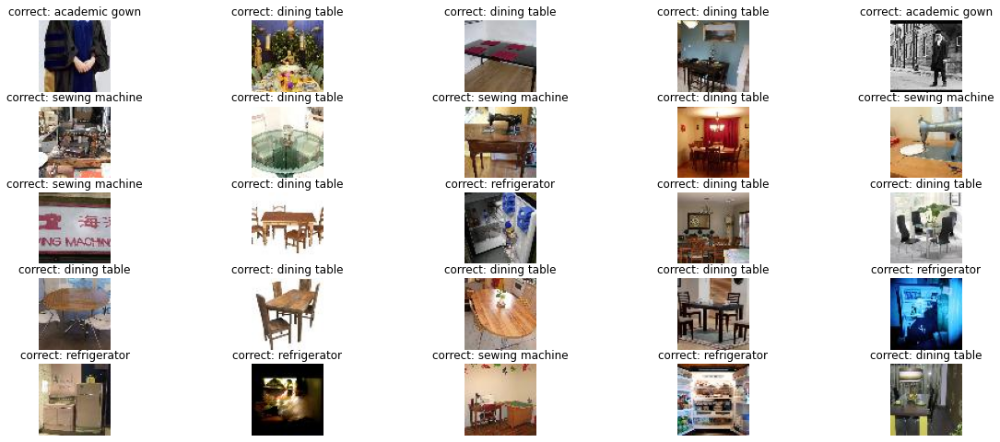

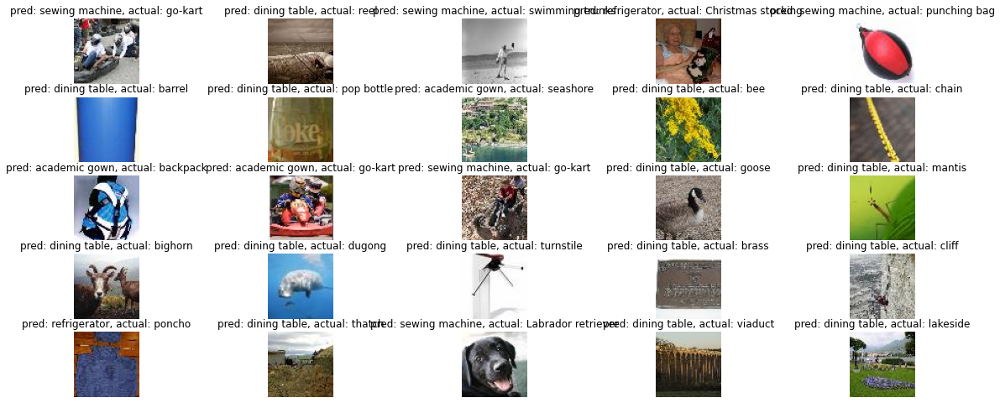

Wed Oct 28 23:24:29 2020 Train Epoch: 0 [0/100000 (0%)]	Loss: 5.322828
Wed Oct 28 23:24:44 2020 Train Epoch: 0 [51200/100000 (51%)]	Loss: 4.503405

Train set: Average loss: 4.6116, Accuracy: 7239/100000 (7%)


Test set: Average loss: 4.2865, Accuracy: 865/8000 (11%)

Saved /gdrive/My Drive/colab_files/hw1/tiny_imagenet/logs/0.1/000.pt

Wed Oct 28 23:25:03 2020 Train Epoch: 1 [0/100000 (0%)]	Loss: 4.159202
Wed Oct 28 23:25:18 2020 Train Epoch: 1 [51200/100000 (51%)]	Loss: 3.992640

Train set: Average loss: 4.0342, Accuracy: 14027/100000 (14%)


Test set: Average loss: 3.9550, Accuracy: 1186/8000 (15%)

Saved /gdrive/My Drive/colab_files/hw1/tiny_imagenet/logs/0.1/001.pt

Wed Oct 28 23:25:37 2020 Train Epoch: 2 [0/100000 (0%)]	Loss: 3.814530
Wed Oct 28 23:25:52 2020 Train Epoch: 2 [51200/100000 (51%)]	Loss: 3.871561

Train set: Average loss: 3.7907, Accuracy: 17718/100000 (18%)


Test set: Average loss: 3.9626, Accuracy: 1198/8000 (15%)

Saved /gdrive/My Drive/colab_files/hw1/tiny_imagen

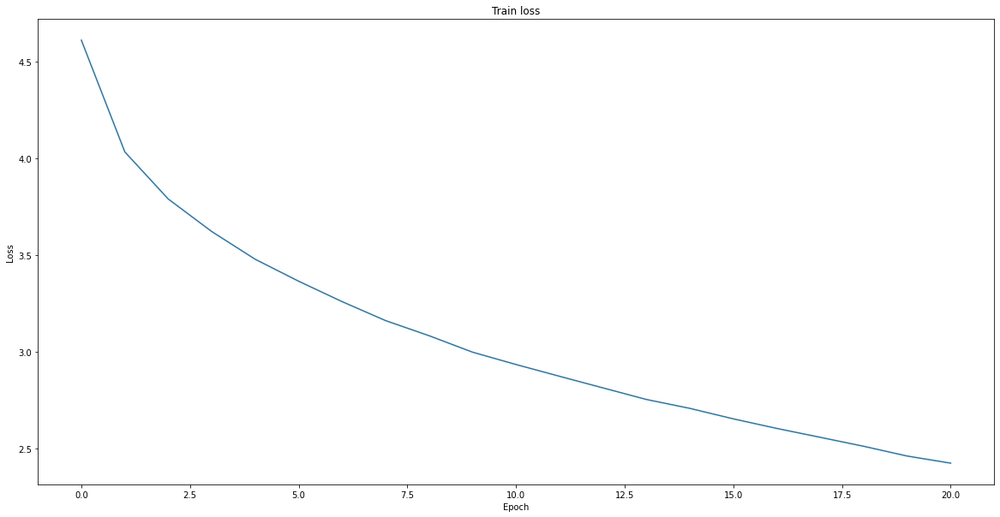

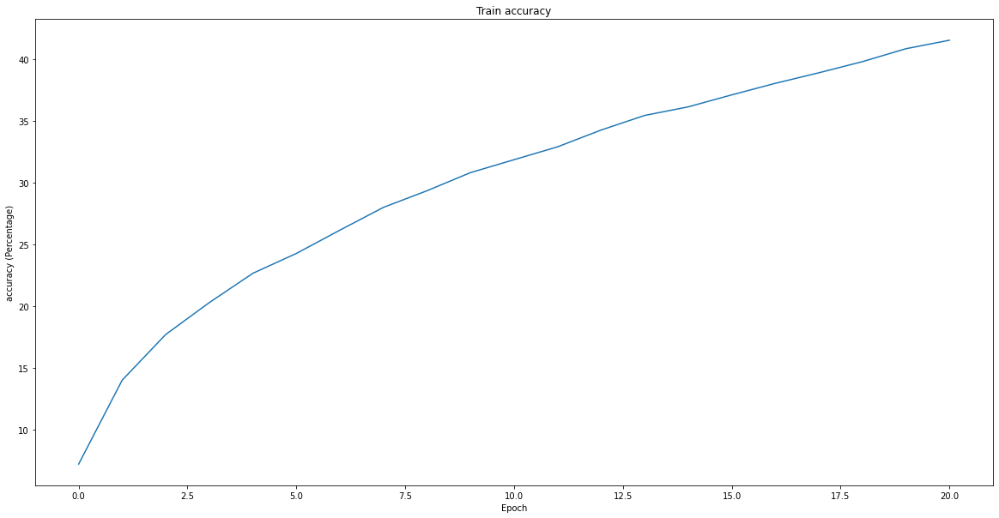

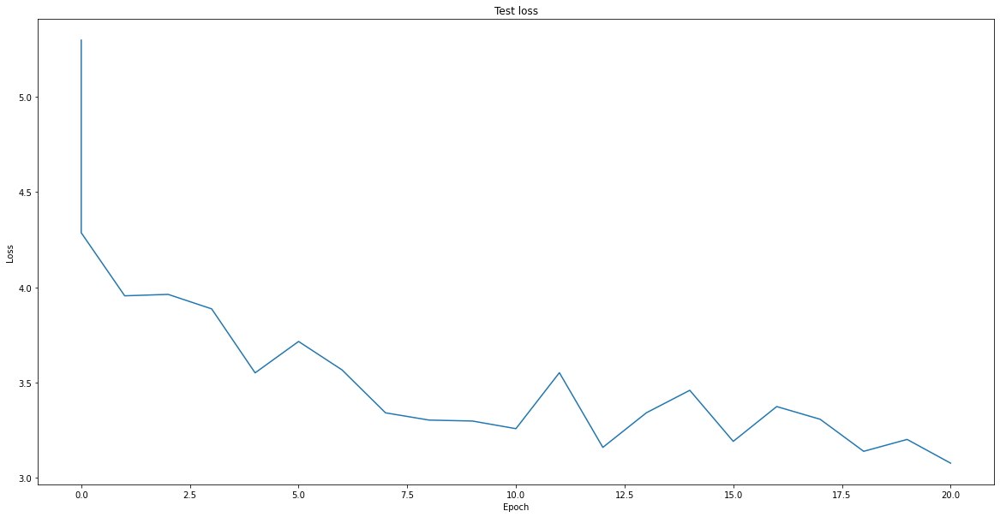

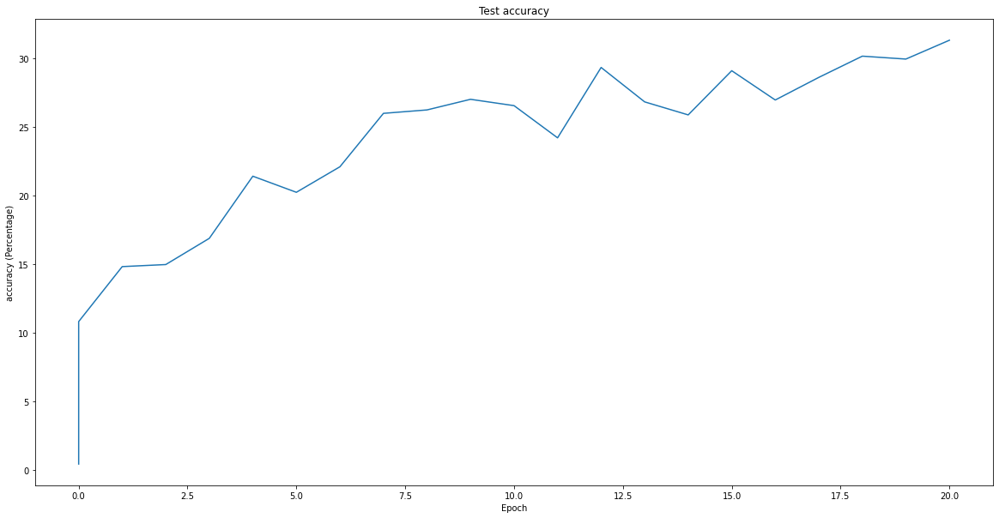

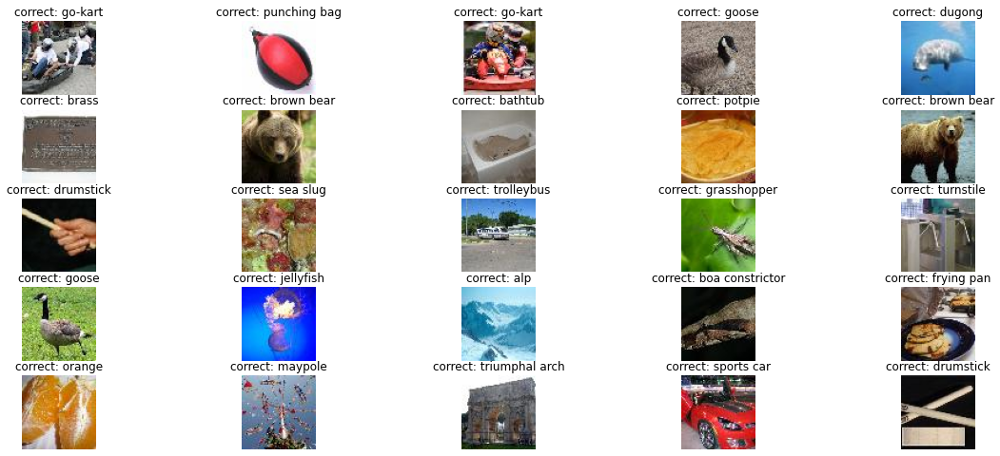

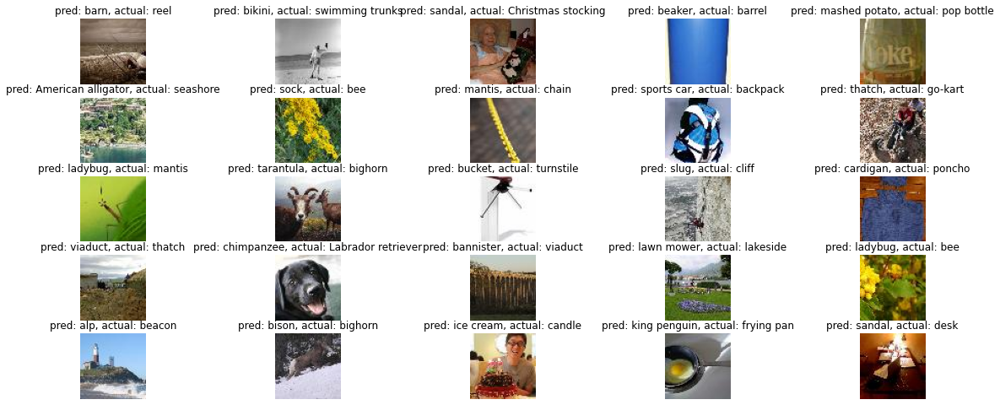

In [ ]:
#KMARATHE 
class TinyImagenetNet_1(nn.Module):
    def __init__(self):
        super(TinyImagenetNet_1, self).__init__()
        # TODO define the layers
        self.conv1 = nn.Conv2d(in_channels = 3, out_channels = 32, kernel_size = 3, stride=1, padding=1) 
        self.conv2 = nn.Conv2d(in_channels = 32, out_channels = 64, kernel_size = 3, stride=1, padding=1) 
        self.conv3 = nn.Conv2d(in_channels = 64, out_channels = 128, kernel_size = 3, stride=1, padding=1)
        
        self.maxpool = nn.MaxPool2d(2, stride=2)

        self.conv1_bn = nn.BatchNorm2d(num_features = 32)
        self.conv2_bn = nn.BatchNorm2d(num_features  = 64)
        self.conv3_bn = nn.BatchNorm2d(num_features  = 128)

        self.fc1 = nn.Linear(in_features = 8192, out_features = 2048)
        self.fc2 = nn.Linear(in_features = 2048, out_features  = 200)
        self.accuracy = None
        
        #raise NotImplementedError('Need to define the layers for your network')

    def forward(self, x):
        # TODO define the forward pass
        #raise NotImplementedError('Need to define the forward pass')
        x = self.conv1_bn(self.conv1(x)) #output 32 64x64
        x = F.relu(x)
        x = self.maxpool(x) #output 32 32x32
        #x = F.dropout(x, p=0.5, training=self.training)
        
        x = self.conv2_bn(self.conv2(x)) #output 64 32x32
        x = F.relu(x)
        x = self.maxpool(x) #output 64 16x16
        #x = F.dropout(x, p=0.5, training=self.training)

        x = self.conv3_bn(self.conv3(x)) #output 128 16x16
        x = F.relu(x)
        x = self.maxpool(x) #output 128 8x8
        #x = F.dropout(x, p=0.5, training=self.training)
       
        x = torch.flatten(x, 1)
        x = self.fc1(x)
        x = F.relu(x)
        x = self.fc2(x)
        return x
  

    def loss(self, prediction, label, reduction='mean'):
        loss_val = F.cross_entropy(prediction, label.squeeze(), reduction=reduction)
        return loss_val

    def save_model(self, file_path, num_to_keep=1):
        pt_util.save(self, file_path, num_to_keep)
        
    def save_best_model(self, accuracy, file_path, num_to_keep=1):
        if self.accuracy == None or accuracy > self.accuracy:
            self.accuracy = accuracy
            self.save_model(file_path, num_to_keep)

    def load_model(self, file_path):
        pt_util.restore(self, file_path)

    def load_last_model(self, dir_path):
        return pt_util.restore_latest(self, dir_path)










# Play around with these constants, you may find a better setting.
BATCH_SIZE = 512
TEST_BATCH_SIZE = 10
EPOCHS = 20
LEARNING_RATE = 0.02
MOMENTUM = 0.9
USE_CUDA = True
SEED = 0
PRINT_INTERVAL = 100
WEIGHT_DECAY = 0.0005

EXPERIMENT_VERSION = "0.1" # increment this to start a new experiment
LOG_PATH = DATA_PATH + 'logs/' + EXPERIMENT_VERSION + '/'

# Now the actual training code
use_cuda = USE_CUDA and torch.cuda.is_available()

torch.manual_seed(SEED)

device = torch.device("cuda" if use_cuda else "cpu")
print('Using device', device)
import multiprocessing
print('num cpus:', multiprocessing.cpu_count())

kwargs = {'num_workers': multiprocessing.cpu_count(),
          'pin_memory': True} if use_cuda else {}

class_names = [line.strip().split(', ') for line in open(DATA_PATH + 'class_names.txt')]
name_to_class = {line[1]: line[0] for line in class_names}
class_names = [line[1] for line in class_names]

train_loader = torch.utils.data.DataLoader(data_train, batch_size=BATCH_SIZE,
                                           shuffle=True, **kwargs)
test_loader = torch.utils.data.DataLoader(data_test, batch_size=TEST_BATCH_SIZE,
                                          shuffle=False, **kwargs)

model = TinyImagenetNet_1().to(device)
optimizer = optim.SGD(model.parameters(), lr=LEARNING_RATE, momentum=MOMENTUM, weight_decay=WEIGHT_DECAY)
start_epoch = model.load_last_model(LOG_PATH)

train_losses, train_accuracies, test_losses, test_accuracies = pt_util.read_log(LOG_PATH + 'log.pkl', ([], [], [], [] ))
test_loss, test_accuracy, correct_images, correct_val, error_images, predicted_val, gt_val = test(model, device, test_loader, True)

correct_images = pt_util.to_scaled_uint8(correct_images.transpose(0, 2, 3, 1))
error_images = pt_util.to_scaled_uint8(error_images.transpose(0, 2, 3, 1))
pt_util.show_images(correct_images, ['correct: %s' % class_names[aa] for aa in correct_val])
pt_util.show_images(error_images, ['pred: %s, actual: %s' % (class_names[aa], class_names[bb]) for aa, bb in zip(predicted_val, gt_val)])

test_losses.append((start_epoch, test_loss))
test_accuracies.append((start_epoch, test_accuracy))

try:
    for epoch in range(start_epoch, EPOCHS + 1):
        train_loss, train_accuracy = train(model, device, train_loader, optimizer, epoch, PRINT_INTERVAL)
        test_loss, test_accuracy, correct_images, correct_val, error_images, predicted_val, gt_val = test(model, device, test_loader, True)
        train_losses.append((epoch, train_loss))
        train_accuracies.append((epoch, train_accuracy))
        test_losses.append((epoch, test_loss))
        test_accuracies.append((epoch, test_accuracy))
        pt_util.write_log(LOG_PATH + '.pkl', (train_losses, test_losses, test_accuracies))
        model.save_best_model(test_accuracy, LOG_PATH + '%03d.pt' % epoch)


except KeyboardInterrupt as ke:
    print('Interrupted')
except:
    import traceback
    traceback.print_exc()
finally:
    model.save_model(LOG_PATH + '%03d.pt' % epoch, 0)
    ep, val = zip(*train_losses)
    pt_util.plot(ep, val, 'Train loss', 'Epoch', 'Loss')
    ep, val = zip(*train_accuracies)
    pt_util.plot(ep, val, 'Train accuracy', 'Epoch', 'accuracy (Percentage)')
    ep, val = zip(*test_losses)
    pt_util.plot(ep, val, 'Test loss', 'Epoch', 'Loss')
    ep, val = zip(*test_accuracies)
    pt_util.plot(ep, val, 'Test accuracy', 'Epoch', 'accuracy (Percentage)')
    correct_images = pt_util.to_scaled_uint8(correct_images.transpose(0, 2, 3, 1))
    error_images = pt_util.to_scaled_uint8(error_images.transpose(0, 2, 3, 1))
    pt_util.show_images(correct_images, ['correct: %s' % class_names[aa] for aa in correct_val])
    pt_util.show_images(error_images, ['pred: %s, actual: %s' % (class_names[aa], class_names[bb]) for aa, bb in zip(predicted_val, gt_val)])


Using device cuda
num cpus: 2

Test set: Average loss: 5.2985, Accuracy: 36/8000 (0%)



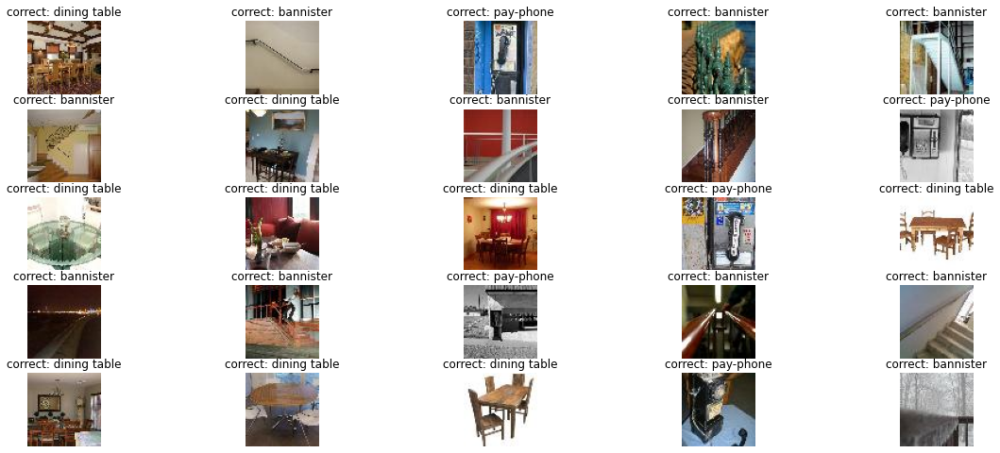

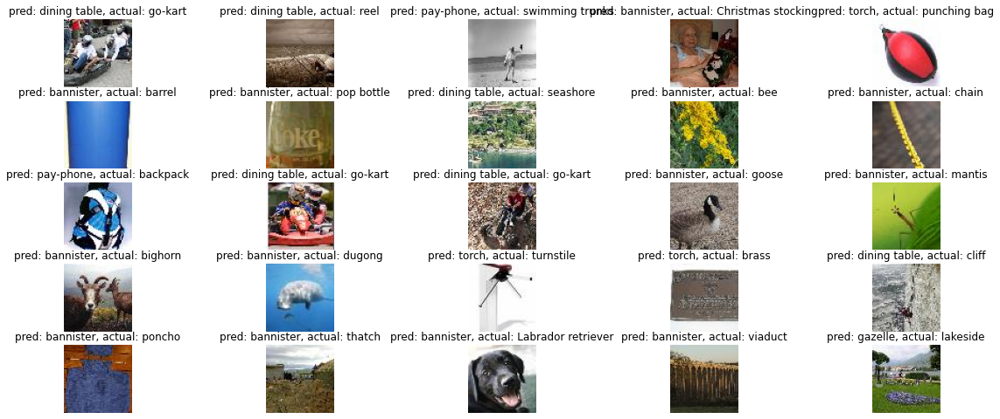

Thu Oct 29 00:10:13 2020 Train Epoch: 0 [0/100000 (0%)]	Loss: 5.298368
Thu Oct 29 00:10:22 2020 Train Epoch: 0 [25600/100000 (26%)]	Loss: 4.999118
Thu Oct 29 00:10:32 2020 Train Epoch: 0 [51200/100000 (51%)]	Loss: 4.531866
Thu Oct 29 00:10:41 2020 Train Epoch: 0 [76800/100000 (77%)]	Loss: 4.343696

Train set: Average loss: 4.6738, Accuracy: 6264/100000 (6%)


Test set: Average loss: 4.5324, Accuracy: 633/8000 (8%)

Saved /gdrive/My Drive/colab_files/hw1/tiny_imagenet/logs/0.2/000.pt

Thu Oct 29 00:10:55 2020 Train Epoch: 1 [0/100000 (0%)]	Loss: 4.270817
Thu Oct 29 00:11:05 2020 Train Epoch: 1 [25600/100000 (26%)]	Loss: 4.058011
Thu Oct 29 00:11:15 2020 Train Epoch: 1 [51200/100000 (51%)]	Loss: 3.923233
Thu Oct 29 00:11:24 2020 Train Epoch: 1 [76800/100000 (77%)]	Loss: 4.066017

Train set: Average loss: 4.0813, Accuracy: 13230/100000 (13%)


Test set: Average loss: 3.9852, Accuracy: 1131/8000 (14%)

Saved /gdrive/My Drive/colab_files/hw1/tiny_imagenet/logs/0.2/001.pt

Thu Oct 29 00:11:3

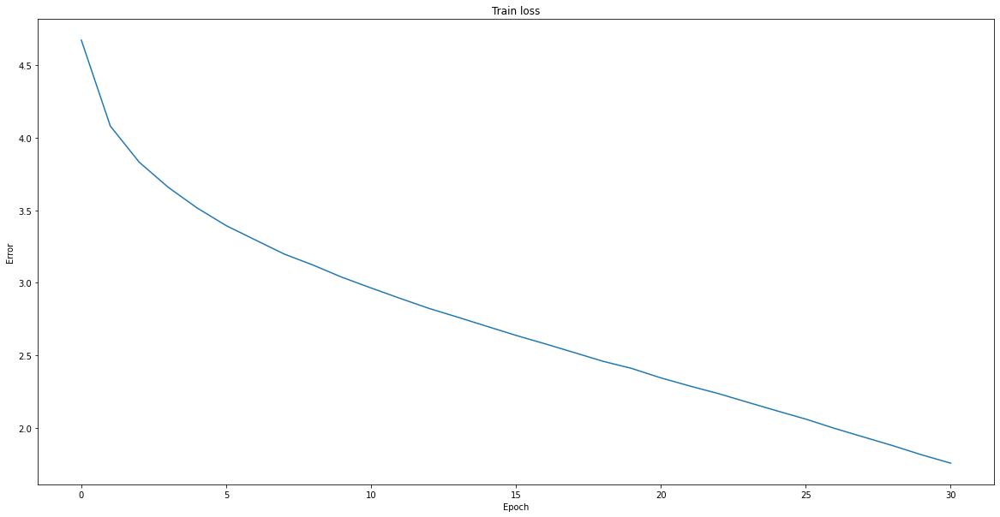

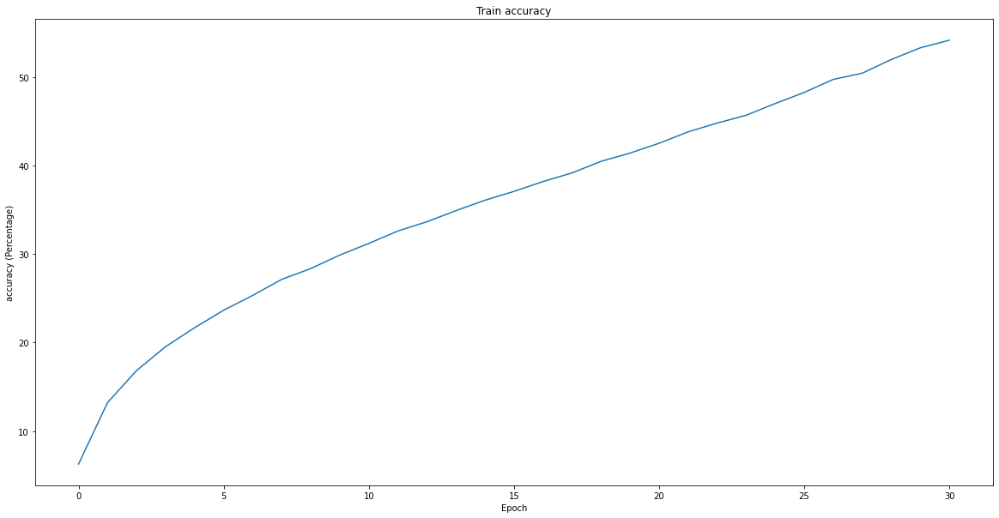

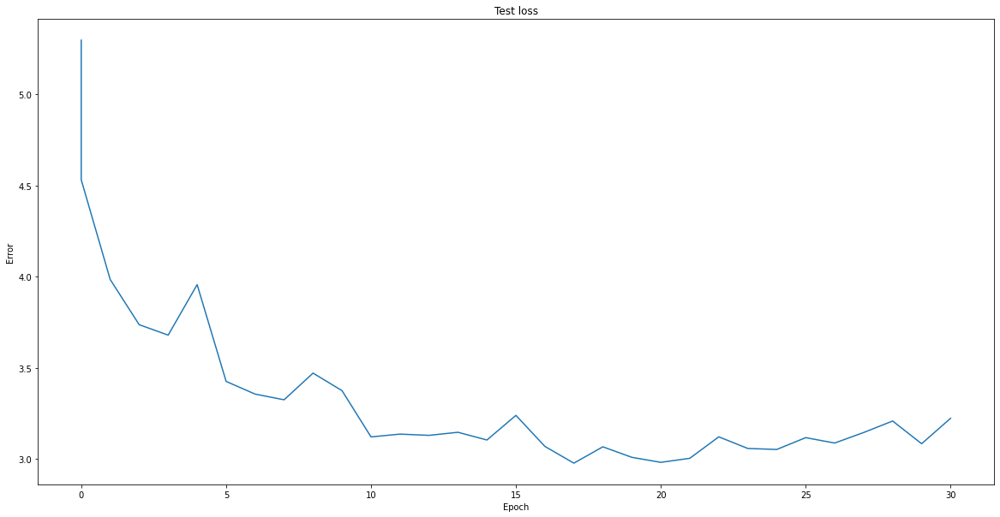

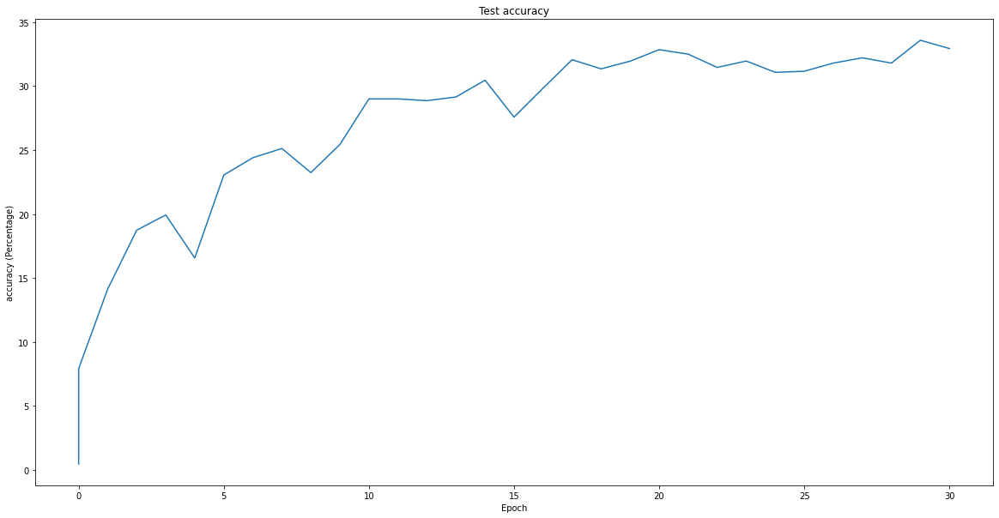

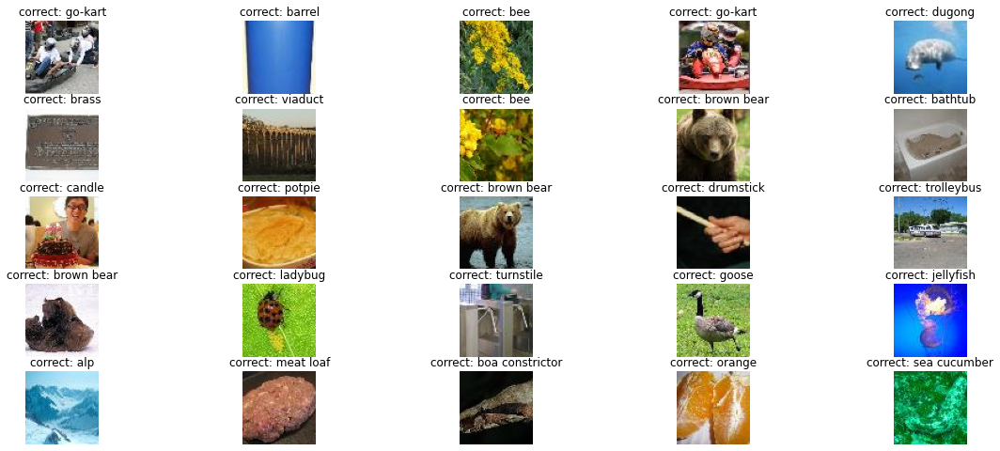

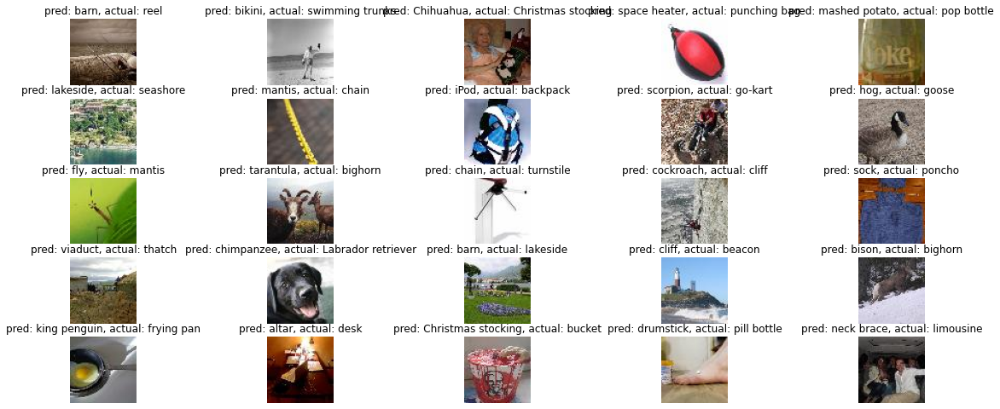

In [ ]:
#KMARATHE  
# Using leaky relu activation
# Decreasing the learning rate
# Decreasing the batch size
# increasing the number of epochs
# added an extra linear layer
class TinyImagenetNet_2(nn.Module):
    def __init__(self):
        super(TinyImagenetNet_2, self).__init__()
        # TODO define the layers
        self.conv1 = nn.Conv2d(in_channels = 3, out_channels = 32, kernel_size = 3, stride=1, padding=1) 
        self.conv2 = nn.Conv2d(in_channels = 32, out_channels = 64, kernel_size = 3, stride=1, padding=1) 
        self.conv3 = nn.Conv2d(in_channels = 64, out_channels = 128, kernel_size = 3, stride=1, padding=1)
        
        self.maxpool = nn.MaxPool2d(2, stride=2)
        self.LeakyReLU = nn.LeakyReLU(0.1)

        self.conv1_bn = nn.BatchNorm2d(num_features = 32)
        self.conv2_bn = nn.BatchNorm2d(num_features  = 64)
        self.conv3_bn = nn.BatchNorm2d(num_features  = 128)

        self.fc1 = nn.Linear(in_features = 8192, out_features = 4096)
        self.fc2 = nn.Linear(in_features = 4096, out_features = 2048)
        self.fc3 = nn.Linear(in_features = 2048, out_features  = 200)
        self.accuracy = None
        
        #raise NotImplementedError('Need to define the layers for your network')

    def forward(self, x):
        # TODO define the forward pass
        #raise NotImplementedError('Need to define the forward pass')
        x = self.conv1_bn(self.conv1(x)) #output 32 64x64
        x = self.LeakyReLU(x)
        x = self.maxpool(x) #output 32 32x32
        #x = F.dropout(x, p=0.5, training=self.training)
        
        x = self.conv2_bn(self.conv2(x)) #output 64 32x32
        x = self.LeakyReLU(x)
        x = self.maxpool(x) #output 64 16x16
        #x = F.dropout(x, p=0.5, training=self.training)

        x = self.conv3_bn(self.conv3(x)) #output 128 16x16
        x = self.LeakyReLU(x)
        x = self.maxpool(x) #output 128 8x8
        #x = F.dropout(x, p=0.5, training=self.training)
       
        x = torch.flatten(x, 1)
        x = self.fc1(x)
        x = self.LeakyReLU(x)
        x = self.fc2(x)
        x = self.LeakyReLU(x)
        x = self.fc3(x)
        return x
  

    def loss(self, prediction, label, reduction='mean'):
        loss_val = F.cross_entropy(prediction, label.squeeze(), reduction=reduction)
        return loss_val

    def save_model(self, file_path, num_to_keep=1):
        pt_util.save(self, file_path, num_to_keep)
        
    def save_best_model(self, accuracy, file_path, num_to_keep=1):
        if self.accuracy == None or accuracy > self.accuracy:
            self.accuracy = accuracy
            self.save_model(file_path, num_to_keep)

    def load_model(self, file_path):
        pt_util.restore(self, file_path)

    def load_last_model(self, dir_path):
        return pt_util.restore_latest(self, dir_path)










# Play around with these constants, you may find a better setting.
BATCH_SIZE = 256
TEST_BATCH_SIZE = 10
EPOCHS = 30
LEARNING_RATE = 0.01
MOMENTUM = 0.9
USE_CUDA = True
SEED = 0
PRINT_INTERVAL = 100
WEIGHT_DECAY = 0.0005

EXPERIMENT_VERSION = "0.2" # increment this to start a new experiment
LOG_PATH = DATA_PATH + 'logs/' + EXPERIMENT_VERSION + '/'

# Now the actual training code
use_cuda = USE_CUDA and torch.cuda.is_available()

torch.manual_seed(SEED)

device = torch.device("cuda" if use_cuda else "cpu")
print('Using device', device)
import multiprocessing
print('num cpus:', multiprocessing.cpu_count())

kwargs = {'num_workers': multiprocessing.cpu_count(),
          'pin_memory': True} if use_cuda else {}

class_names = [line.strip().split(', ') for line in open(DATA_PATH + 'class_names.txt')]
name_to_class = {line[1]: line[0] for line in class_names}
class_names = [line[1] for line in class_names]

train_loader = torch.utils.data.DataLoader(data_train, batch_size=BATCH_SIZE,
                                           shuffle=True, **kwargs)
test_loader = torch.utils.data.DataLoader(data_test, batch_size=TEST_BATCH_SIZE,
                                          shuffle=False, **kwargs)

model = TinyImagenetNet_2().to(device)
optimizer = optim.SGD(model.parameters(), lr=LEARNING_RATE, momentum=MOMENTUM, weight_decay=WEIGHT_DECAY)
start_epoch = model.load_last_model(LOG_PATH)

train_losses, train_accuracies, test_losses, test_accuracies = pt_util.read_log(LOG_PATH + 'log.pkl', ([], [], [], [] ))
test_loss, test_accuracy, correct_images, correct_val, error_images, predicted_val, gt_val = test(model, device, test_loader, True)

correct_images = pt_util.to_scaled_uint8(correct_images.transpose(0, 2, 3, 1))
error_images = pt_util.to_scaled_uint8(error_images.transpose(0, 2, 3, 1))
pt_util.show_images(correct_images, ['correct: %s' % class_names[aa] for aa in correct_val])
pt_util.show_images(error_images, ['pred: %s, actual: %s' % (class_names[aa], class_names[bb]) for aa, bb in zip(predicted_val, gt_val)])

test_losses.append((start_epoch, test_loss))
test_accuracies.append((start_epoch, test_accuracy))

try:
    for epoch in range(start_epoch, EPOCHS + 1):
        train_loss, train_accuracy = train(model, device, train_loader, optimizer, epoch, PRINT_INTERVAL)
        test_loss, test_accuracy, correct_images, correct_val, error_images, predicted_val, gt_val = test(model, device, test_loader, True)
        train_losses.append((epoch, train_loss))
        train_accuracies.append((epoch, train_accuracy))
        test_losses.append((epoch, test_loss))
        test_accuracies.append((epoch, test_accuracy))
        pt_util.write_log(LOG_PATH + '.pkl', (train_losses, test_losses, test_accuracies))
        model.save_best_model(test_accuracy, LOG_PATH + '%03d.pt' % epoch)


except KeyboardInterrupt as ke:
    print('Interrupted')
except:
    import traceback
    traceback.print_exc()
finally:
    model.save_model(LOG_PATH + '%03d.pt' % epoch, 0)
    ep, val = zip(*train_losses)
    pt_util.plot(ep, val, 'Train loss', 'Epoch', 'Error')
    ep, val = zip(*train_accuracies)
    pt_util.plot(ep, val, 'Train accuracy', 'Epoch', 'accuracy (Percentage)')
    ep, val = zip(*test_losses)
    pt_util.plot(ep, val, 'Test loss', 'Epoch', 'Error')
    ep, val = zip(*test_accuracies)
    pt_util.plot(ep, val, 'Test accuracy', 'Epoch', 'accuracy (Percentage)')
    correct_images = pt_util.to_scaled_uint8(correct_images.transpose(0, 2, 3, 1))
    error_images = pt_util.to_scaled_uint8(error_images.transpose(0, 2, 3, 1))
    pt_util.show_images(correct_images, ['correct: %s' % class_names[aa] for aa in correct_val])
    pt_util.show_images(error_images, ['pred: %s, actual: %s' % (class_names[aa], class_names[bb]) for aa, bb in zip(predicted_val, gt_val)])













Using device cuda
num cpus: 2

Test set: Average loss: 5.2990, Accuracy: 37/8000 (0%)



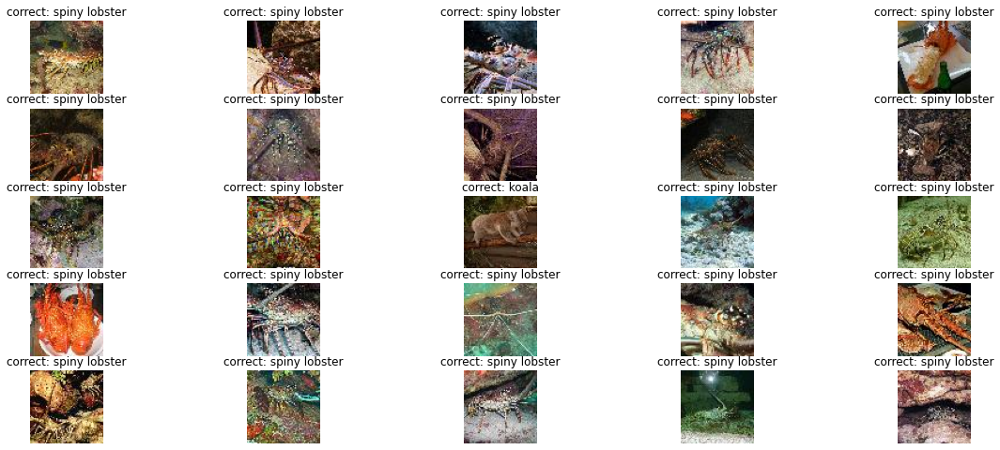

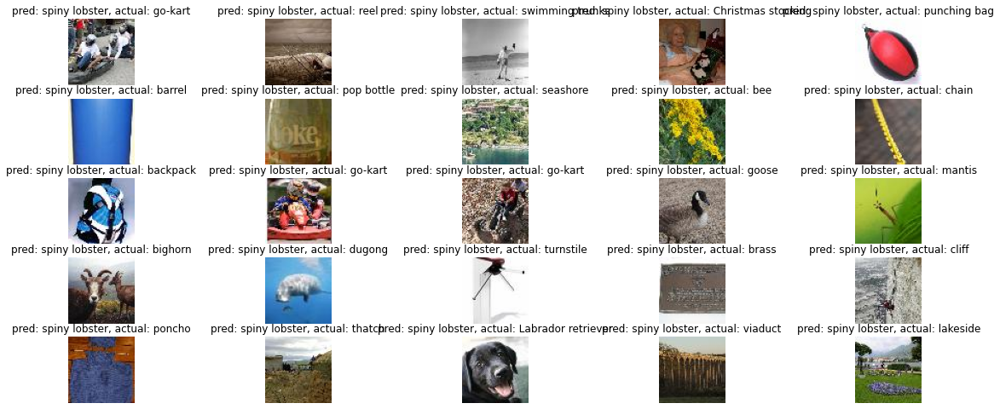

Thu Oct 29 00:40:29 2020 Train Epoch: 0 [0/100000 (0%)]	Loss: 5.300362
Thu Oct 29 00:40:36 2020 Train Epoch: 0 [25600/100000 (26%)]	Loss: 4.660216
Thu Oct 29 00:40:43 2020 Train Epoch: 0 [51200/100000 (51%)]	Loss: 4.498172
Thu Oct 29 00:40:51 2020 Train Epoch: 0 [76800/100000 (77%)]	Loss: 4.298334

Train set: Average loss: 4.5892, Accuracy: 7620/100000 (8%)


Test set: Average loss: 4.2776, Accuracy: 839/8000 (10%)

Saved /gdrive/My Drive/colab_files/hw1/tiny_imagenet/logs/0.3/000.pt

Thu Oct 29 00:41:03 2020 Train Epoch: 1 [0/100000 (0%)]	Loss: 4.160437
Thu Oct 29 00:41:10 2020 Train Epoch: 1 [25600/100000 (26%)]	Loss: 4.157907
Thu Oct 29 00:41:17 2020 Train Epoch: 1 [51200/100000 (51%)]	Loss: 4.191007
Thu Oct 29 00:41:24 2020 Train Epoch: 1 [76800/100000 (77%)]	Loss: 3.984170

Train set: Average loss: 4.1140, Accuracy: 13143/100000 (13%)


Test set: Average loss: 4.2286, Accuracy: 953/8000 (12%)

Saved /gdrive/My Drive/colab_files/hw1/tiny_imagenet/logs/0.3/001.pt

Thu Oct 29 00:41:3

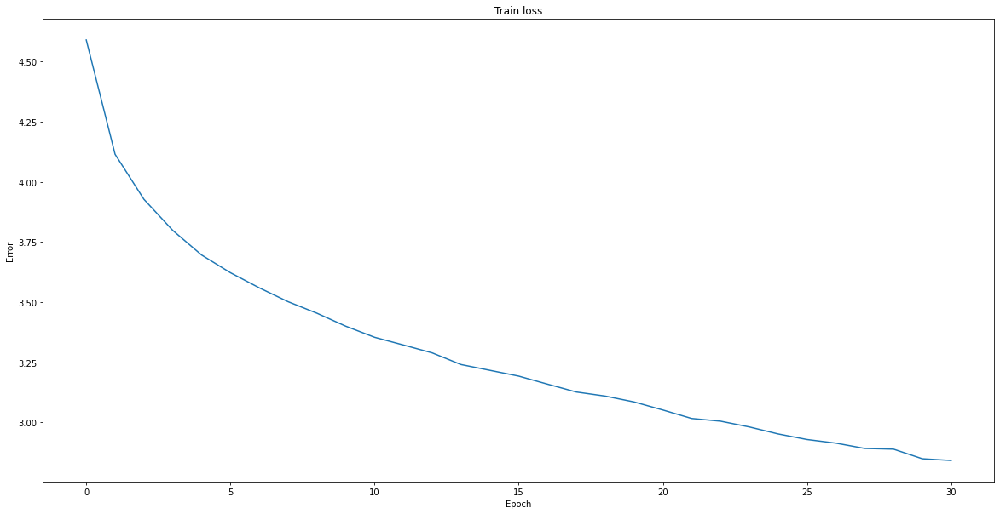

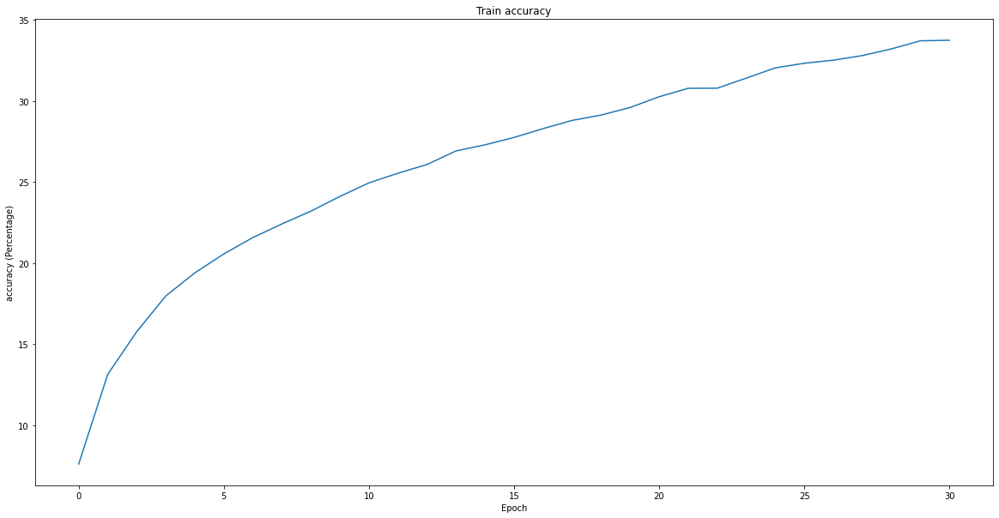

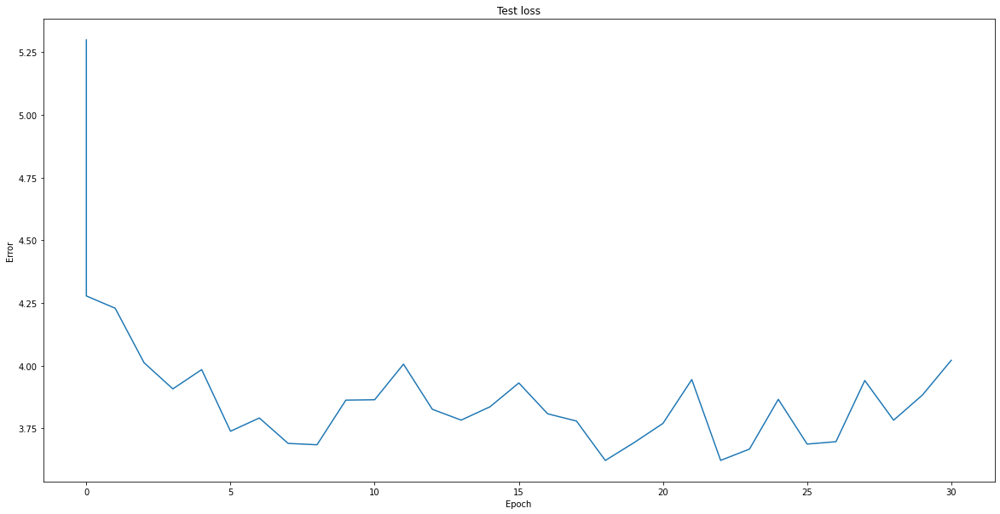

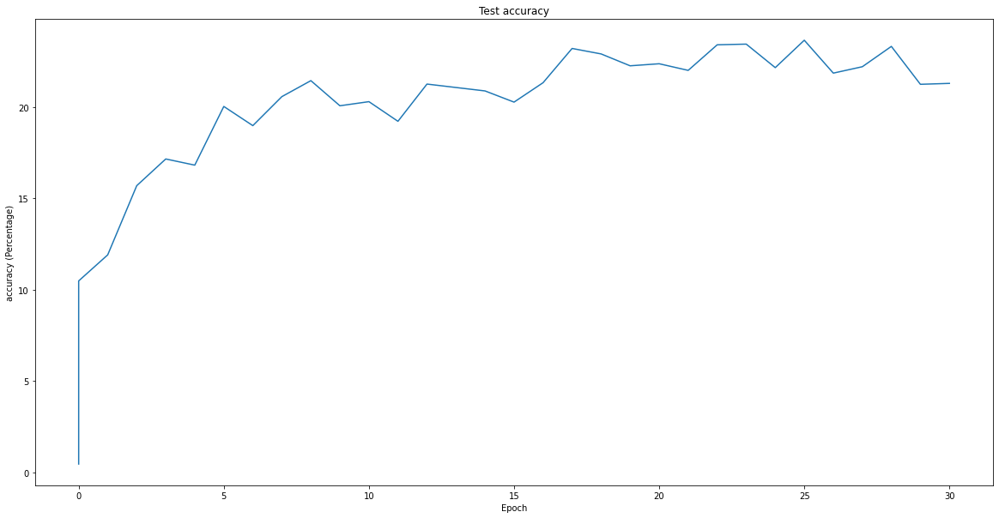

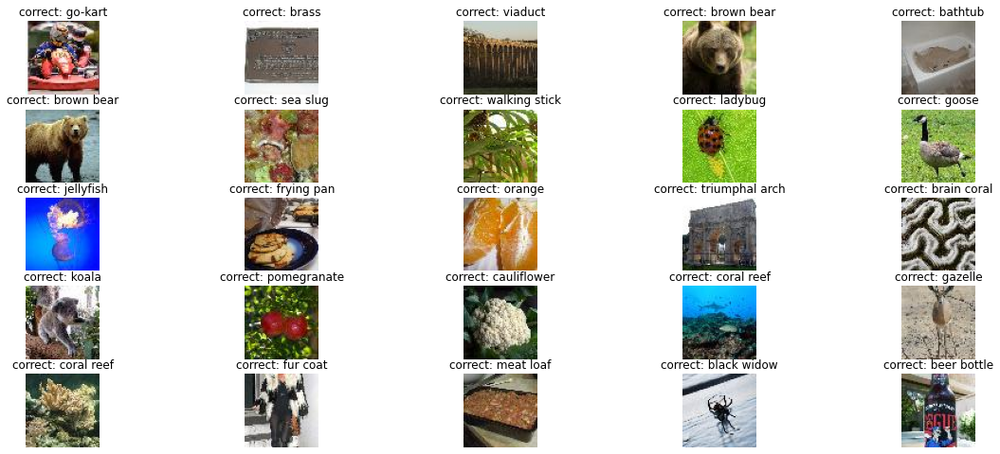

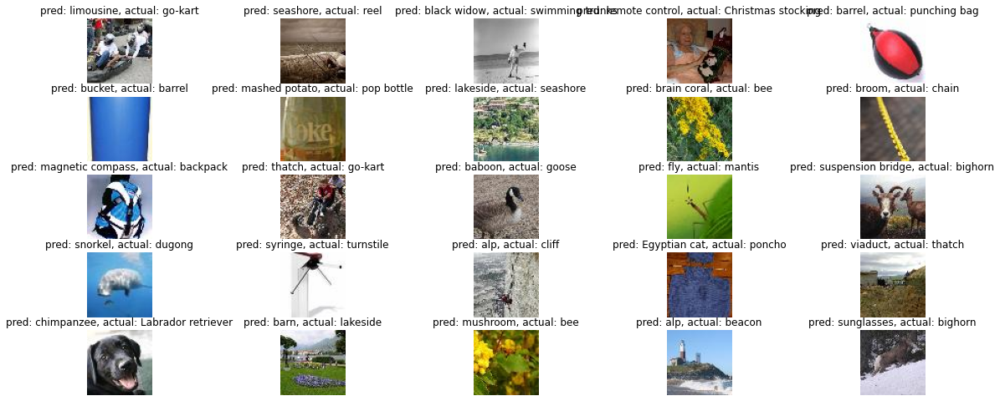

In [ ]:
#KMARATHE  

# Trying higher learning rate with dropout
# decresed weight decay
# lesser number of layers
class TinyImagenetNet_3(nn.Module):
    def __init__(self):
        super(TinyImagenetNet_3, self).__init__()
        # TODO define the layers
        self.conv1 = nn.Conv2d(in_channels = 3, out_channels = 32, kernel_size = 3, stride=1, padding=1) 
        self.conv2 = nn.Conv2d(in_channels = 32, out_channels = 64, kernel_size = 3, stride=1, padding=1) 
        
        self.maxpool = nn.MaxPool2d(2, stride=2)
        self.LeakyReLU = nn.LeakyReLU(0.1)
        self.dropout = nn.Dropout(0.1)

        self.conv1_bn = nn.BatchNorm2d(num_features = 32)
        self.conv2_bn = nn.BatchNorm2d(num_features  = 64)

        self.fc1 = nn.Linear(in_features = 16384, out_features = 2048)
        self.fc2 = nn.Linear(in_features = 2048, out_features  = 200)
        self.accuracy = None
        
        #raise NotImplementedError('Need to define the layers for your network')

    def forward(self, x):
        # TODO define the forward pass
        #raise NotImplementedError('Need to define the forward pass')
        x = self.conv1_bn(self.conv1(x)) #output 32 64x64
        x = self.LeakyReLU(x)
        x = self.maxpool(x) #output 32 32x32
        
        x = self.dropout(x)

        x = self.conv2_bn(self.conv2(x)) #output 64 32x32
        x = self.LeakyReLU(x)
        x = self.maxpool(x) #output 64 16x16

        x = self.dropout(x)

 
        x = torch.flatten(x, 1)
        x = self.fc1(x)
        x = self.LeakyReLU(x)
        x = self.fc2(x)
        
        return x
  

    def loss(self, prediction, label, reduction='mean'):
        loss_val = F.cross_entropy(prediction, label.squeeze(), reduction=reduction)
        return loss_val

    def save_model(self, file_path, num_to_keep=1):
        pt_util.save(self, file_path, num_to_keep)
        
    def save_best_model(self, accuracy, file_path, num_to_keep=1):
        if self.accuracy == None or accuracy > self.accuracy:
            self.accuracy = accuracy
            self.save_model(file_path, num_to_keep)

    def load_model(self, file_path):
        pt_util.restore(self, file_path)

    def load_last_model(self, dir_path):
        return pt_util.restore_latest(self, dir_path)










# Play around with these constants, you may find a better setting.
BATCH_SIZE = 256
TEST_BATCH_SIZE = 10
EPOCHS = 30
LEARNING_RATE = 0.1
MOMENTUM = 0.9
USE_CUDA = True
SEED = 0
PRINT_INTERVAL = 100
WEIGHT_DECAY = 0.0001

EXPERIMENT_VERSION = "0.3" # increment this to start a new experiment
LOG_PATH = DATA_PATH + 'logs/' + EXPERIMENT_VERSION + '/'

# Now the actual training code
use_cuda = USE_CUDA and torch.cuda.is_available()

torch.manual_seed(SEED)

device = torch.device("cuda" if use_cuda else "cpu")
print('Using device', device)
import multiprocessing
print('num cpus:', multiprocessing.cpu_count())

kwargs = {'num_workers': multiprocessing.cpu_count(),
          'pin_memory': True} if use_cuda else {}

class_names = [line.strip().split(', ') for line in open(DATA_PATH + 'class_names.txt')]
name_to_class = {line[1]: line[0] for line in class_names}
class_names = [line[1] for line in class_names]

train_loader = torch.utils.data.DataLoader(data_train, batch_size=BATCH_SIZE,
                                           shuffle=True, **kwargs)
test_loader = torch.utils.data.DataLoader(data_test, batch_size=TEST_BATCH_SIZE,
                                          shuffle=False, **kwargs)

model = TinyImagenetNet_3().to(device)
optimizer = optim.SGD(model.parameters(), lr=LEARNING_RATE, momentum=MOMENTUM, weight_decay=WEIGHT_DECAY)
start_epoch = model.load_last_model(LOG_PATH)

train_losses, train_accuracies, test_losses, test_accuracies = pt_util.read_log(LOG_PATH + 'log.pkl', ([], [], [], [] ))
test_loss, test_accuracy, correct_images, correct_val, error_images, predicted_val, gt_val = test(model, device, test_loader, True)

correct_images = pt_util.to_scaled_uint8(correct_images.transpose(0, 2, 3, 1))
error_images = pt_util.to_scaled_uint8(error_images.transpose(0, 2, 3, 1))
pt_util.show_images(correct_images, ['correct: %s' % class_names[aa] for aa in correct_val])
pt_util.show_images(error_images, ['pred: %s, actual: %s' % (class_names[aa], class_names[bb]) for aa, bb in zip(predicted_val, gt_val)])

test_losses.append((start_epoch, test_loss))
test_accuracies.append((start_epoch, test_accuracy))

try:
    for epoch in range(start_epoch, EPOCHS + 1):
        train_loss, train_accuracy = train(model, device, train_loader, optimizer, epoch, PRINT_INTERVAL)
        test_loss, test_accuracy, correct_images, correct_val, error_images, predicted_val, gt_val = test(model, device, test_loader, True)
        train_losses.append((epoch, train_loss))
        train_accuracies.append((epoch, train_accuracy))
        test_losses.append((epoch, test_loss))
        test_accuracies.append((epoch, test_accuracy))
        pt_util.write_log(LOG_PATH + '.pkl', (train_losses, test_losses, test_accuracies))
        model.save_best_model(test_accuracy, LOG_PATH + '%03d.pt' % epoch)


except KeyboardInterrupt as ke:
    print('Interrupted')
except:
    import traceback
    traceback.print_exc()
finally:
    model.save_model(LOG_PATH + '%03d.pt' % epoch, 0)
    ep, val = zip(*train_losses)
    pt_util.plot(ep, val, 'Train loss', 'Epoch', 'Error')
    ep, val = zip(*train_accuracies)
    pt_util.plot(ep, val, 'Train accuracy', 'Epoch', 'accuracy (Percentage)')
    ep, val = zip(*test_losses)
    pt_util.plot(ep, val, 'Test loss', 'Epoch', 'Error')
    ep, val = zip(*test_accuracies)
    pt_util.plot(ep, val, 'Test accuracy', 'Epoch', 'accuracy (Percentage)')
    correct_images = pt_util.to_scaled_uint8(correct_images.transpose(0, 2, 3, 1))
    error_images = pt_util.to_scaled_uint8(error_images.transpose(0, 2, 3, 1))
    pt_util.show_images(correct_images, ['correct: %s' % class_names[aa] for aa in correct_val])
    pt_util.show_images(error_images, ['pred: %s, actual: %s' % (class_names[aa], class_names[bb]) for aa, bb in zip(predicted_val, gt_val)])













Using device cuda
num cpus: 2

Test set: Average loss: 5.2985, Accuracy: 41/8000 (1%)



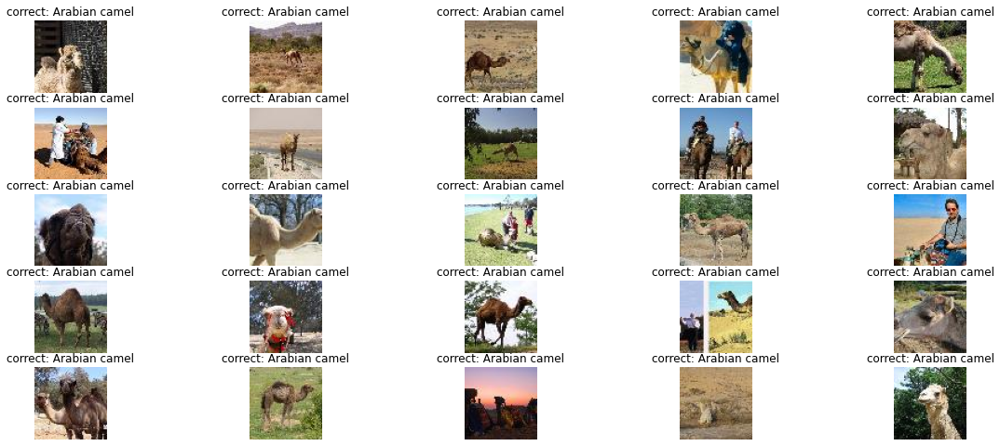

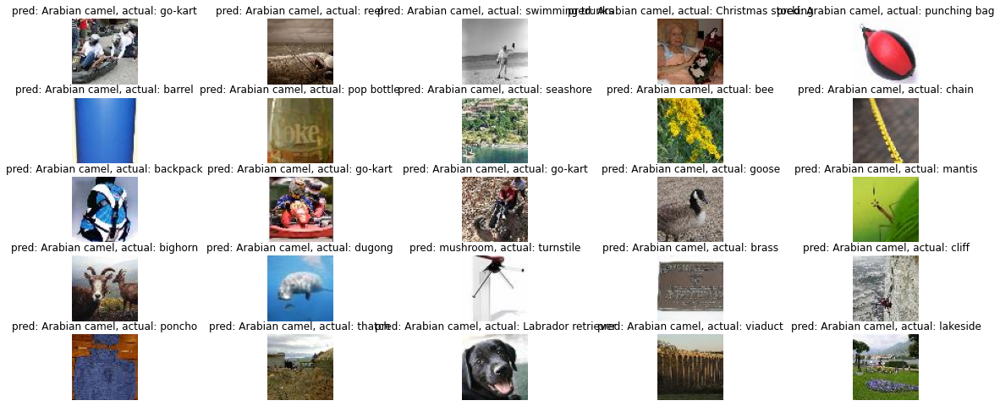

Thu Oct 29 01:00:23 2020 Train Epoch: 0 [0/100000 (0%)]	Loss: 5.338101
Thu Oct 29 01:00:37 2020 Train Epoch: 0 [51200/100000 (51%)]	Loss: 4.490136

Train set: Average loss: 4.5945, Accuracy: 7134/100000 (7%)


Test set: Average loss: 4.3095, Accuracy: 814/8000 (10%)

Saved /gdrive/My Drive/colab_files/hw1/tiny_imagenet/logs/0.4/000.pt

Thu Oct 29 01:00:56 2020 Train Epoch: 1 [0/100000 (0%)]	Loss: 4.111268
Thu Oct 29 01:01:12 2020 Train Epoch: 1 [51200/100000 (51%)]	Loss: 3.917181

Train set: Average loss: 3.9734, Accuracy: 14609/100000 (15%)


Test set: Average loss: 3.8678, Accuracy: 1254/8000 (16%)

Saved /gdrive/My Drive/colab_files/hw1/tiny_imagenet/logs/0.4/001.pt

Thu Oct 29 01:01:31 2020 Train Epoch: 2 [0/100000 (0%)]	Loss: 3.687399
Thu Oct 29 01:01:45 2020 Train Epoch: 2 [51200/100000 (51%)]	Loss: 3.814781

Train set: Average loss: 3.6930, Accuracy: 18729/100000 (19%)


Test set: Average loss: 3.7178, Accuracy: 1460/8000 (18%)

Saved /gdrive/My Drive/colab_files/hw1/tiny_imagen

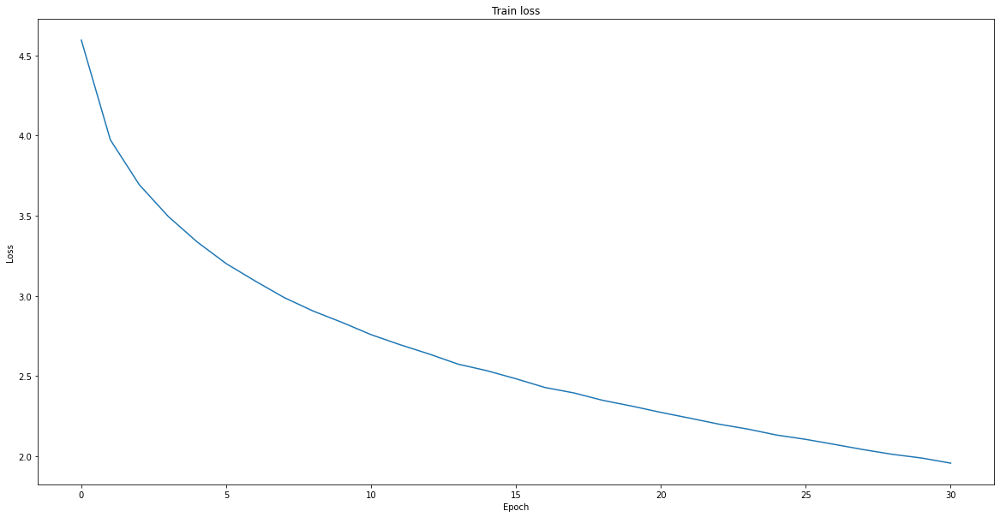

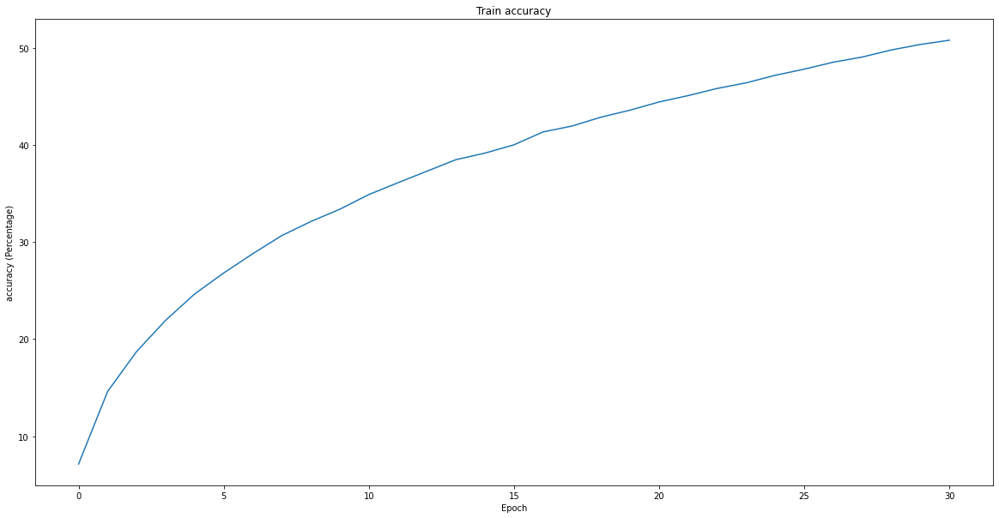

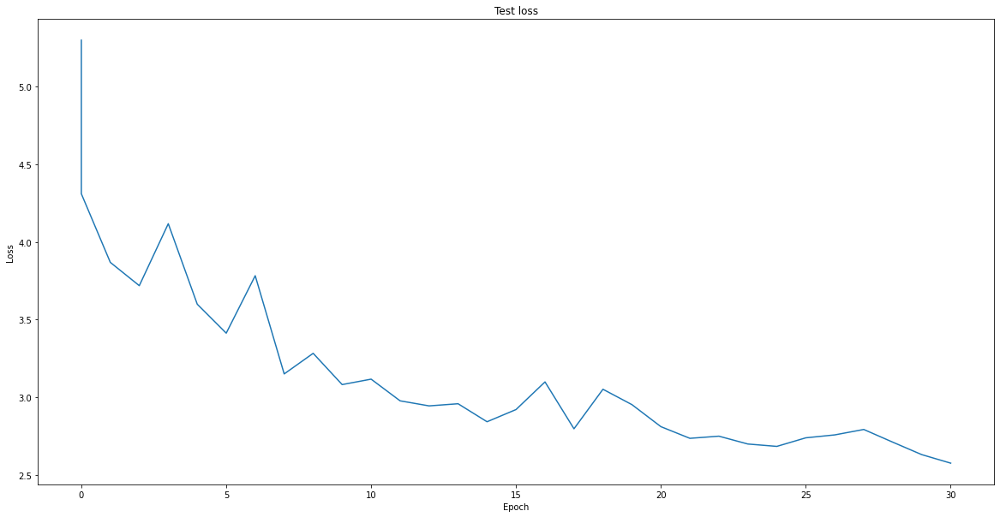

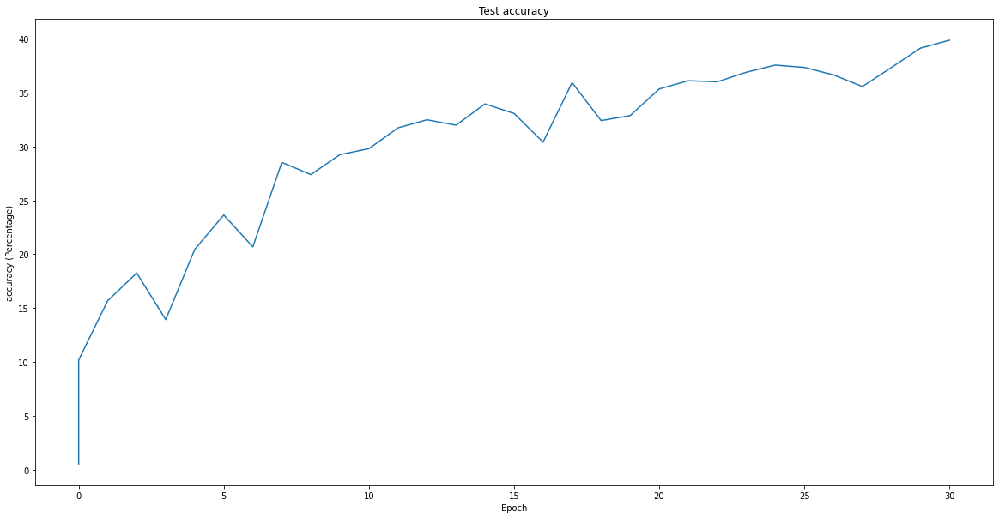

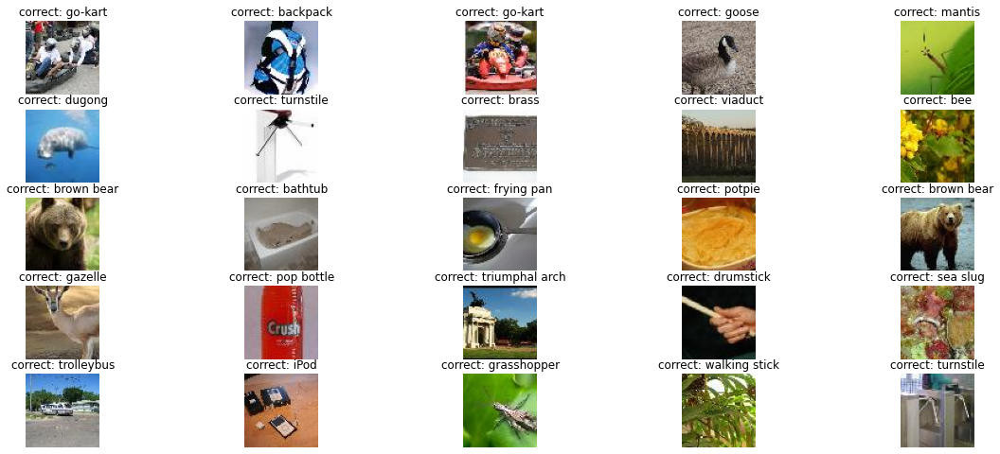

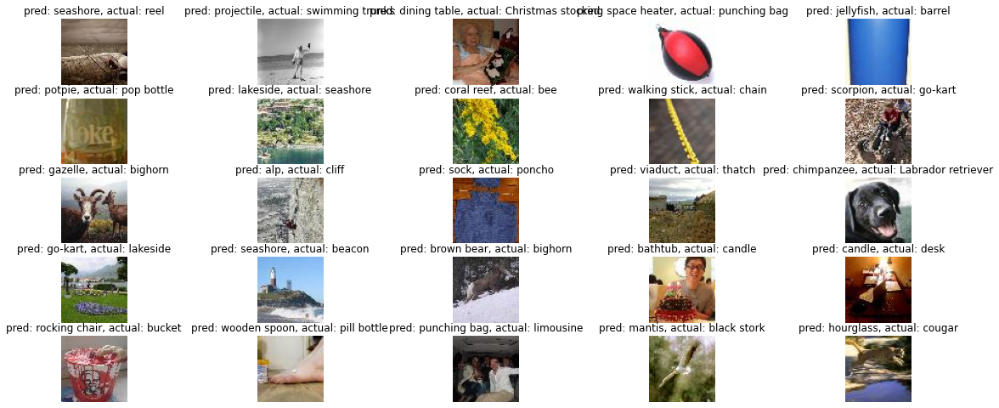

In [ ]:

#KMARATHE 
# Using deeper network
class TinyImagenetNet_4(nn.Module):
    def __init__(self):
        super(TinyImagenetNet_4, self).__init__()
        # TODO define the layers
        self.conv1 = nn.Conv2d(in_channels = 3, out_channels = 32, kernel_size = 3, stride=1, padding=1) 
        self.conv2 = nn.Conv2d(in_channels = 32, out_channels = 64, kernel_size = 3, stride=1, padding=1) 
        self.conv3 = nn.Conv2d(in_channels = 64, out_channels = 128, kernel_size = 3, stride=1, padding=1)
        self.conv4 = nn.Conv2d(in_channels = 128, out_channels = 256, kernel_size = 3, stride=1, padding=1)
        self.conv5 = nn.Conv2d(in_channels = 256, out_channels = 512, kernel_size = 3, stride=1, padding=1)

 
        
        self.maxpool = nn.MaxPool2d(2, stride=2)

        self.conv1_bn = nn.BatchNorm2d(num_features = 32)
        self.conv2_bn = nn.BatchNorm2d(num_features  = 64)
        self.conv3_bn = nn.BatchNorm2d(num_features  = 128)
        self.conv4_bn = nn.BatchNorm2d(num_features  = 256)
        self.conv5_bn = nn.BatchNorm2d(num_features  = 512)
        

        self.fc1 = nn.Linear(in_features = 2048, out_features = 1024)
        self.fc2 = nn.Linear(in_features = 1024, out_features  = 200)
        self.accuracy = None
        
        #raise NotImplementedError('Need to define the layers for your network')

    def forward(self, x):
        # TODO define the forward pass
        #raise NotImplementedError('Need to define the forward pass')
        x = self.conv1_bn(self.conv1(x)) #output 32 64x64
        x = F.relu(x)
        x = self.maxpool(x) #output 32 32x32
        #x = F.dropout(x, p=0.5, training=self.training)
        
        x = self.conv2_bn(self.conv2(x)) #output 64 32x32
        x = F.relu(x)
        x = self.maxpool(x) #output 64 16x16
        #x = F.dropout(x, p=0.5, training=self.training)

        x = self.conv3_bn(self.conv3(x)) #output 128 16x16
        x = F.relu(x)
        x = self.maxpool(x) #output 128 8x8
        #x = F.dropout(x, p=0.5, training=self.training)


        x = self.conv4_bn(self.conv4(x)) #output 256 8x8
        x = F.relu(x)
        x = self.maxpool(x) #output 256 4x4
        #x = F.dropout(x, p=0.5, training=self.training)


        x = self.conv5_bn(self.conv5(x)) #output 512 4x4
        x = F.relu(x)
        x = self.maxpool(x) #output 512 2x2
        #x = F.dropout(x, p=0.5, training=self.training)
 
 
       
        x = torch.flatten(x, 1)
        x = self.fc1(x)
        x = F.relu(x)
        x = self.fc2(x)
        return x
  

    def loss(self, prediction, label, reduction='mean'):
        loss_val = F.cross_entropy(prediction, label.squeeze(), reduction=reduction)
        return loss_val

    def save_model(self, file_path, num_to_keep=1):
        pt_util.save(self, file_path, num_to_keep)
        
    def save_best_model(self, accuracy, file_path, num_to_keep=1):
        if self.accuracy == None or accuracy > self.accuracy:
            self.accuracy = accuracy
            self.save_model(file_path, num_to_keep)

    def load_model(self, file_path):
        pt_util.restore(self, file_path)

    def load_last_model(self, dir_path):
        return pt_util.restore_latest(self, dir_path)










# Play around with these constants, you may find a better setting.
BATCH_SIZE = 512
TEST_BATCH_SIZE = 10
EPOCHS = 30
LEARNING_RATE = 0.02
MOMENTUM = 0.9
USE_CUDA = True
SEED = 0
PRINT_INTERVAL = 100
WEIGHT_DECAY = 0.0005

EXPERIMENT_VERSION = "0.4" # increment this to start a new experiment
LOG_PATH = DATA_PATH + 'logs/' + EXPERIMENT_VERSION + '/'

# Now the actual training code
use_cuda = USE_CUDA and torch.cuda.is_available()

torch.manual_seed(SEED)

device = torch.device("cuda" if use_cuda else "cpu")
print('Using device', device)
import multiprocessing
print('num cpus:', multiprocessing.cpu_count())

kwargs = {'num_workers': multiprocessing.cpu_count(),
          'pin_memory': True} if use_cuda else {}

class_names = [line.strip().split(', ') for line in open(DATA_PATH + 'class_names.txt')]
name_to_class = {line[1]: line[0] for line in class_names}
class_names = [line[1] for line in class_names]

train_loader = torch.utils.data.DataLoader(data_train, batch_size=BATCH_SIZE,
                                           shuffle=True, **kwargs)
test_loader = torch.utils.data.DataLoader(data_test, batch_size=TEST_BATCH_SIZE,
                                          shuffle=False, **kwargs)

model = TinyImagenetNet_4().to(device)
optimizer = optim.SGD(model.parameters(), lr=LEARNING_RATE, momentum=MOMENTUM, weight_decay=WEIGHT_DECAY)
start_epoch = model.load_last_model(LOG_PATH)

train_losses, train_accuracies, test_losses, test_accuracies = pt_util.read_log(LOG_PATH + 'log.pkl', ([], [], [], [] ))
test_loss, test_accuracy, correct_images, correct_val, error_images, predicted_val, gt_val = test(model, device, test_loader, True)

correct_images = pt_util.to_scaled_uint8(correct_images.transpose(0, 2, 3, 1))
error_images = pt_util.to_scaled_uint8(error_images.transpose(0, 2, 3, 1))
pt_util.show_images(correct_images, ['correct: %s' % class_names[aa] for aa in correct_val])
pt_util.show_images(error_images, ['pred: %s, actual: %s' % (class_names[aa], class_names[bb]) for aa, bb in zip(predicted_val, gt_val)])

test_losses.append((start_epoch, test_loss))
test_accuracies.append((start_epoch, test_accuracy))

try:
    for epoch in range(start_epoch, EPOCHS + 1):
        train_loss, train_accuracy = train(model, device, train_loader, optimizer, epoch, PRINT_INTERVAL)
        test_loss, test_accuracy, correct_images, correct_val, error_images, predicted_val, gt_val = test(model, device, test_loader, True)
        train_losses.append((epoch, train_loss))
        train_accuracies.append((epoch, train_accuracy))
        test_losses.append((epoch, test_loss))
        test_accuracies.append((epoch, test_accuracy))
        pt_util.write_log(LOG_PATH + '.pkl', (train_losses, test_losses, test_accuracies))
        model.save_best_model(test_accuracy, LOG_PATH + '%03d.pt' % epoch)


except KeyboardInterrupt as ke:
    print('Interrupted')
except:
    import traceback
    traceback.print_exc()
finally:
    model.save_model(LOG_PATH + '%03d.pt' % epoch, 0)
    ep, val = zip(*train_losses)
    pt_util.plot(ep, val, 'Train loss', 'Epoch', 'Loss')
    ep, val = zip(*train_accuracies)
    pt_util.plot(ep, val, 'Train accuracy', 'Epoch', 'accuracy (Percentage)')
    ep, val = zip(*test_losses)
    pt_util.plot(ep, val, 'Test loss', 'Epoch', 'Loss')
    ep, val = zip(*test_accuracies)
    pt_util.plot(ep, val, 'Test accuracy', 'Epoch', 'accuracy (Percentage)')
    correct_images = pt_util.to_scaled_uint8(correct_images.transpose(0, 2, 3, 1))
    error_images = pt_util.to_scaled_uint8(error_images.transpose(0, 2, 3, 1))
    pt_util.show_images(correct_images, ['correct: %s' % class_names[aa] for aa in correct_val])
    pt_util.show_images(error_images, ['pred: %s, actual: %s' % (class_names[aa], class_names[bb]) for aa, bb in zip(predicted_val, gt_val)])





Using device cuda
num cpus: 2

Test set: Average loss: 5.2984, Accuracy: 40/8000 (0%)



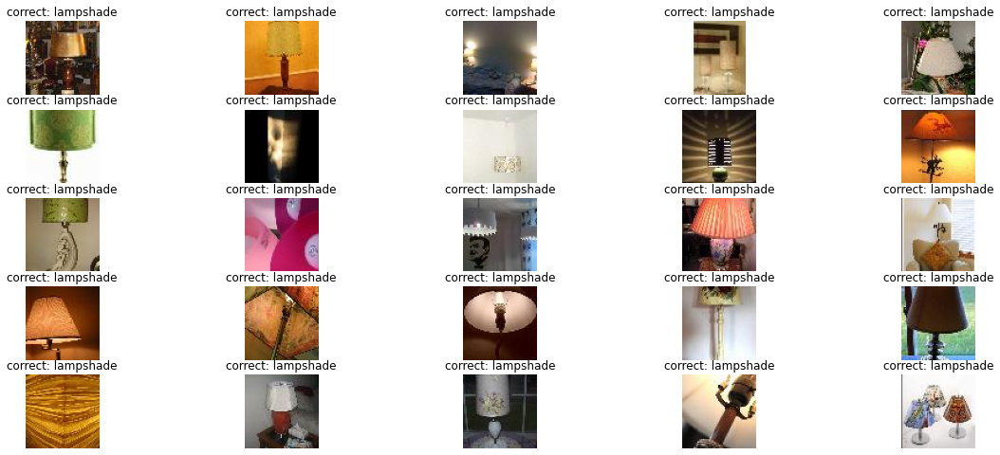

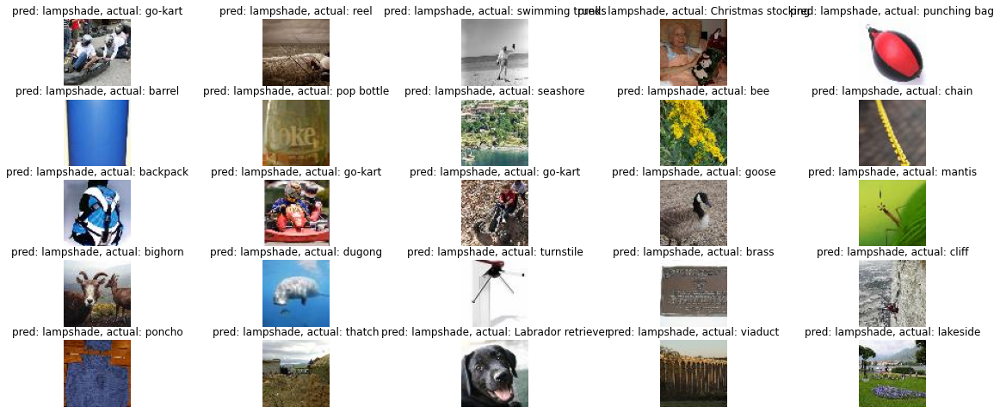

Thu Oct 29 02:35:04 2020 Train Epoch: 0 [0/100000 (0%)]	Loss: 5.324025
Thu Oct 29 02:35:21 2020 Train Epoch: 0 [51200/100000 (51%)]	Loss: 4.482134

Train set: Average loss: 4.5911, Accuracy: 6869/100000 (7%)


Test set: Average loss: 4.4438, Accuracy: 680/8000 (8%)

Saved /gdrive/My Drive/colab_files/hw1/tiny_imagenet/logs/0.4/000.pt

Thu Oct 29 02:35:44 2020 Train Epoch: 1 [0/100000 (0%)]	Loss: 4.187562
Thu Oct 29 02:36:01 2020 Train Epoch: 1 [51200/100000 (51%)]	Loss: 3.839451

Train set: Average loss: 3.9721, Accuracy: 14257/100000 (14%)


Test set: Average loss: 4.3957, Accuracy: 853/8000 (11%)

Saved /gdrive/My Drive/colab_files/hw1/tiny_imagenet/logs/0.4/001.pt

Thu Oct 29 02:36:22 2020 Train Epoch: 2 [0/100000 (0%)]	Loss: 3.841877
Thu Oct 29 02:36:39 2020 Train Epoch: 2 [51200/100000 (51%)]	Loss: 3.855955

Train set: Average loss: 3.6979, Accuracy: 18525/100000 (19%)


Test set: Average loss: 3.9561, Accuracy: 1267/8000 (16%)

Saved /gdrive/My Drive/colab_files/hw1/tiny_imagenet

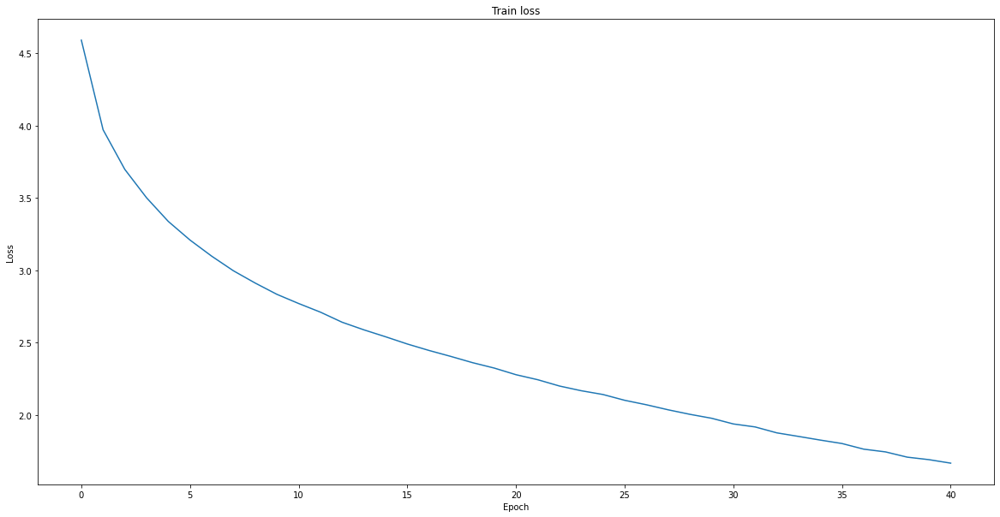

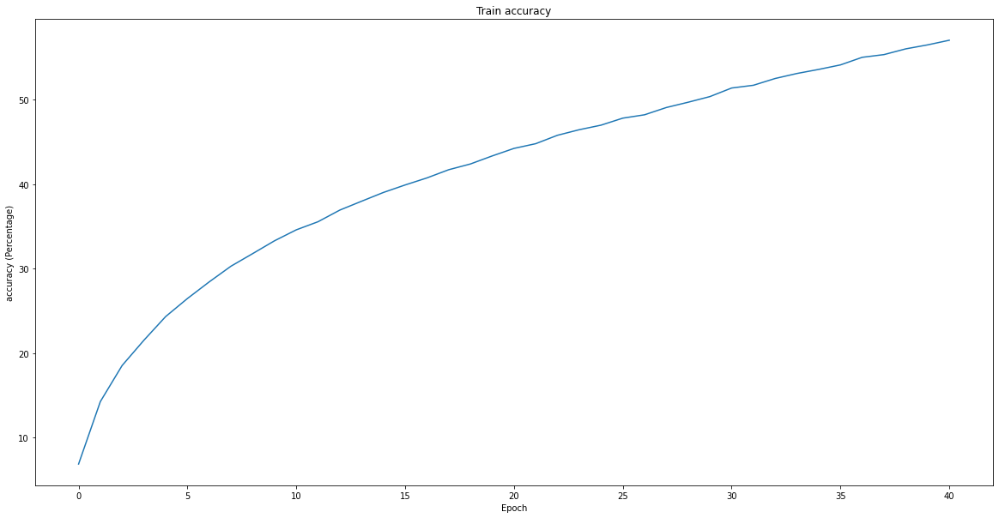

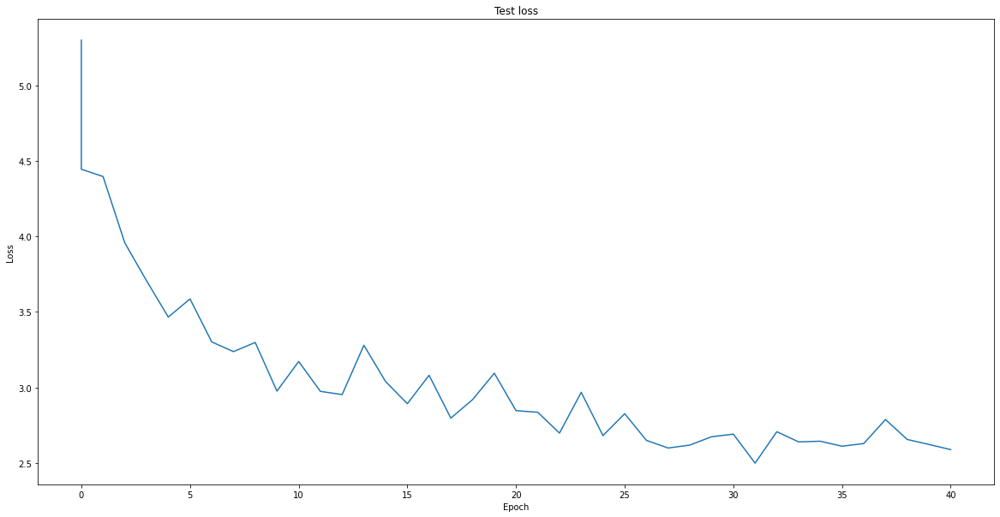

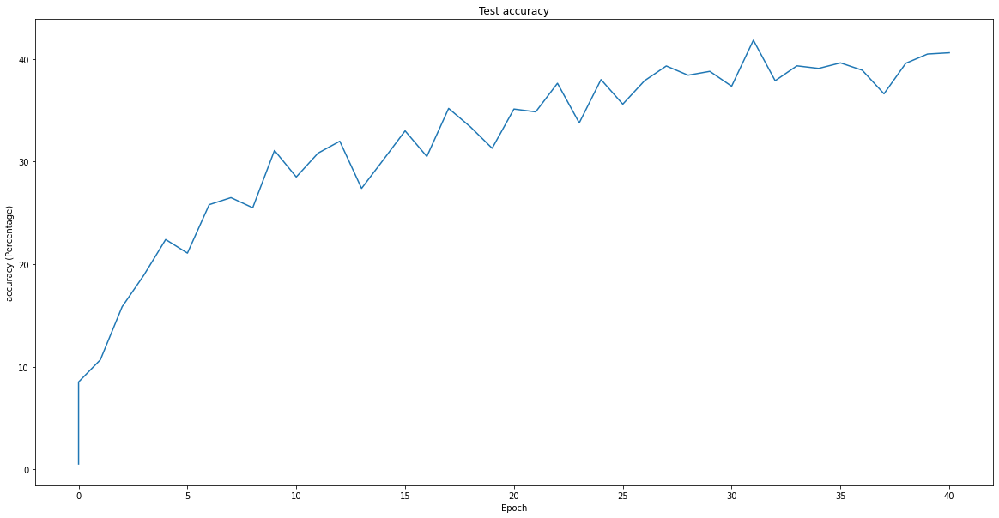

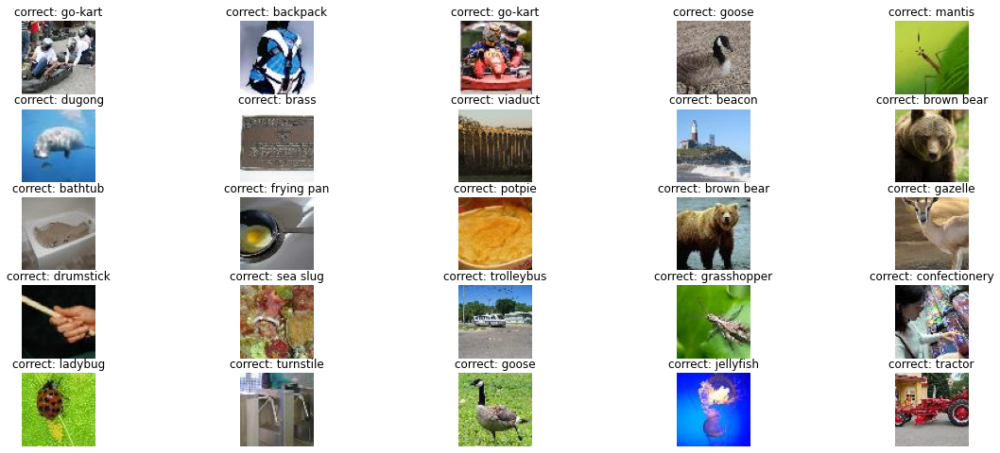

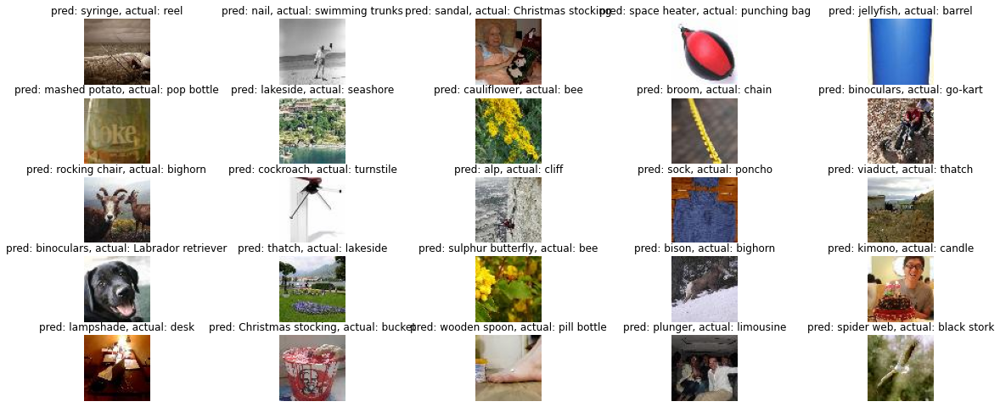

In [ ]:

#KMARATHE 
# Using deeper network
class TinyImagenetNet_4(nn.Module):
    def __init__(self):
        super(TinyImagenetNet_4, self).__init__()
        # TODO define the layers
        self.conv1 = nn.Conv2d(in_channels = 3, out_channels = 32, kernel_size = 3, stride=1, padding=1) 
        self.conv2 = nn.Conv2d(in_channels = 32, out_channels = 64, kernel_size = 3, stride=1, padding=1) 
        self.conv3 = nn.Conv2d(in_channels = 64, out_channels = 128, kernel_size = 3, stride=1, padding=1)
        self.conv4 = nn.Conv2d(in_channels = 128, out_channels = 256, kernel_size = 3, stride=1, padding=1)
        self.conv5 = nn.Conv2d(in_channels = 256, out_channels = 512, kernel_size = 3, stride=1, padding=1)
        self.conv6 = nn.Conv2d(in_channels = 512, out_channels = 1024, kernel_size = 3, stride=1, padding=1)


 
        
        self.maxpool = nn.MaxPool2d(2, stride=2)
        #self.dropout = nn.Dropout2d(p =0.1)

        self.conv1_bn = nn.BatchNorm2d(num_features = 32)
        self.conv2_bn = nn.BatchNorm2d(num_features  = 64)
        self.conv3_bn = nn.BatchNorm2d(num_features  = 128)
        self.conv4_bn = nn.BatchNorm2d(num_features  = 256)
        self.conv5_bn = nn.BatchNorm2d(num_features  = 512)
        self.conv6_bn = nn.BatchNorm2d(num_features  = 1024)
        

        self.fc1 = nn.Linear(in_features = 1024, out_features = 512)
        self.fc2 = nn.Linear(in_features = 512, out_features  = 200)
        self.accuracy = None
        
        #raise NotImplementedError('Need to define the layers for your network')

    def forward(self, x):
        # TODO define the forward pass
        #raise NotImplementedError('Need to define the forward pass')
        x = self.conv1_bn(self.conv1(x)) #output 32 64x64
        x = F.relu(x)
        x = self.maxpool(x) #output 32 32x32
        #x = self.dropout(x)
        
        x = self.conv2_bn(self.conv2(x)) #output 64 32x32
        x = F.relu(x)
        x = self.maxpool(x) #output 64 16x16
        #x = self.dropout(x)

        x = self.conv3_bn(self.conv3(x)) #output 128 16x16
        x = F.relu(x)
        x = self.maxpool(x) #output 128 8x8
        #x = self.dropout(x)


        x = self.conv4_bn(self.conv4(x)) #output 256 8x8
        x = F.relu(x)
        x = self.maxpool(x) #output 256 4x4
        #x = self.dropout(x)


        x = self.conv5_bn(self.conv5(x)) #output 512 4x4
        x = F.relu(x)
        x = self.maxpool(x) #output 512 2x2
        #x = self.dropout(x)


        x = self.conv6_bn(self.conv6(x)) #output 1024 2x2
        x = F.relu(x)
        x = self.maxpool(x) #output 1024 1x1
        #x = self.dropout(x)

       
        x = torch.flatten(x, 1)
        x = self.fc1(x)
        x = F.relu(x)
        x = self.fc2(x)
        return x
  

    def loss(self, prediction, label, reduction='mean'):
        loss_val = F.cross_entropy(prediction, label.squeeze(), reduction=reduction)
        return loss_val

    def save_model(self, file_path, num_to_keep=1):
        pt_util.save(self, file_path, num_to_keep)
        
    def save_best_model(self, accuracy, file_path, num_to_keep=1):
        if self.accuracy == None or accuracy > self.accuracy:
            self.accuracy = accuracy
            self.save_model(file_path, num_to_keep)

    def load_model(self, file_path):
        pt_util.restore(self, file_path)

    def load_last_model(self, dir_path):
        return pt_util.restore_latest(self, dir_path)










# Play around with these constants, you may find a better setting.
BATCH_SIZE = 512
TEST_BATCH_SIZE = 10
EPOCHS = 40
LEARNING_RATE = 0.02
MOMENTUM = 0.9
USE_CUDA = True
SEED = 0
PRINT_INTERVAL = 100
WEIGHT_DECAY = 0.0005

EXPERIMENT_VERSION = "0.4" # increment this to start a new experiment
LOG_PATH = DATA_PATH + 'logs/' + EXPERIMENT_VERSION + '/'

# Now the actual training code
use_cuda = USE_CUDA and torch.cuda.is_available()

torch.manual_seed(SEED)

device = torch.device("cuda" if use_cuda else "cpu")
print('Using device', device)
import multiprocessing
print('num cpus:', multiprocessing.cpu_count())

kwargs = {'num_workers': multiprocessing.cpu_count(),
          'pin_memory': True} if use_cuda else {}

class_names = [line.strip().split(', ') for line in open(DATA_PATH + 'class_names.txt')]
name_to_class = {line[1]: line[0] for line in class_names}
class_names = [line[1] for line in class_names]

train_loader = torch.utils.data.DataLoader(data_train, batch_size=BATCH_SIZE,
                                           shuffle=True, **kwargs)
test_loader = torch.utils.data.DataLoader(data_test, batch_size=TEST_BATCH_SIZE,
                                          shuffle=False, **kwargs)

model = TinyImagenetNet_4().to(device)
optimizer = optim.SGD(model.parameters(), lr=LEARNING_RATE, momentum=MOMENTUM, weight_decay=WEIGHT_DECAY)
start_epoch = model.load_last_model(LOG_PATH)

train_losses, train_accuracies, test_losses, test_accuracies = pt_util.read_log(LOG_PATH + 'log.pkl', ([], [], [], [] ))
test_loss, test_accuracy, correct_images, correct_val, error_images, predicted_val, gt_val = test(model, device, test_loader, True)

correct_images = pt_util.to_scaled_uint8(correct_images.transpose(0, 2, 3, 1))
error_images = pt_util.to_scaled_uint8(error_images.transpose(0, 2, 3, 1))
pt_util.show_images(correct_images, ['correct: %s' % class_names[aa] for aa in correct_val])
pt_util.show_images(error_images, ['pred: %s, actual: %s' % (class_names[aa], class_names[bb]) for aa, bb in zip(predicted_val, gt_val)])

test_losses.append((start_epoch, test_loss))
test_accuracies.append((start_epoch, test_accuracy))

try:
    for epoch in range(start_epoch, EPOCHS + 1):
        train_loss, train_accuracy = train(model, device, train_loader, optimizer, epoch, PRINT_INTERVAL)
        test_loss, test_accuracy, correct_images, correct_val, error_images, predicted_val, gt_val = test(model, device, test_loader, True)
        train_losses.append((epoch, train_loss))
        train_accuracies.append((epoch, train_accuracy))
        test_losses.append((epoch, test_loss))
        test_accuracies.append((epoch, test_accuracy))
        pt_util.write_log(LOG_PATH + '.pkl', (train_losses, test_losses, test_accuracies))
        model.save_best_model(test_accuracy, LOG_PATH + '%03d.pt' % epoch)


except KeyboardInterrupt as ke:
    print('Interrupted')
except:
    import traceback
    traceback.print_exc()
finally:
    model.save_model(LOG_PATH + '%03d.pt' % epoch, 0)
    ep, val = zip(*train_losses)
    pt_util.plot(ep, val, 'Train loss', 'Epoch', 'Loss')
    ep, val = zip(*train_accuracies)
    pt_util.plot(ep, val, 'Train accuracy', 'Epoch', 'accuracy (Percentage)')
    ep, val = zip(*test_losses)
    pt_util.plot(ep, val, 'Test loss', 'Epoch', 'Loss')
    ep, val = zip(*test_accuracies)
    pt_util.plot(ep, val, 'Test accuracy', 'Epoch', 'accuracy (Percentage)')
    correct_images = pt_util.to_scaled_uint8(correct_images.transpose(0, 2, 3, 1))
    error_images = pt_util.to_scaled_uint8(error_images.transpose(0, 2, 3, 1))
    pt_util.show_images(correct_images, ['correct: %s' % class_names[aa] for aa in correct_val])
    pt_util.show_images(error_images, ['pred: %s, actual: %s' % (class_names[aa], class_names[bb]) for aa, bb in zip(predicted_val, gt_val)])





Using device cuda
num cpus: 2
Restoring:
conv1.weight -> 	torch.Size([32, 3, 3, 3]) = 0MB
conv1.bias -> 	torch.Size([32]) = 0MB
conv2.weight -> 	torch.Size([64, 32, 3, 3]) = 0MB
conv2.bias -> 	torch.Size([64]) = 0MB
conv3.weight -> 	torch.Size([128, 64, 3, 3]) = 0MB
conv3.bias -> 	torch.Size([128]) = 0MB
conv4.weight -> 	torch.Size([256, 128, 3, 3]) = 1MB
conv4.bias -> 	torch.Size([256]) = 0MB
conv5.weight -> 	torch.Size([512, 256, 3, 3]) = 4MB
conv5.bias -> 	torch.Size([512]) = 0MB
conv6.weight -> 	torch.Size([1024, 512, 3, 3]) = 18MB
conv6.bias -> 	torch.Size([1024]) = 0MB
conv1_bn.weight -> 	torch.Size([32]) = 0MB
conv1_bn.bias -> 	torch.Size([32]) = 0MB
conv1_bn.running_mean -> 	torch.Size([32]) = 0MB
conv1_bn.running_var -> 	torch.Size([32]) = 0MB
conv1_bn.num_batches_tracked -> 	torch.Size([]) = 0MB
conv2_bn.weight -> 	torch.Size([64]) = 0MB
conv2_bn.bias -> 	torch.Size([64]) = 0MB
conv2_bn.running_mean -> 	torch.Size([64]) = 0MB
conv2_bn.running_var -> 	torch.Size([64]) = 0MB
co

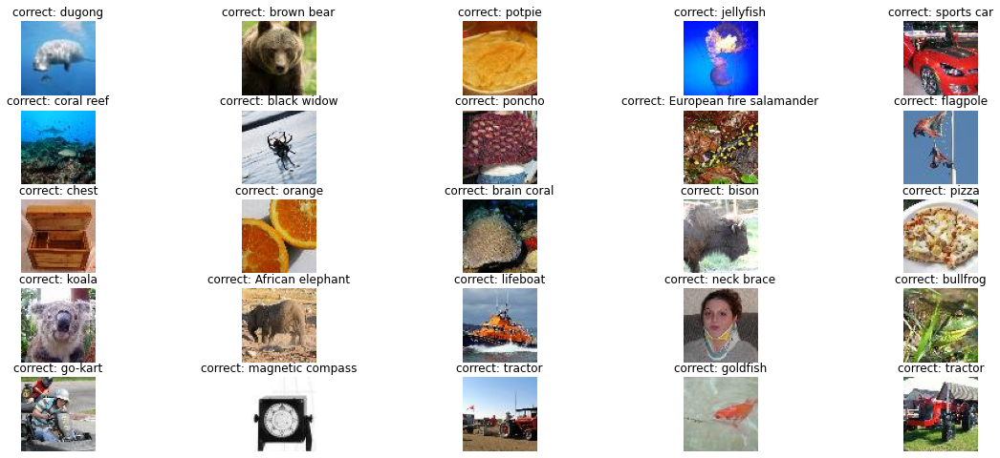

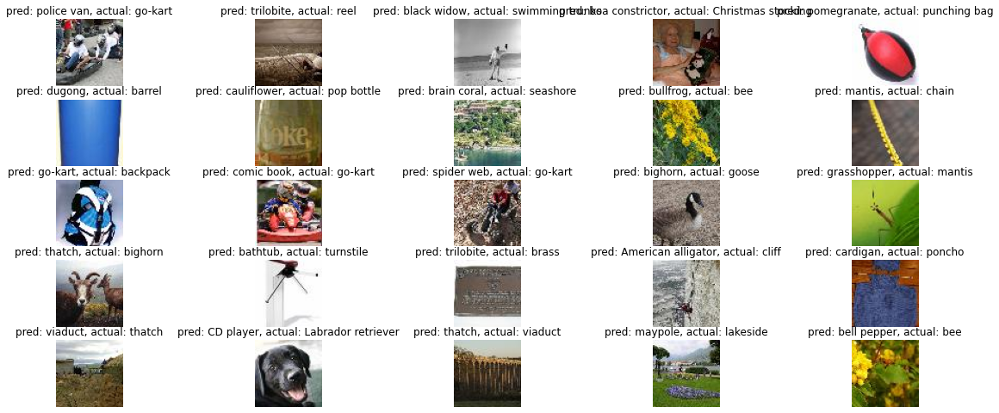

Thu Oct 29 03:09:23 2020 Train Epoch: 1 [0/100000 (0%)]	Loss: 4.256999
Thu Oct 29 03:09:41 2020 Train Epoch: 1 [51200/100000 (51%)]	Loss: 4.202087

Train set: Average loss: 4.2373, Accuracy: 10618/100000 (11%)


Test set: Average loss: 4.0095, Accuracy: 1085/8000 (14%)

Saved /gdrive/My Drive/colab_files/hw1/tiny_imagenet/logs/0.5/001.pt

Thu Oct 29 03:10:03 2020 Train Epoch: 2 [0/100000 (0%)]	Loss: 4.145533
Thu Oct 29 03:10:21 2020 Train Epoch: 2 [51200/100000 (51%)]	Loss: 3.912320

Train set: Average loss: 4.0139, Accuracy: 13626/100000 (14%)


Test set: Average loss: 3.9976, Accuracy: 1060/8000 (13%)

Thu Oct 29 03:10:42 2020 Train Epoch: 3 [0/100000 (0%)]	Loss: 4.022151
Thu Oct 29 03:11:00 2020 Train Epoch: 3 [51200/100000 (51%)]	Loss: 4.031270

Train set: Average loss: 3.8928, Accuracy: 15343/100000 (15%)


Test set: Average loss: 4.0591, Accuracy: 1087/8000 (14%)

Saved /gdrive/My Drive/colab_files/hw1/tiny_imagenet/logs/0.5/003.pt

Thu Oct 29 03:11:22 2020 Train Epoch: 4 [0/1000

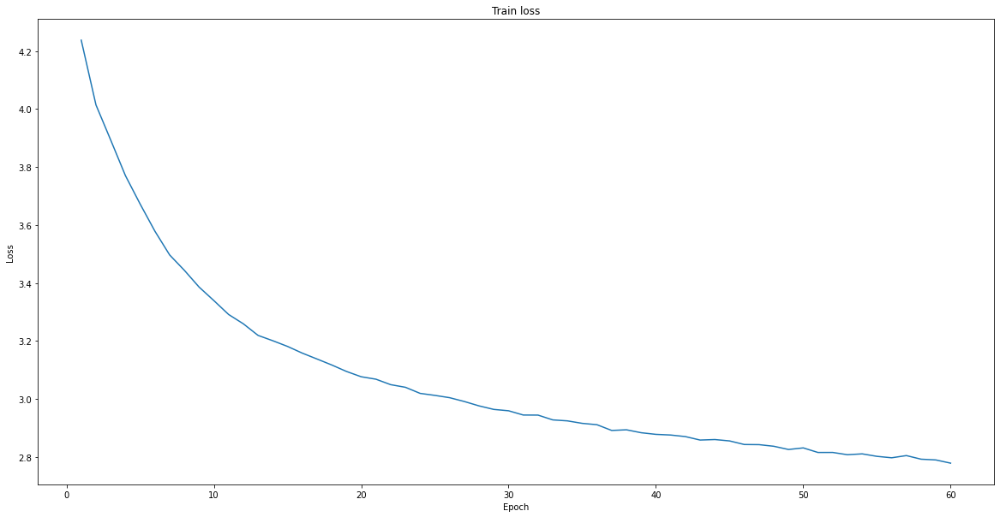

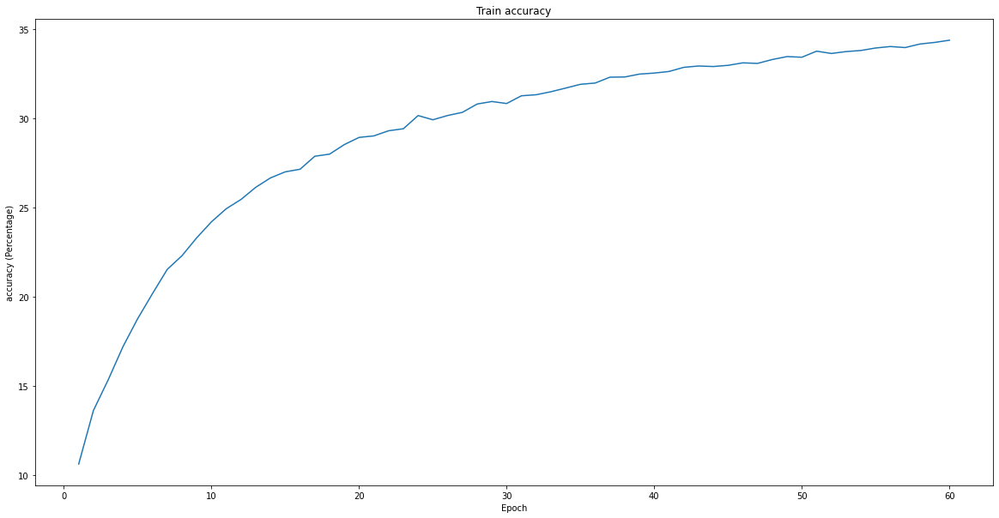

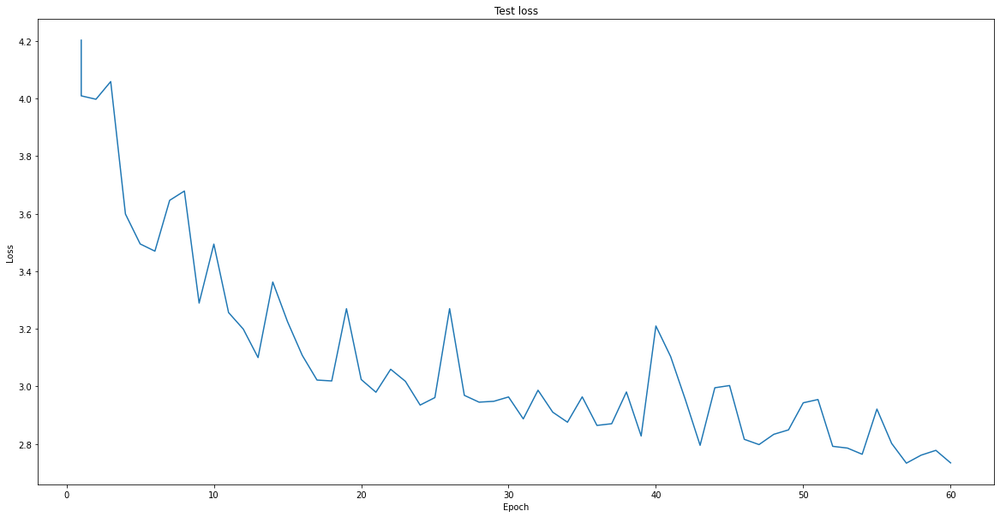

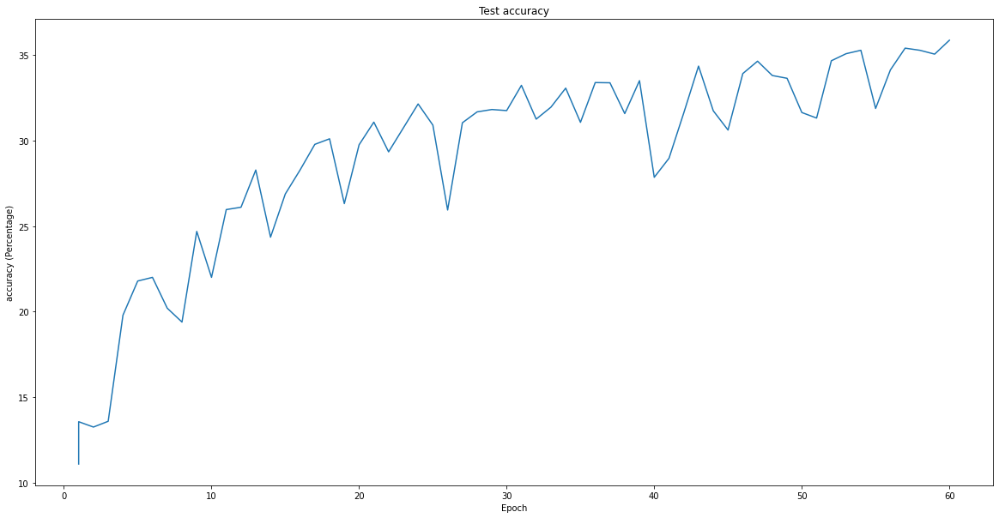

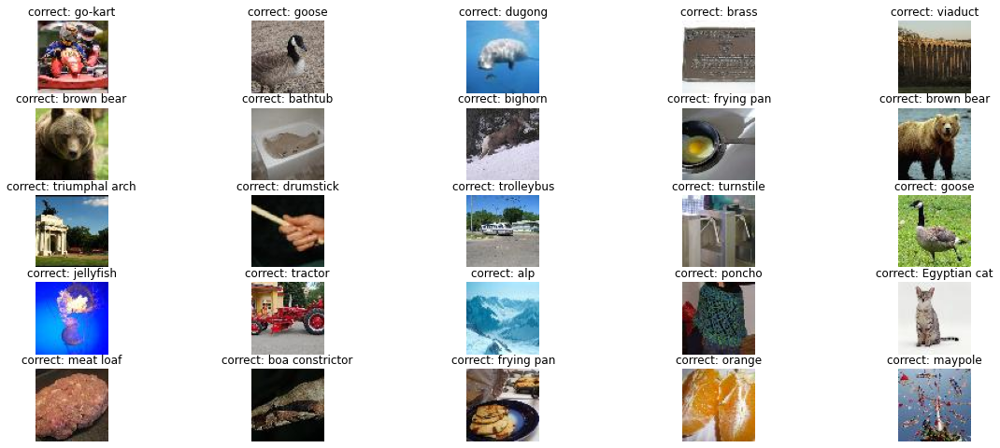

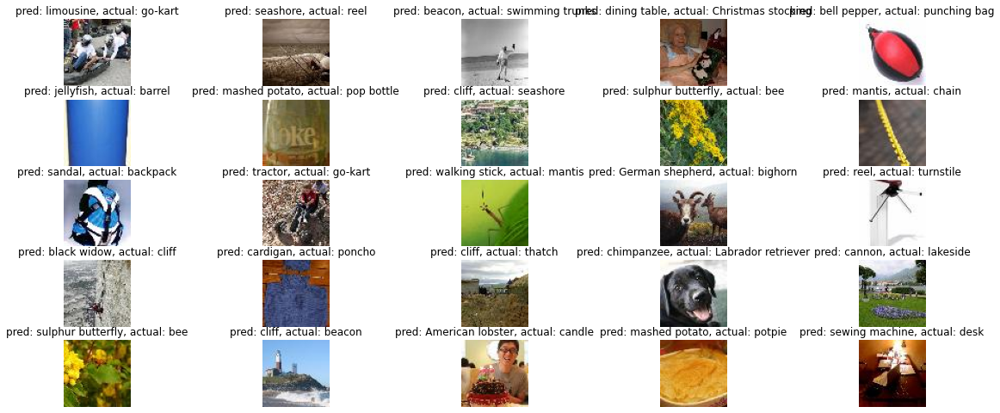

In [ ]:

#KMARATHE 
# Using deeper network with increased weight decay and dropout to avoid overfitting
# increased number of epochs to 60
# increased learning rate
class TinyImagenetNet_5(nn.Module):
    def __init__(self):
        super(TinyImagenetNet_5, self).__init__()
        # TODO define the layers
        self.conv1 = nn.Conv2d(in_channels = 3, out_channels = 32, kernel_size = 3, stride=1, padding=1) 
        self.conv2 = nn.Conv2d(in_channels = 32, out_channels = 64, kernel_size = 3, stride=1, padding=1) 
        self.conv3 = nn.Conv2d(in_channels = 64, out_channels = 128, kernel_size = 3, stride=1, padding=1)
        self.conv4 = nn.Conv2d(in_channels = 128, out_channels = 256, kernel_size = 3, stride=1, padding=1)
        self.conv5 = nn.Conv2d(in_channels = 256, out_channels = 512, kernel_size = 3, stride=1, padding=1)
        self.conv6 = nn.Conv2d(in_channels = 512, out_channels = 1024, kernel_size = 3, stride=1, padding=1)


 
        
        self.maxpool = nn.MaxPool2d(2, stride=2)
        self.dropout = nn.Dropout2d(p =0.1)

        self.conv1_bn = nn.BatchNorm2d(num_features = 32)
        self.conv2_bn = nn.BatchNorm2d(num_features  = 64)
        self.conv3_bn = nn.BatchNorm2d(num_features  = 128)
        self.conv4_bn = nn.BatchNorm2d(num_features  = 256)
        self.conv5_bn = nn.BatchNorm2d(num_features  = 512)
        self.conv6_bn = nn.BatchNorm2d(num_features  = 1024)
        

        self.fc1 = nn.Linear(in_features = 1024, out_features = 512)
        self.fc2 = nn.Linear(in_features = 512, out_features  = 200)
        self.accuracy = None
        
        #raise NotImplementedError('Need to define the layers for your network')

    def forward(self, x):
        # TODO define the forward pass
        #raise NotImplementedError('Need to define the forward pass')
        x = self.conv1_bn(self.conv1(x)) #output 32 64x64
        x = F.relu(x)
        x = self.maxpool(x) #output 32 32x32
        x = self.dropout(x)
        
        x = self.conv2_bn(self.conv2(x)) #output 64 32x32
        x = F.relu(x)
        x = self.maxpool(x) #output 64 16x16
        x = self.dropout(x)

        x = self.conv3_bn(self.conv3(x)) #output 128 16x16
        x = F.relu(x)
        x = self.maxpool(x) #output 128 8x8
        x = self.dropout(x)


        x = self.conv4_bn(self.conv4(x)) #output 256 8x8
        x = F.relu(x)
        x = self.maxpool(x) #output 256 4x4
        x = self.dropout(x)


        x = self.conv5_bn(self.conv5(x)) #output 512 4x4
        x = F.relu(x)
        x = self.maxpool(x) #output 512 2x2
        x = self.dropout(x)


        x = self.conv6_bn(self.conv6(x)) #output 1024 2x2
        x = F.relu(x)
        x = self.maxpool(x) #output 1024 1x1
        x = self.dropout(x)

       
        x = torch.flatten(x, 1)
        x = self.fc1(x)
        x = F.relu(x)
        x = self.fc2(x)
        return x
  

    def loss(self, prediction, label, reduction='mean'):
        loss_val = F.cross_entropy(prediction, label.squeeze(), reduction=reduction)
        return loss_val

    def save_model(self, file_path, num_to_keep=1):
        pt_util.save(self, file_path, num_to_keep)
        
    def save_best_model(self, accuracy, file_path, num_to_keep=1):
        if self.accuracy == None or accuracy > self.accuracy:
            self.accuracy = accuracy
            self.save_model(file_path, num_to_keep)

    def load_model(self, file_path):
        pt_util.restore(self, file_path)

    def load_last_model(self, dir_path):
        return pt_util.restore_latest(self, dir_path)










# Play around with these constants, you may find a better setting.
BATCH_SIZE = 512
TEST_BATCH_SIZE = 10
EPOCHS = 60
LEARNING_RATE = 0.05
MOMENTUM = 0.9
USE_CUDA = True
SEED = 0
PRINT_INTERVAL = 100
WEIGHT_DECAY = 0.001

EXPERIMENT_VERSION = "0.5" # increment this to start a new experiment
LOG_PATH = DATA_PATH + 'logs/' + EXPERIMENT_VERSION + '/'

# Now the actual training code
use_cuda = USE_CUDA and torch.cuda.is_available()

torch.manual_seed(SEED)

device = torch.device("cuda" if use_cuda else "cpu")
print('Using device', device)
import multiprocessing
print('num cpus:', multiprocessing.cpu_count())

kwargs = {'num_workers': multiprocessing.cpu_count(),
          'pin_memory': True} if use_cuda else {}

class_names = [line.strip().split(', ') for line in open(DATA_PATH + 'class_names.txt')]
name_to_class = {line[1]: line[0] for line in class_names}
class_names = [line[1] for line in class_names]

train_loader = torch.utils.data.DataLoader(data_train, batch_size=BATCH_SIZE,
                                           shuffle=True, **kwargs)
test_loader = torch.utils.data.DataLoader(data_test, batch_size=TEST_BATCH_SIZE,
                                          shuffle=False, **kwargs)

model = TinyImagenetNet_5().to(device)
optimizer = optim.SGD(model.parameters(), lr=LEARNING_RATE, momentum=MOMENTUM, weight_decay=WEIGHT_DECAY)
start_epoch = model.load_last_model(LOG_PATH)

train_losses, train_accuracies, test_losses, test_accuracies = pt_util.read_log(LOG_PATH + 'log.pkl', ([], [], [], [] ))
test_loss, test_accuracy, correct_images, correct_val, error_images, predicted_val, gt_val = test(model, device, test_loader, True)

correct_images = pt_util.to_scaled_uint8(correct_images.transpose(0, 2, 3, 1))
error_images = pt_util.to_scaled_uint8(error_images.transpose(0, 2, 3, 1))
pt_util.show_images(correct_images, ['correct: %s' % class_names[aa] for aa in correct_val])
pt_util.show_images(error_images, ['pred: %s, actual: %s' % (class_names[aa], class_names[bb]) for aa, bb in zip(predicted_val, gt_val)])

test_losses.append((start_epoch, test_loss))
test_accuracies.append((start_epoch, test_accuracy))

try:
    for epoch in range(start_epoch, EPOCHS + 1):
        train_loss, train_accuracy = train(model, device, train_loader, optimizer, epoch, PRINT_INTERVAL)
        test_loss, test_accuracy, correct_images, correct_val, error_images, predicted_val, gt_val = test(model, device, test_loader, True)
        train_losses.append((epoch, train_loss))
        train_accuracies.append((epoch, train_accuracy))
        test_losses.append((epoch, test_loss))
        test_accuracies.append((epoch, test_accuracy))
        pt_util.write_log(LOG_PATH + '.pkl', (train_losses, test_losses, test_accuracies))
        model.save_best_model(test_accuracy, LOG_PATH + '%03d.pt' % epoch)


except KeyboardInterrupt as ke:
    print('Interrupted')
except:
    import traceback
    traceback.print_exc()
finally:
    model.save_model(LOG_PATH + '%03d.pt' % epoch, 0)
    ep, val = zip(*train_losses)
    pt_util.plot(ep, val, 'Train loss', 'Epoch', 'Loss')
    ep, val = zip(*train_accuracies)
    pt_util.plot(ep, val, 'Train accuracy', 'Epoch', 'accuracy (Percentage)')
    ep, val = zip(*test_losses)
    pt_util.plot(ep, val, 'Test loss', 'Epoch', 'Loss')
    ep, val = zip(*test_accuracies)
    pt_util.plot(ep, val, 'Test accuracy', 'Epoch', 'accuracy (Percentage)')
    correct_images = pt_util.to_scaled_uint8(correct_images.transpose(0, 2, 3, 1))
    error_images = pt_util.to_scaled_uint8(error_images.transpose(0, 2, 3, 1))
    pt_util.show_images(correct_images, ['correct: %s' % class_names[aa] for aa in correct_val])
    pt_util.show_images(error_images, ['pred: %s, actual: %s' % (class_names[aa], class_names[bb]) for aa, bb in zip(predicted_val, gt_val)])





Using device cuda
num cpus: 2

Test set: Average loss: 5.2984, Accuracy: 40/8000 (0%)



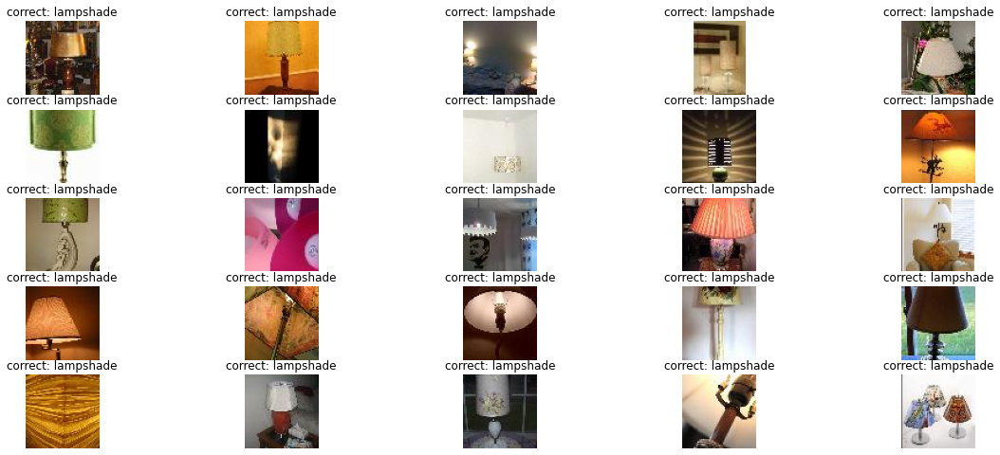

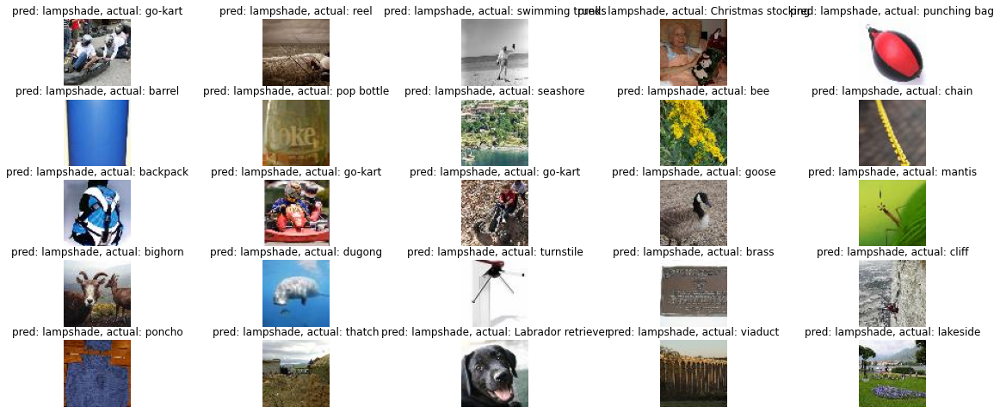

Thu Oct 29 04:37:05 2020 Train Epoch: 0 [0/100000 (0%)]	Loss: 5.321841
Thu Oct 29 04:37:23 2020 Train Epoch: 0 [51200/100000 (51%)]	Loss: 4.750789

Train set: Average loss: 4.8175, Accuracy: 4168/100000 (4%)


Test set: Average loss: 4.4916, Accuracy: 561/8000 (7%)

Saved /gdrive/My Drive/colab_files/hw1/tiny_imagenet/logs/0.6/000.pt

Thu Oct 29 04:37:45 2020 Train Epoch: 1 [0/100000 (0%)]	Loss: 4.536967
Thu Oct 29 04:38:02 2020 Train Epoch: 1 [51200/100000 (51%)]	Loss: 4.230371

Train set: Average loss: 4.3367, Accuracy: 9002/100000 (9%)


Test set: Average loss: 4.2327, Accuracy: 839/8000 (10%)

Saved /gdrive/My Drive/colab_files/hw1/tiny_imagenet/logs/0.6/001.pt

Thu Oct 29 04:38:24 2020 Train Epoch: 2 [0/100000 (0%)]	Loss: 4.232132
Thu Oct 29 04:38:42 2020 Train Epoch: 2 [51200/100000 (51%)]	Loss: 4.297922

Train set: Average loss: 4.1244, Accuracy: 11948/100000 (12%)


Test set: Average loss: 4.2424, Accuracy: 902/8000 (11%)

Saved /gdrive/My Drive/colab_files/hw1/tiny_imagenet/lo

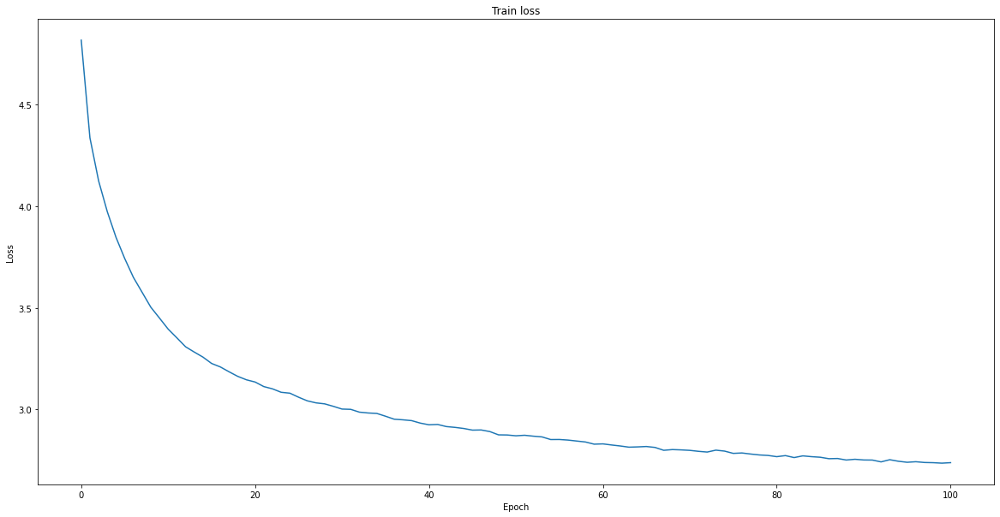

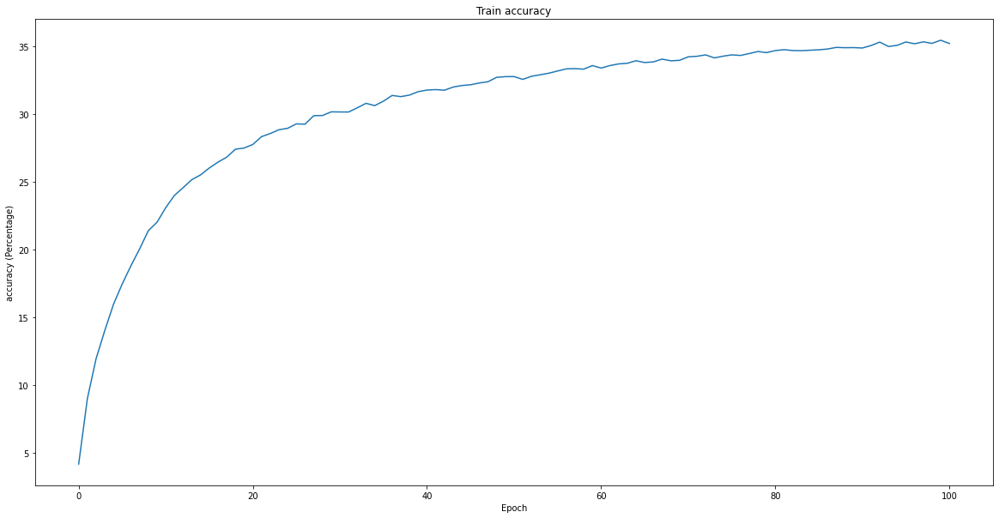

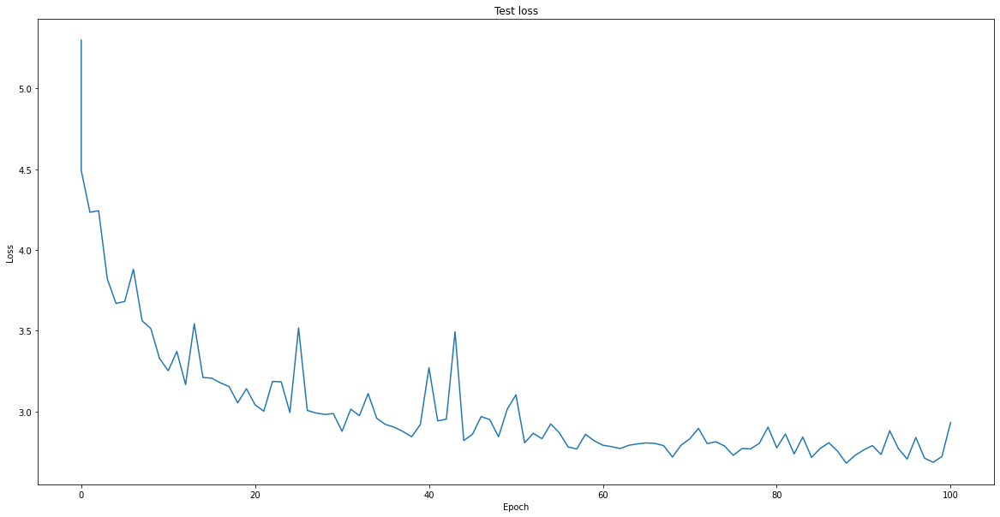

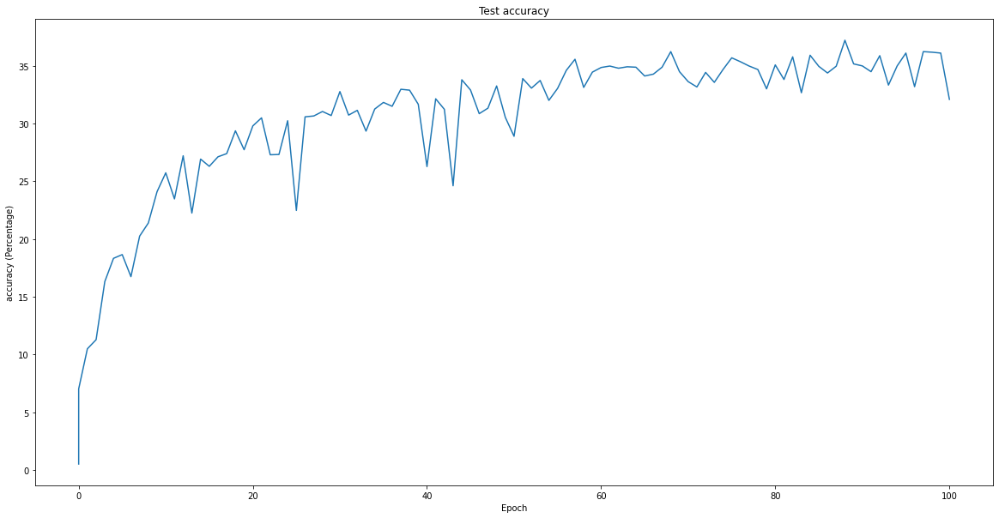

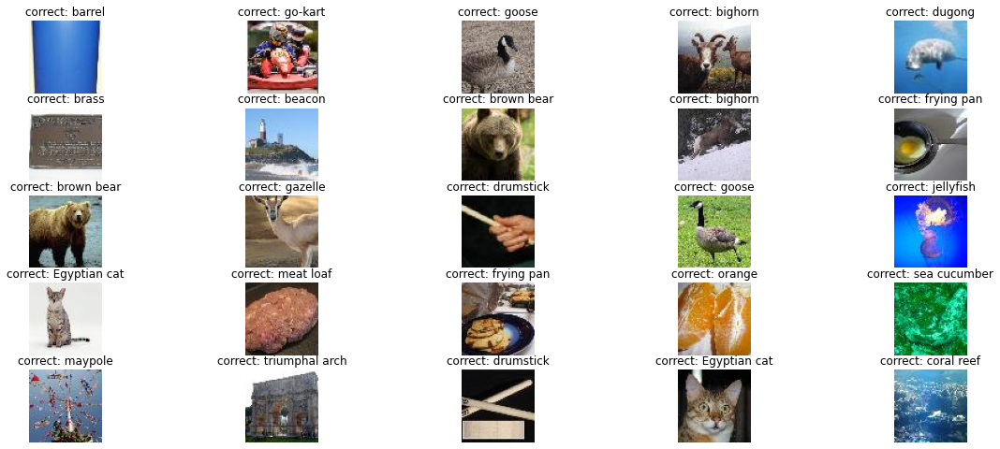

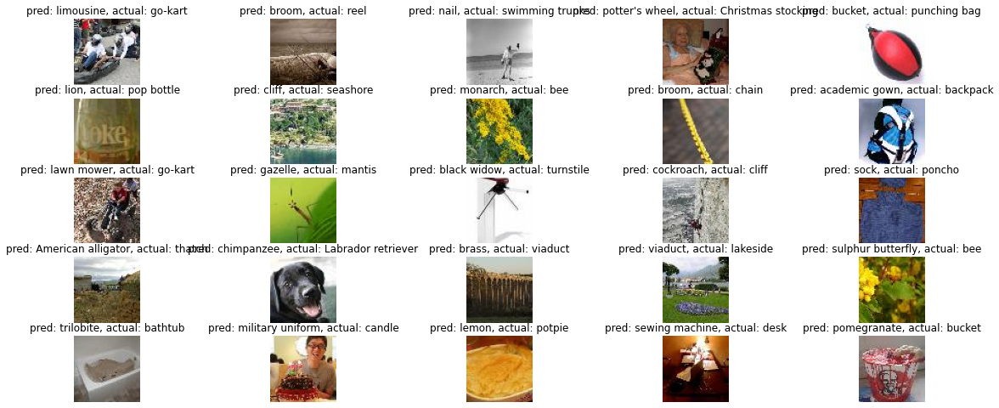

In [ ]:

#KMARATHE 
# Using deeper network with increased weight decay and dropout to avoid overfitting
# increased number of epochs to 100

class TinyImagenetNet_6(nn.Module):
    def __init__(self):
        super(TinyImagenetNet_6, self).__init__()
        # TODO define the layers
        self.conv1 = nn.Conv2d(in_channels = 3, out_channels = 32, kernel_size = 3, stride=1, padding=1) 
        self.conv2 = nn.Conv2d(in_channels = 32, out_channels = 64, kernel_size = 3, stride=1, padding=1) 
        self.conv3 = nn.Conv2d(in_channels = 64, out_channels = 128, kernel_size = 3, stride=1, padding=1)
        self.conv4 = nn.Conv2d(in_channels = 128, out_channels = 256, kernel_size = 3, stride=1, padding=1)
        self.conv5 = nn.Conv2d(in_channels = 256, out_channels = 512, kernel_size = 3, stride=1, padding=1)
        self.conv6 = nn.Conv2d(in_channels = 512, out_channels = 1024, kernel_size = 3, stride=1, padding=1)


 
        
        self.maxpool = nn.MaxPool2d(2, stride=2)
        self.dropout = nn.Dropout2d(p =0.1)

        self.conv1_bn = nn.BatchNorm2d(num_features = 32)
        self.conv2_bn = nn.BatchNorm2d(num_features  = 64)
        self.conv3_bn = nn.BatchNorm2d(num_features  = 128)
        self.conv4_bn = nn.BatchNorm2d(num_features  = 256)
        self.conv5_bn = nn.BatchNorm2d(num_features  = 512)
        self.conv6_bn = nn.BatchNorm2d(num_features  = 1024)
        

        self.fc1 = nn.Linear(in_features = 1024, out_features = 512)
        self.fc2 = nn.Linear(in_features = 512, out_features  = 200)
        self.accuracy = None
        
        #raise NotImplementedError('Need to define the layers for your network')

    def forward(self, x):
        # TODO define the forward pass
        #raise NotImplementedError('Need to define the forward pass')
        x = self.conv1_bn(self.conv1(x)) #output 32 64x64
        x = F.relu(x)
        x = self.maxpool(x) #output 32 32x32
        x = self.dropout(x)
        
        x = self.conv2_bn(self.conv2(x)) #output 64 32x32
        x = F.relu(x)
        x = self.maxpool(x) #output 64 16x16
        x = self.dropout(x)

        x = self.conv3_bn(self.conv3(x)) #output 128 16x16
        x = F.relu(x)
        x = self.maxpool(x) #output 128 8x8
        x = self.dropout(x)


        x = self.conv4_bn(self.conv4(x)) #output 256 8x8
        x = F.relu(x)
        x = self.maxpool(x) #output 256 4x4
        x = self.dropout(x)


        x = self.conv5_bn(self.conv5(x)) #output 512 4x4
        x = F.relu(x)
        x = self.maxpool(x) #output 512 2x2
        x = self.dropout(x)


        x = self.conv6_bn(self.conv6(x)) #output 1024 2x2
        x = F.relu(x)
        x = self.maxpool(x) #output 1024 1x1
        x = self.dropout(x)

       
        x = torch.flatten(x, 1)
        x = self.fc1(x)
        x = F.relu(x)
        x = self.fc2(x)
        return x
  

    def loss(self, prediction, label, reduction='mean'):
        loss_val = F.cross_entropy(prediction, label.squeeze(), reduction=reduction)
        return loss_val

    def save_model(self, file_path, num_to_keep=1):
        pt_util.save(self, file_path, num_to_keep)
        
    def save_best_model(self, accuracy, file_path, num_to_keep=1):
        if self.accuracy == None or accuracy > self.accuracy:
            self.accuracy = accuracy
            self.save_model(file_path, num_to_keep)

    def load_model(self, file_path):
        pt_util.restore(self, file_path)

    def load_last_model(self, dir_path):
        return pt_util.restore_latest(self, dir_path)










# Play around with these constants, you may find a better setting.
BATCH_SIZE = 512
TEST_BATCH_SIZE = 10
EPOCHS = 100
LEARNING_RATE = 0.05
MOMENTUM = 0.9
USE_CUDA = True
SEED = 0
PRINT_INTERVAL = 100
WEIGHT_DECAY = 0.001

EXPERIMENT_VERSION = "0.6" # increment this to start a new experiment
LOG_PATH = DATA_PATH + 'logs/' + EXPERIMENT_VERSION + '/'

# Now the actual training code
use_cuda = USE_CUDA and torch.cuda.is_available()

torch.manual_seed(SEED)

device = torch.device("cuda" if use_cuda else "cpu")
print('Using device', device)
import multiprocessing
print('num cpus:', multiprocessing.cpu_count())

kwargs = {'num_workers': multiprocessing.cpu_count(),
          'pin_memory': True} if use_cuda else {}

class_names = [line.strip().split(', ') for line in open(DATA_PATH + 'class_names.txt')]
name_to_class = {line[1]: line[0] for line in class_names}
class_names = [line[1] for line in class_names]

train_loader = torch.utils.data.DataLoader(data_train, batch_size=BATCH_SIZE,
                                           shuffle=True, **kwargs)
test_loader = torch.utils.data.DataLoader(data_test, batch_size=TEST_BATCH_SIZE,
                                          shuffle=False, **kwargs)

model = TinyImagenetNet_6().to(device)
optimizer = optim.SGD(model.parameters(), lr=LEARNING_RATE, momentum=MOMENTUM, weight_decay=WEIGHT_DECAY)
start_epoch = model.load_last_model(LOG_PATH)

train_losses, train_accuracies, test_losses, test_accuracies = pt_util.read_log(LOG_PATH + 'log.pkl', ([], [], [], [] ))
test_loss, test_accuracy, correct_images, correct_val, error_images, predicted_val, gt_val = test(model, device, test_loader, True)

correct_images = pt_util.to_scaled_uint8(correct_images.transpose(0, 2, 3, 1))
error_images = pt_util.to_scaled_uint8(error_images.transpose(0, 2, 3, 1))
pt_util.show_images(correct_images, ['correct: %s' % class_names[aa] for aa in correct_val])
pt_util.show_images(error_images, ['pred: %s, actual: %s' % (class_names[aa], class_names[bb]) for aa, bb in zip(predicted_val, gt_val)])

test_losses.append((start_epoch, test_loss))
test_accuracies.append((start_epoch, test_accuracy))

try:
    for epoch in range(start_epoch, EPOCHS + 1):
        train_loss, train_accuracy = train(model, device, train_loader, optimizer, epoch, PRINT_INTERVAL)
        test_loss, test_accuracy, correct_images, correct_val, error_images, predicted_val, gt_val = test(model, device, test_loader, True)
        train_losses.append((epoch, train_loss))
        train_accuracies.append((epoch, train_accuracy))
        test_losses.append((epoch, test_loss))
        test_accuracies.append((epoch, test_accuracy))
        pt_util.write_log(LOG_PATH + '.pkl', (train_losses, test_losses, test_accuracies))
        model.save_best_model(test_accuracy, LOG_PATH + '%03d.pt' % epoch)


except KeyboardInterrupt as ke:
    print('Interrupted')
except:
    import traceback
    traceback.print_exc()
finally:
    model.save_model(LOG_PATH + '%03d.pt' % epoch, 0)
    ep, val = zip(*train_losses)
    pt_util.plot(ep, val, 'Train loss', 'Epoch', 'Loss')
    ep, val = zip(*train_accuracies)
    pt_util.plot(ep, val, 'Train accuracy', 'Epoch', 'accuracy (Percentage)')
    ep, val = zip(*test_losses)
    pt_util.plot(ep, val, 'Test loss', 'Epoch', 'Loss')
    ep, val = zip(*test_accuracies)
    pt_util.plot(ep, val, 'Test accuracy', 'Epoch', 'accuracy (Percentage)')
    correct_images = pt_util.to_scaled_uint8(correct_images.transpose(0, 2, 3, 1))
    error_images = pt_util.to_scaled_uint8(error_images.transpose(0, 2, 3, 1))
    pt_util.show_images(correct_images, ['correct: %s' % class_names[aa] for aa in correct_val])
    pt_util.show_images(error_images, ['pred: %s, actual: %s' % (class_names[aa], class_names[bb]) for aa, bb in zip(predicted_val, gt_val)])





Using device cuda
num cpus: 2

Test set: Average loss: 5.2989, Accuracy: 38/8000 (0%)



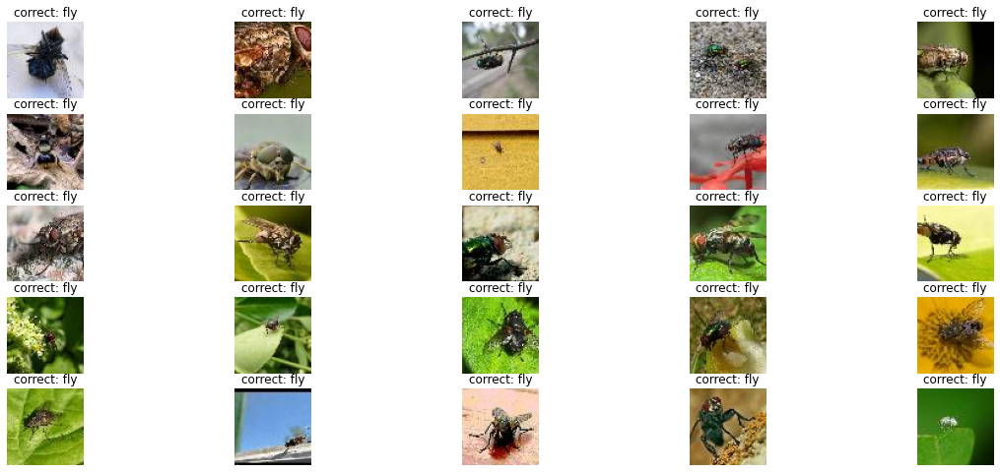

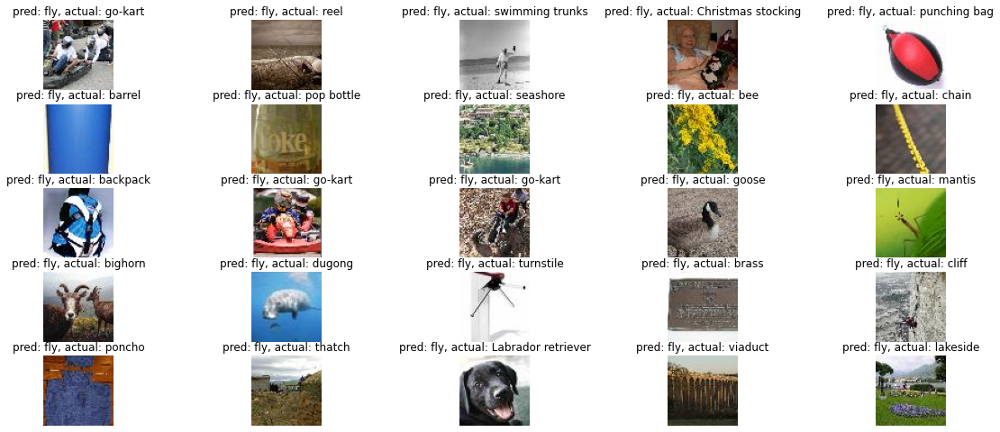

Thu Oct 29 22:30:08 2020 Train Epoch: 0 [0/100000 (0%)]	Loss: 5.358559
Thu Oct 29 22:30:40 2020 Train Epoch: 0 [51200/100000 (51%)]	Loss: 4.267571

Train set: Average loss: 4.3541, Accuracy: 8707/100000 (9%)


Test set: Average loss: 4.2155, Accuracy: 867/8000 (11%)

Saved /gdrive/My Drive/colab_files/hw1/tiny_imagenet/logs/0.7/000.pt

Thu Oct 29 22:31:18 2020 Train Epoch: 1 [0/100000 (0%)]	Loss: 3.782952
Thu Oct 29 22:31:49 2020 Train Epoch: 1 [51200/100000 (51%)]	Loss: 3.612603

Train set: Average loss: 3.6096, Accuracy: 18640/100000 (19%)


Test set: Average loss: 4.0294, Accuracy: 1095/8000 (14%)

Saved /gdrive/My Drive/colab_files/hw1/tiny_imagenet/logs/0.7/001.pt

Thu Oct 29 22:32:28 2020 Train Epoch: 2 [0/100000 (0%)]	Loss: 3.367264
Thu Oct 29 22:32:59 2020 Train Epoch: 2 [51200/100000 (51%)]	Loss: 3.253099

Train set: Average loss: 3.2708, Accuracy: 24166/100000 (24%)


Test set: Average loss: 3.3072, Accuracy: 1859/8000 (23%)

Saved /gdrive/My Drive/colab_files/hw1/tiny_imagen

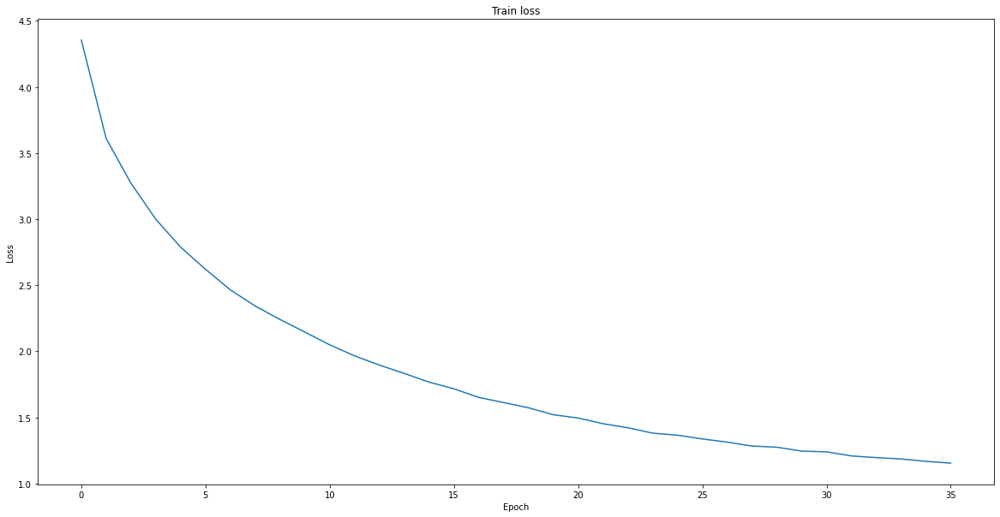

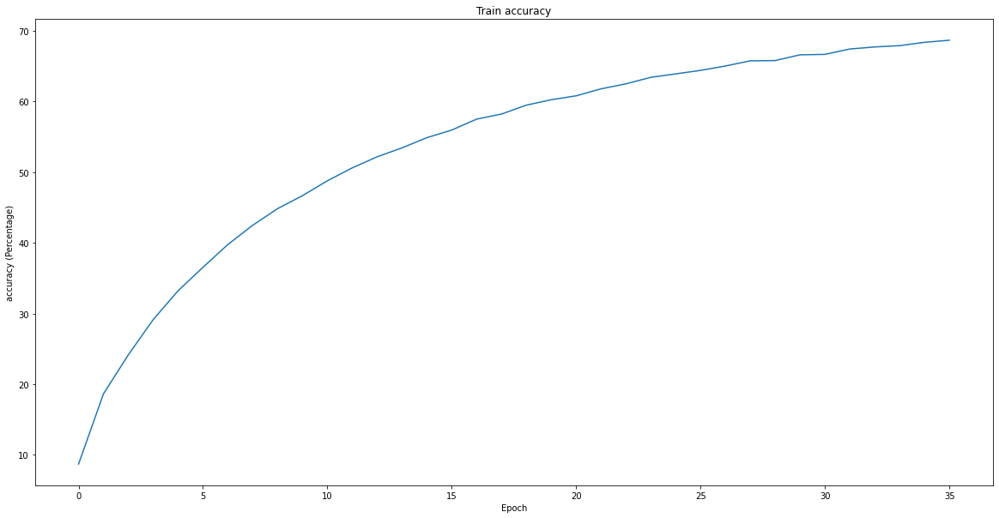

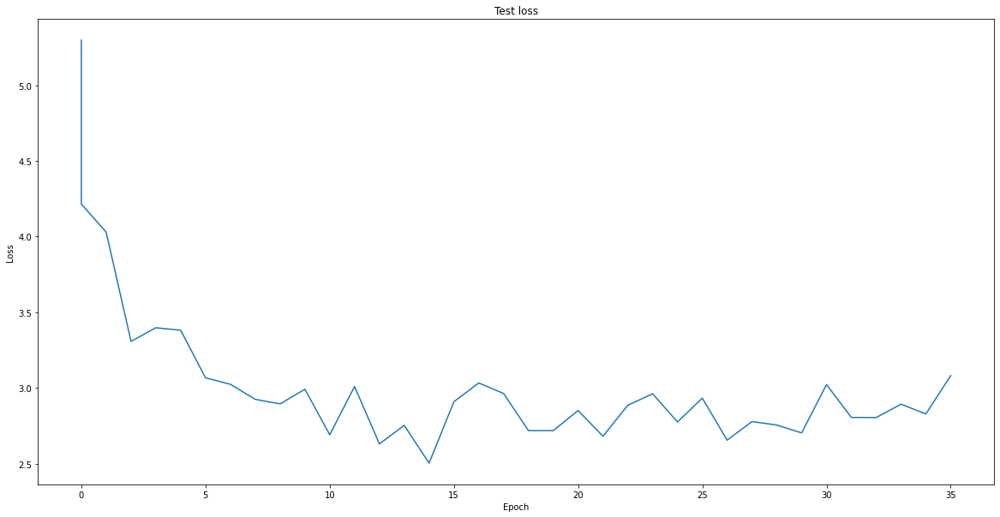

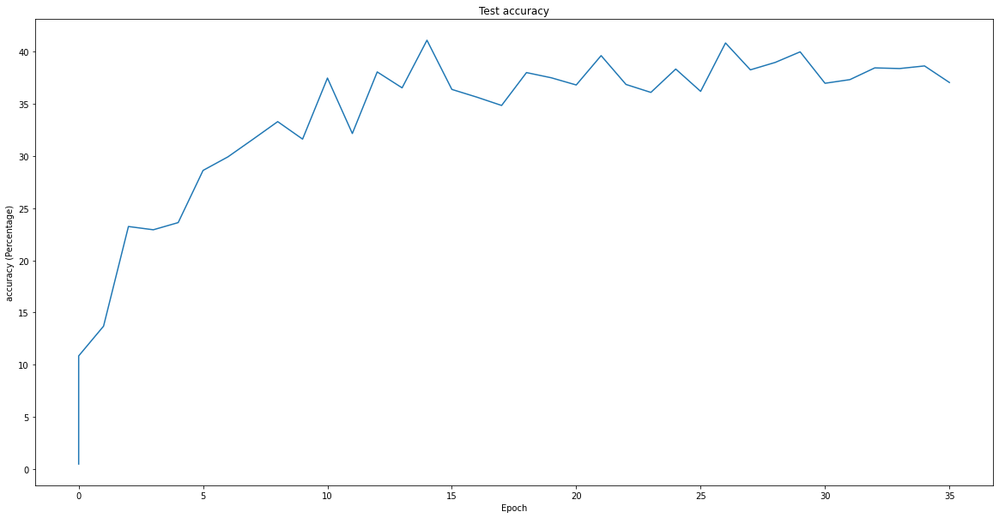

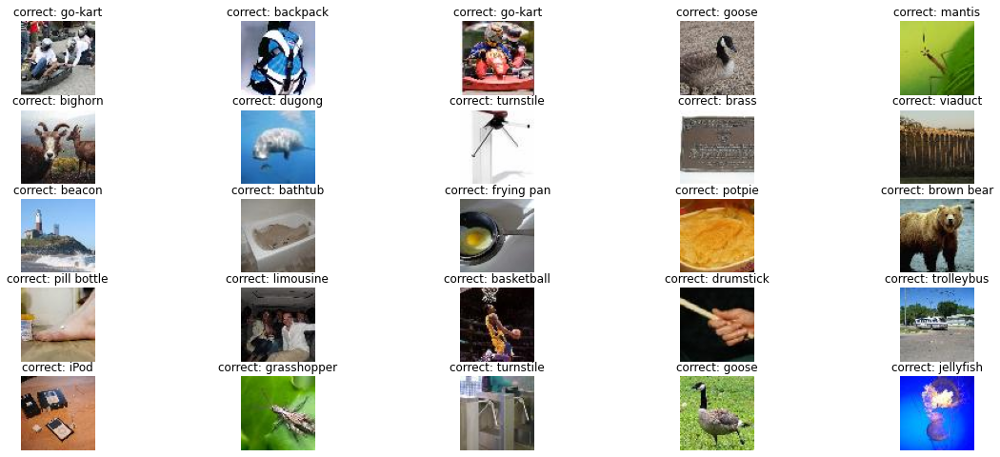

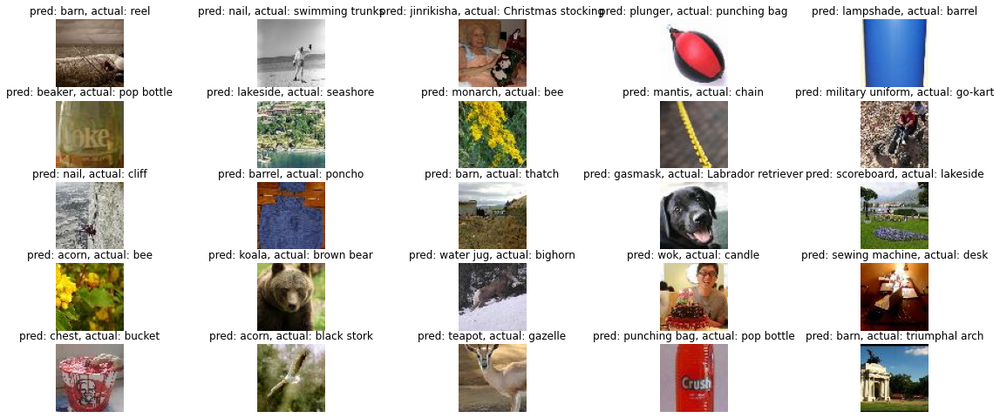

In [ ]:
# KMARATHE
# Trying different data augmentation settings 
# Increased learning rates, leakyrelu

train_transforms = transforms.Compose([
    transforms.ToPILImage(),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(10),
    transforms.ToTensor(),
    ])

test_transforms = transforms.Compose([
    transforms.ToTensor(),
    ])

data_train = H5Dataset(DATA_PATH + 'train.h5', transform=train_transforms)


#KMARATHE added this
#print(data_train.__len__())
#print(data_train.__getitem__(99999))
# print(len(data_train))
# print(type(data_train[0]))
# print(data_train[0][0].size())
data_test = H5Dataset(DATA_PATH + 'val.h5', transform=test_transforms)
#print(len(data_test))



#KMARATHE 
# Using deeper network with increased weight decay and dropout to avoid overfitting
# increased number of epochs to 60
# increased learning rate
class TinyImagenetNet_7(nn.Module):
    def __init__(self):
        super(TinyImagenetNet_7, self).__init__()
        # TODO define the layers
        self.conv1 = nn.Conv2d(in_channels = 3, out_channels = 32, kernel_size = 3, stride=1, padding=1) 
        self.conv_one_by_one = nn.Conv2d(in_channels = 32, out_channels = 64, kernel_size = 1, stride=1, padding=0) 

        self.conv2 = nn.Conv2d(in_channels = 64, out_channels = 128, kernel_size = 3, stride=1, padding=1)
        self.conv3 = nn.Conv2d(in_channels = 128, out_channels = 256, kernel_size = 3, stride=1, padding=1)
        self.conv4 = nn.Conv2d(in_channels = 256, out_channels = 512, kernel_size = 3, stride=1, padding=1)
        self.conv5 = nn.Conv2d(in_channels = 512, out_channels = 1024, kernel_size = 3, stride=1, padding=1)
        self.conv6 = nn.Conv2d(in_channels = 1024, out_channels = 2048, kernel_size = 3, stride=1, padding=1)



 
        
        self.maxpool = nn.MaxPool2d(2, stride=2)
        self.LeakyReLU = nn.LeakyReLU(0.1)
        self.dropout = nn.Dropout2d(p =0.1)

        self.conv1_bn = nn.BatchNorm2d(num_features = 32)
        self.conv_one_by_one_bn = nn.BatchNorm2d(num_features = 64)
        
        self.conv2_bn = nn.BatchNorm2d(num_features  = 128)
        self.conv3_bn = nn.BatchNorm2d(num_features  = 256)
        self.conv4_bn = nn.BatchNorm2d(num_features  = 512)
        self.conv5_bn = nn.BatchNorm2d(num_features  = 1024)
        self.conv6_bn = nn.BatchNorm2d(num_features  = 2048)

        

        self.fc1 = nn.Linear(in_features = 2048, out_features = 512)
        self.fc2 = nn.Linear(in_features = 512, out_features  = 200)
        self.accuracy = None
        
        #raise NotImplementedError('Need to define the layers for your network')

    def forward(self, x):
        # TODO define the forward pass
        #raise NotImplementedError('Need to define the forward pass')
        x = self.conv1_bn(self.conv1(x)) #output 32 64x64
        x = self.LeakyReLU(x)
        x = self.maxpool(x) #output 32 32x32
        
        x = self.conv_one_by_one_bn(self.conv_one_by_one(x)) #output 64 32x32
        x = self.LeakyReLU(x)
        
        x = self.conv2_bn(self.conv2(x)) #output 128 32x32
        x = self.LeakyReLU(x)
        x = self.maxpool(x) #output 128 16x16
    

        x = self.conv3_bn(self.conv3(x)) #output 256 16x16
        x = self.LeakyReLU(x)
        x = self.maxpool(x) #output 256 8x8
        


        x = self.conv4_bn(self.conv4(x)) #output 512 8x8
        x = self.LeakyReLU(x)
        x = self.maxpool(x) #output 512 4x4
        


        x = self.conv5_bn(self.conv5(x)) #output 1024 4x4
        x = self.LeakyReLU(x)
        x = self.maxpool(x) #output 1024 2x2
        


        x = self.conv6_bn(self.conv6(x)) #output 2048 2x2
        x = self.LeakyReLU(x)
        x = self.maxpool(x) #output 2048 1x1
  

       
        x = torch.flatten(x, 1)
        x = self.fc1(x)
        x = self.LeakyReLU(x)
        x = self.fc2(x)
        return x
  

    def loss(self, prediction, label, reduction='mean'):
        loss_val = F.cross_entropy(prediction, label.squeeze(), reduction=reduction)
        return loss_val

    def save_model(self, file_path, num_to_keep=1):
        pt_util.save(self, file_path, num_to_keep)
        
    def save_best_model(self, accuracy, file_path, num_to_keep=1):
        if self.accuracy == None or accuracy > self.accuracy:
            self.accuracy = accuracy
            self.save_model(file_path, num_to_keep)

    def load_model(self, file_path):
        pt_util.restore(self, file_path)

    def load_last_model(self, dir_path):
        return pt_util.restore_latest(self, dir_path)










# Play around with these constants, you may find a better setting.
BATCH_SIZE = 512
TEST_BATCH_SIZE = 10
EPOCHS = 35
LEARNING_RATE = 0.1
MOMENTUM = 0.9
USE_CUDA = True
SEED = 0
PRINT_INTERVAL = 100
WEIGHT_DECAY = 0.001

EXPERIMENT_VERSION = "0.7" # increment this to start a new experiment
LOG_PATH = DATA_PATH + 'logs/' + EXPERIMENT_VERSION + '/'

# Now the actual training code
use_cuda = USE_CUDA and torch.cuda.is_available()

torch.manual_seed(SEED)

device = torch.device("cuda" if use_cuda else "cpu")
print('Using device', device)
import multiprocessing
print('num cpus:', multiprocessing.cpu_count())

kwargs = {'num_workers': multiprocessing.cpu_count(),
          'pin_memory': True} if use_cuda else {}

class_names = [line.strip().split(', ') for line in open(DATA_PATH + 'class_names.txt')]
name_to_class = {line[1]: line[0] for line in class_names}
class_names = [line[1] for line in class_names]

train_loader = torch.utils.data.DataLoader(data_train, batch_size=BATCH_SIZE,
                                           shuffle=True, **kwargs)
test_loader = torch.utils.data.DataLoader(data_test, batch_size=TEST_BATCH_SIZE,
                                          shuffle=False, **kwargs)

model = TinyImagenetNet_7().to(device)
optimizer = optim.SGD(model.parameters(), lr=LEARNING_RATE, momentum=MOMENTUM, weight_decay=WEIGHT_DECAY)
start_epoch = model.load_last_model(LOG_PATH)

train_losses, train_accuracies, test_losses, test_accuracies = pt_util.read_log(LOG_PATH + 'log.pkl', ([], [], [], [] ))
test_loss, test_accuracy, correct_images, correct_val, error_images, predicted_val, gt_val = test(model, device, test_loader, True)

correct_images = pt_util.to_scaled_uint8(correct_images.transpose(0, 2, 3, 1))
error_images = pt_util.to_scaled_uint8(error_images.transpose(0, 2, 3, 1))
pt_util.show_images(correct_images, ['correct: %s' % class_names[aa] for aa in correct_val])
pt_util.show_images(error_images, ['pred: %s, actual: %s' % (class_names[aa], class_names[bb]) for aa, bb in zip(predicted_val, gt_val)])

test_losses.append((start_epoch, test_loss))
test_accuracies.append((start_epoch, test_accuracy))

try:
    for epoch in range(start_epoch, EPOCHS + 1):
        train_loss, train_accuracy = train(model, device, train_loader, optimizer, epoch, PRINT_INTERVAL)
        test_loss, test_accuracy, correct_images, correct_val, error_images, predicted_val, gt_val = test(model, device, test_loader, True)
        train_losses.append((epoch, train_loss))
        train_accuracies.append((epoch, train_accuracy))
        test_losses.append((epoch, test_loss))
        test_accuracies.append((epoch, test_accuracy))
        pt_util.write_log(LOG_PATH + '.pkl', (train_losses, test_losses, test_accuracies))
        model.save_best_model(test_accuracy, LOG_PATH + '%03d.pt' % epoch)


except KeyboardInterrupt as ke:
    print('Interrupted')
except:
    import traceback
    traceback.print_exc()
finally:
    model.save_model(LOG_PATH + '%03d.pt' % epoch, 0)
    ep, val = zip(*train_losses)
    pt_util.plot(ep, val, 'Train loss', 'Epoch', 'Loss')
    ep, val = zip(*train_accuracies)
    pt_util.plot(ep, val, 'Train accuracy', 'Epoch', 'accuracy (Percentage)')
    ep, val = zip(*test_losses)
    pt_util.plot(ep, val, 'Test loss', 'Epoch', 'Loss')
    ep, val = zip(*test_accuracies)
    pt_util.plot(ep, val, 'Test accuracy', 'Epoch', 'accuracy (Percentage)')
    correct_images = pt_util.to_scaled_uint8(correct_images.transpose(0, 2, 3, 1))
    error_images = pt_util.to_scaled_uint8(error_images.transpose(0, 2, 3, 1))
    pt_util.show_images(correct_images, ['correct: %s' % class_names[aa] for aa in correct_val])
    pt_util.show_images(error_images, ['pred: %s, actual: %s' % (class_names[aa], class_names[bb]) for aa, bb in zip(predicted_val, gt_val)])





## TinyImageNet Questions

1. What design that you tried worked the best? How many epochs were you able to run it for? Provide the same information from CIFAR question 1.

We carried out following experiments:

**1. Experiment 1:**

 3 convolutional layer architecture with each layer having 
 a. 3 X 3 Convolution with stride =1, padding =1 (Doubling the number of filters)
 b. Batch Normalization
 c. ReLU
 d. Max Pooling   
 At the end of convolutional layers, a couple of fully connected linear layers with ReLU activation.

Parameters :
1.BATCH_SIZE = 512
2.EPOCHS = 20
3.LEARNING_RATE = 0.02
4.WEIGHT_DECAY = 0.0005
5.Added an extra data augmentation transform for training data  = 90 degree rotation
6. All other parameters were same as default

Train Accuracy = 42%
Test Accuracy = 31%
 
**2. Experiment 2**

Kept the architecture same. The only changes made to the previous architecture were:

1. Decreased the learning rate
2. Decreased the batch size
3. increasing the number of epochs
4. added an extra fully connected linear layer
5. Using leaky relu activation

Parameters:
1.BATCH_SIZE = 256
2.EPOCHS = 30
3.LEARNING_RATE = 0.01
4.WEIGHT_DECAY = 0.0005

Train Accuracy= 54%
Test Accuracy = 33%

We observed slight improvement in Training and testing accuracy

**3. Experiment 3**

In this experiment we tried:
1. higher learning rate with dropout after maxpooling layers
2. decresed weight decay
3. lesser number of layers  (2 Convolutional layers)
4. Leaky ReLU activation

Parameters:
BATCH_SIZE = 256
EPOCHS = 30
LEARNING_RATE = 0.1
WEIGHT_DECAY = 0.0001

Train accuracy = 34%
Test accuracy = 21%


**4. Experiment 4**

1. Using deeper network : 5 layer CNN with filter size = 3 , stride = 1, padding = 1

Parameters:
BATCH_SIZE = 512
EPOCHS = 30
LEARNING_RATE = 0.02
WEIGHT_DECAY = 0.0005

**Train set: 51%**
**Test set: 40%**


**5.Experiment 5: BEST MODEL**

1. 6 layer CNN without dropout, Added 1 layer to the previous architecture 
2. Increased the number of epochs
BATCH_SIZE = 512
EPOCHS = 40
LEARNING_RATE = 0.02
WEIGHT_DECAY = 0.0005


**Train accuracy = 57%**
**Test accuracy = 41%**

**6. Experiment 6**

1. Using deeper network with increased weight decay and dropout to avoid overfitting
2. increased number of epochs to 60
3. increased learning rate

BATCH_SIZE = 512
EPOCHS = 60
LEARNING_RATE = 0.05
WEIGHT_DECAY = 0.001


Train accuracy  = 34%
Test accuracy = 36%

The difference between the training accuracy and testing accuracy was significantly reduced. But as we increased the weight decay and added dropout, the accuracy itself did not change much after a certain point.



**7. Experiment 7**
1. Keeping the architecture same, we tried adding the number of epochs and learning rate:
Train set:  (35%)
Test set: (32%)

Increasing the number of epochs did not improve the training and testing accuracies

**8. Experiment 8**
Tried adding an extra layer of 1 X 1 convolution, however no significant improvement was observed on the test set


Train set: 69%
Test set: 37%


**The best model was: Experiment 5: CNN with 6 layers **
Train set: Average loss: 1.6678, Accuracy: 57009/100000 (57%)
Test set: Average loss: 2.5879, Accuracy: 3249/8000 (41%)
 - BATCH_SIZE = 512
 - EPOCHS = 40
 - LEARNING_RATE = 0.02
 - WEIGHT_DECAY = 0.0005
 - Other parameters were kept as default.


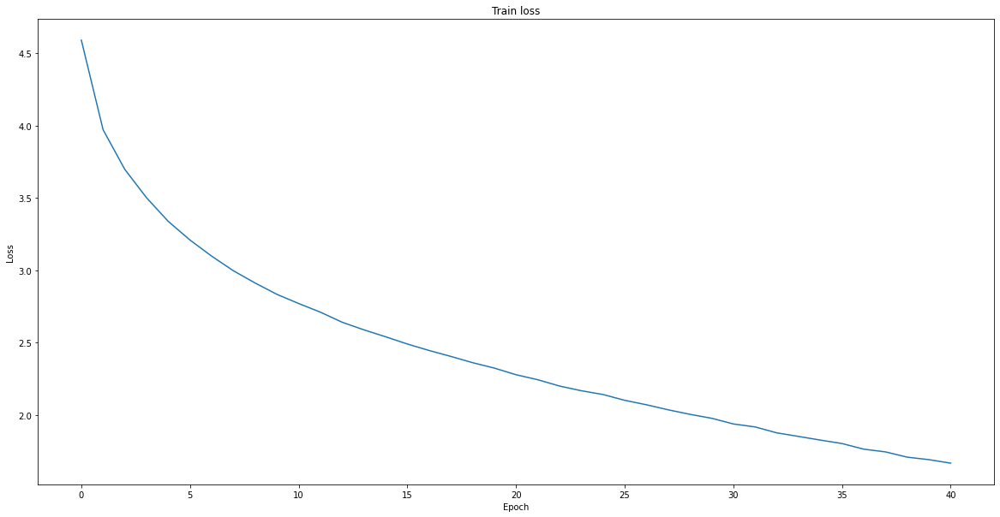





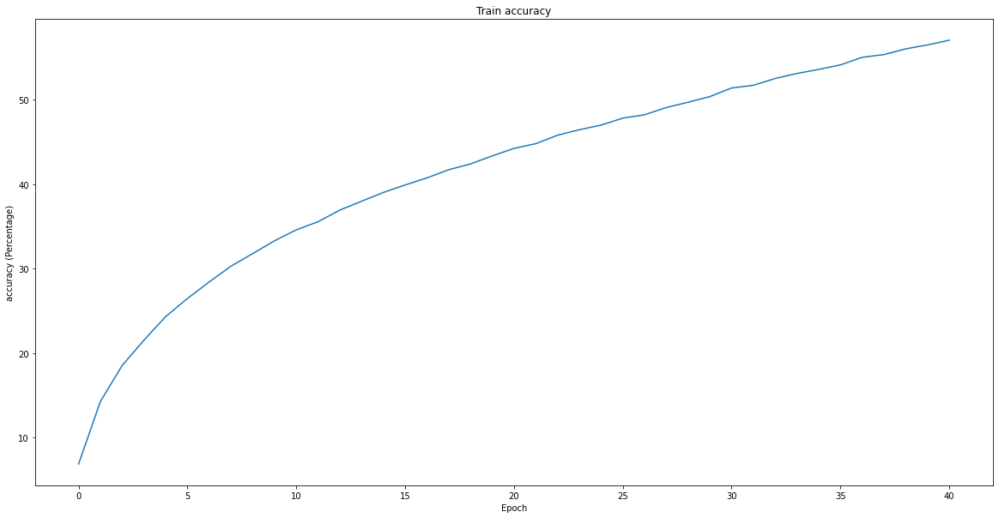



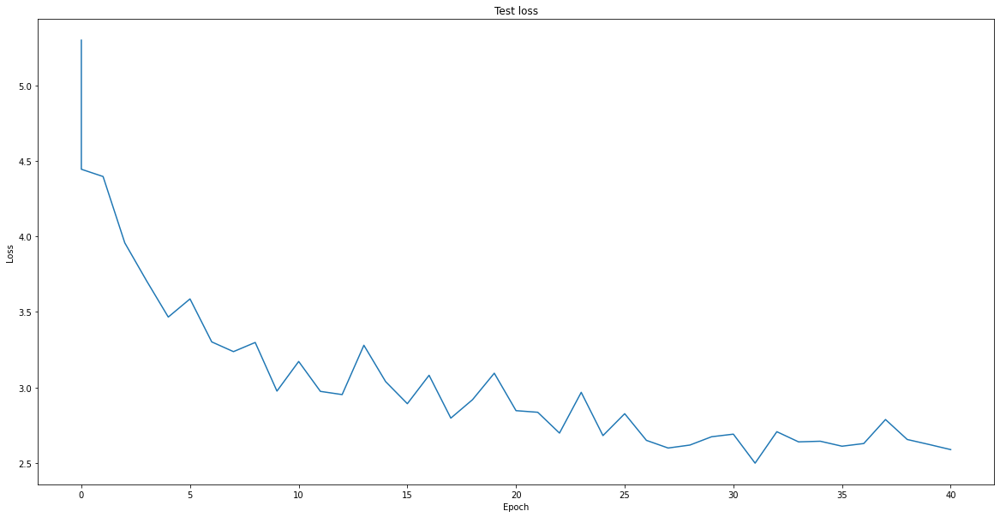



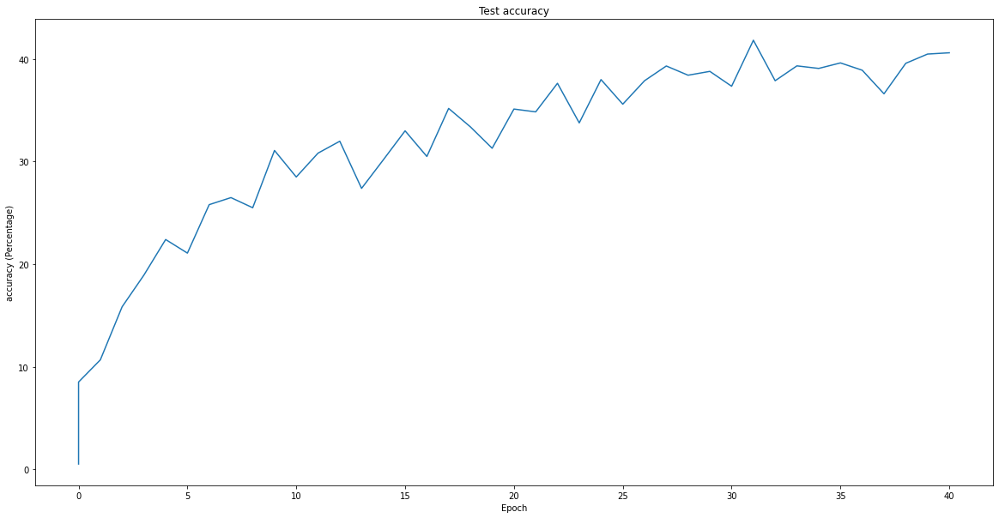

2. Were you able to use larger/deeper networks on TinyImageNet than you used on CIFAR and increase accuracy? If so, why? If not, why not?
 - Yes, we used deeper network for TinyImageNet with 6 convolutional layers.
However, training TinyImageNet was much more challenging than CIFAR and MNIST datasets. Probably because the image size was twice as large as CIFAR/ MNIST. Another reason that adds to the complexity of the problem is number of possible classes in the training dataset. In TinyImageNet number of labels in the dataset are 200, while in MNIST and CIFAR there were 10.
 - The accuracy would saturate around 35- 37% and no significant improvment was observed beyond this point. From the observations we could figure out that deeper networks improve the accuracy. But when we increased the depth of the network, the number of computations would increase significantly and would increase the training time. 
 - Techniques like batch normalization,dropout decrease the difference between training and testing accuracy, but training for more epochs was not very much useful. 
 - Data augmentation techniques helped in avoiding ovefitting
 - If we increased the depth of the network e.g. beyond 8 we got CUDA out of memory error and we had to decrease the batch size. 

3. The real ImageNet dataset has significantly larger images. How would you change your network design if the images were twice as large? How about smaller than Tiny ImageNet? How do you think your accuracy would change? This is open-ended, but we want a more thought-out answer than "I'd resize the images" or "I'd do a larger pooling stride." You don't have to write code to test your hypothesis.

 - If images are twice as large -- If the images are larger, the network needs to capture more information. This is challenging because more resolution means more number of pixels to process and that means more compute power -- Memory (Increaseed space complexity), GPU time (Increased time complexity). 
One solution to this problem is dividing the images into equal parts and parallelizing the network architecture. 
This will also need very deep networks to train as they can learn more detailed features about the objects in the image with earlier layers cpaturing lines and edges, then deeper layers with colors, patterns, more abstract features and objects etc.
For images twice as large as the tinyimagenet, the GPU will have more values to keep in memory at a time. Decreasing the batch size could be a workaround for this problem. 

A recent Google AI's paper -- https://profs.etsmtl.ca/hlombaert/public/medneurips2019/28_CameraReadySubmission_MED-NeurIPS.pdf  has very well explained how they used the technique of spatial partitioning to handle the ultra high resolution images of 3D CT scan. 

- If the images are twice as small -- If the images are small, good accuracy can be achieved using moderate deep architectures. We can use less number of filters for each convolution as compared to the TinyImageNet.

# Turn-in

Download your `hw1.ipynb` and put it in your `uwnet` repository.